In [1]:
import pandas as pd
import numpy as np

import requests
import warnings
warnings.filterwarnings('ignore')
import json
from pprint import pprint


from os import path

import matplotlib
import matplotlib.pyplot as plt
plt.rc('font', size='14')

from datetime import timedelta, datetime

from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
import statsmodels.api as sm
from statsmodels.tsa.ar_model import AR

from sklearn.model_selection import TimeSeriesSplit
from sklearn import metrics

import math

import model
import prepare
import explore


## Acquire

Create a dataframe of activity data from the thumbdrive that was given.

In [2]:
df = pd.read_csv('activity.csv')

## Prepare

Steps in preparing activity dataframe:
1. Format date to %m/%d/%y
2. Convert `Date` column to datetime data type.
3. Columns from the activity csv were stored as objects because of comma values. To convert these objects to integers we selected deleted the commas from each value in the columns. Then stored the column as an integer datatype.
4. Sort the dataframe by `Date` to put our rows in date order.
5. Set the index of the dataframe to the `Date` column.

In [3]:
df = prepare.prep_df(df)

In [4]:
df.head()

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Date,,,,,,,,,
2018-04-26,2635,2931,1.38,2,1347,93,0,0,566
2018-04-27,3649,9971,4.70,19,1158,219,46,17,1752
2018-04-28,3379,3521,1.66,2,702,155,22,11,1124
2018-04-29,2851,1639,0.77,0,891,122,0,0,602
2018-04-30,2825,1323,0.62,0,880,104,0,0,540


In [5]:
# Look at data types
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 225 entries, 2018-04-26 to 2018-12-06
Data columns (total 9 columns):
Calories Burned           225 non-null int64
Steps                     225 non-null int64
Distance                  225 non-null float64
Floors                    225 non-null int64
Minutes Sedentary         225 non-null int64
Minutes Lightly Active    225 non-null int64
Minutes Fairly Active     225 non-null int64
Minutes Very Active       225 non-null int64
Activity Calories         225 non-null int64
dtypes: float64(1), int64(8)
memory usage: 17.6 KB


## Explore

Look at variables in the dataframe to discover characteristics of the person the activity data belongs too. Are there any improvements in activity frequency over time?

In [6]:
df['Minutes Sedentary'].max()

1440

There are 1440 minutes in a day

In [7]:
# Look at the last date when the person had the maximum of minutes Sedentary.
# Max minutes in a day: 1400
last_max_date = explore.last_max_date(df,'Minutes Sedentary')
last_max_date

Timestamp('2018-07-06 00:00:00')

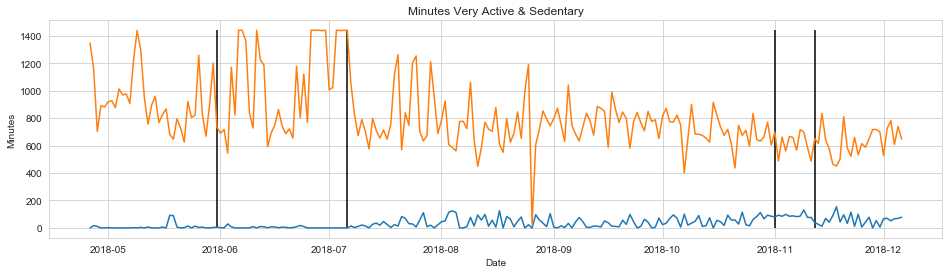

In [8]:
explore.plot_figure_vlines(df, 'Minutes Very Active', 'Minutes Sedentary')

***Take Aways:*** The maximum sedentary minutes are at the beginning of the tracking activity. The person starts to loog food when they have more consistency in `Minutes Very Active` and lower `Minutes Sedentary`.

Look at `Minutes Sedentary` when the person logged food entries.

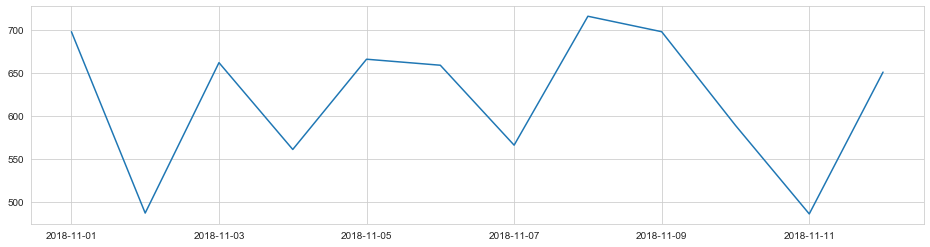

In [9]:
plt.figure(figsize = (16,4))
plt.plot(df['Minutes Sedentary']['2018-11-01':'2018-11-12'])

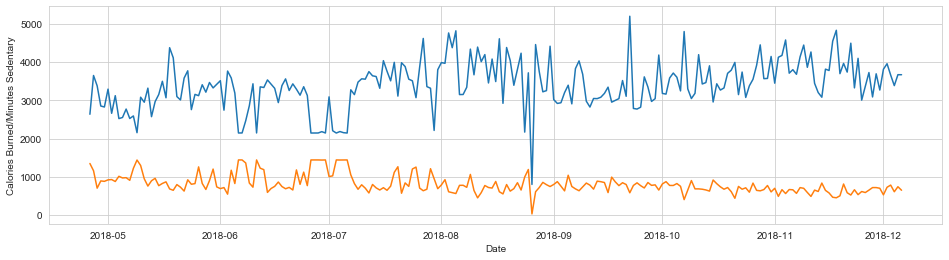

In [10]:
explore.plot_figure(df, 'Calories Burned', 'Minutes Sedentary')

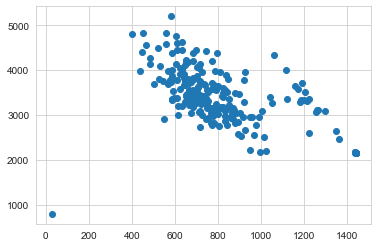

In [11]:
plt.scatter(df['Minutes Sedentary'], df['Calories Burned'])

In [12]:
df['Minutes Sedentary'].describe()

count     225.000000
mean      809.520000
std       243.232639
min        28.000000
25%       654.000000
50%       750.000000
75%       877.000000
max      1440.000000
Name: Minutes Sedentary, dtype: float64

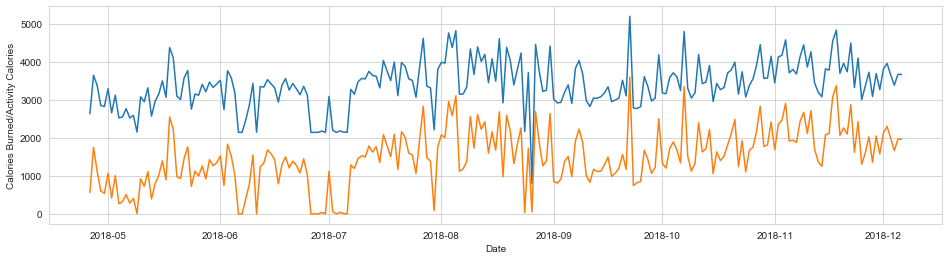

In [13]:
explore.plot_figure(df, 'Calories Burned', 'Activity Calories')

Text(0.5, 1.0, 'Calories Burned vs. Activity Calories')

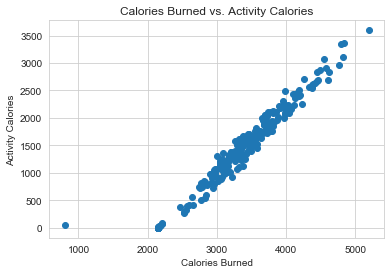

In [14]:
plt.scatter(x=df['Calories Burned'], y = df['Activity Calories'])
plt.xlabel('Calories Burned')
plt.ylabel('Activity Calories')
plt.title('Calories Burned vs. Activity Calories')

To examine the outlier we will look at the minumum of `Calories Burned`

In [15]:
df['Calories Burned'].min()

799

In [16]:
cal_burn_min = df['Activity Calories'][df['Calories Burned'] == df['Calories Burned'].min()].index[0]

In [17]:
df.loc[cal_burn_min]

Calories Burned           799.0
Steps                     207.0
Distance                    0.1
Floors                      1.0
Minutes Sedentary          28.0
Minutes Lightly Active     13.0
Minutes Fairly Active       0.0
Minutes Very Active         0.0
Activity Calories          51.0
Name: 2018-08-26 00:00:00, dtype: float64

***Take Away:*** Where `Caloried Burned` was a minimum `Activity Calories` were also ver low at 51.

Explore the correlation of variables

In [18]:
df.corr()

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Calories Burned,1.000000,0.887355,0.884708,0.263060,-0.572117,0.757374,0.619926,0.789379,0.974944
Steps,0.887355,1.000000,0.998907,0.336603,-0.633768,0.644159,0.554991,0.907570,0.941876
Distance,0.884708,0.998907,1.000000,0.334290,-0.633868,0.641748,0.549097,0.907409,0.939948
Floors,0.263060,0.336603,0.334290,1.000000,-0.225786,0.217456,0.139695,0.346969,0.306165
Minutes Sedentary,-0.572117,-0.633768,-0.633868,-0.225786,1.000000,-0.640055,-0.321540,-0.478779,-0.646972
Minutes Lightly Active,0.757374,0.644159,0.641748,0.217456,-0.640055,1.000000,0.414857,0.338583,0.780967
Minutes Fairly Active,0.619926,0.554991,0.549097,0.139695,-0.321540,0.414857,1.000000,0.448323,0.632311
Minutes Very Active,0.789379,0.907570,0.907409,0.346969,-0.478779,0.338583,0.448323,1.000000,0.826950
Activity Calories,0.974944,0.941876,0.939948,0.306165,-0.646972,0.780967,0.632311,0.826950,1.000000


In [19]:
# Look at where the correlation is very high:
df.corr()[df.corr() > .8]

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Calories Burned,1.000000,0.887355,0.884708,NaN,NaN,NaN,NaN,NaN,0.974944
Steps,0.887355,1.000000,0.998907,NaN,NaN,NaN,NaN,0.907570,0.941876
Distance,0.884708,0.998907,1.000000,NaN,NaN,NaN,NaN,0.907409,0.939948
Floors,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
Minutes Sedentary,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
Minutes Lightly Active,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
Minutes Fairly Active,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
Minutes Very Active,NaN,0.907570,0.907409,NaN,NaN,NaN,NaN,1.000000,0.826950
Activity Calories,0.974944,0.941876,0.939948,NaN,NaN,NaN,NaN,0.826950,1.000000


In [20]:
high_corr = ['Calories Burned', 'Steps','Distance', 'Minutes Very Active', 'Activity Calories']


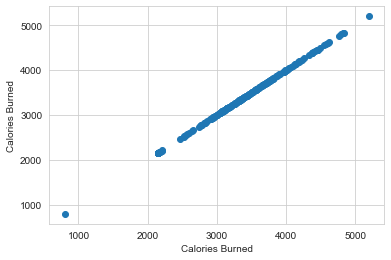

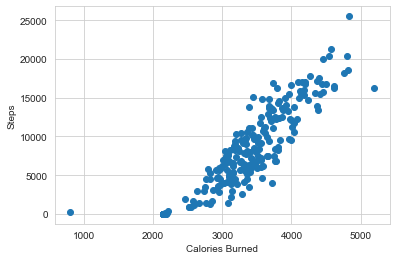

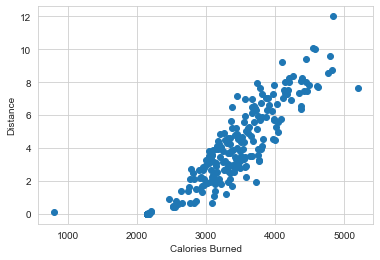

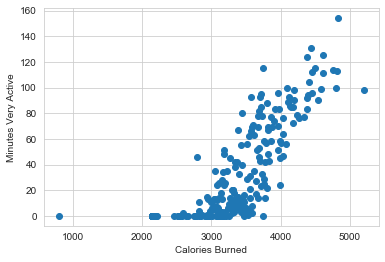

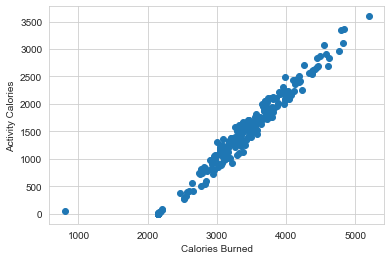

...

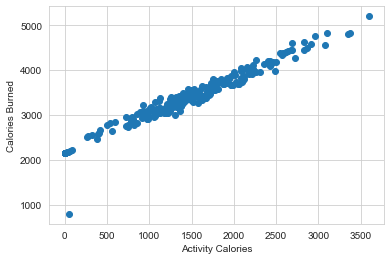

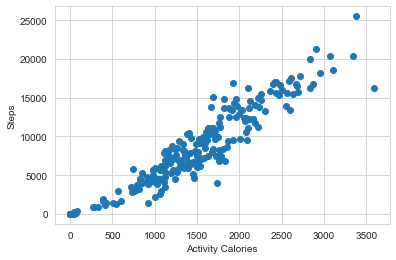

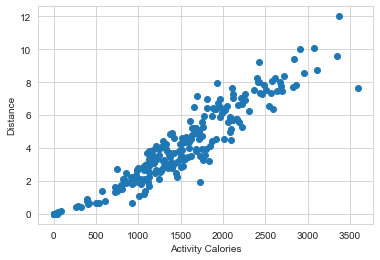

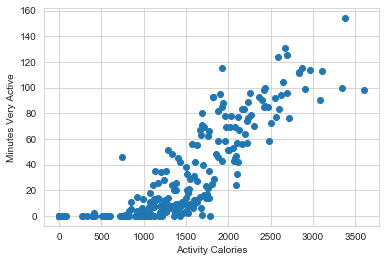

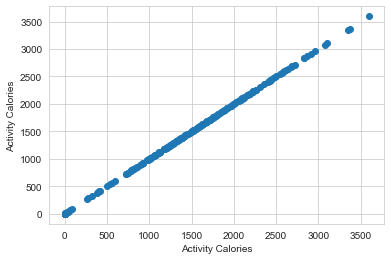

In [21]:
explore.plot_corr(df, high_corr)

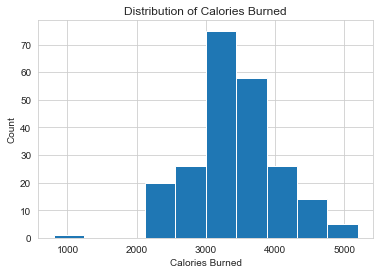

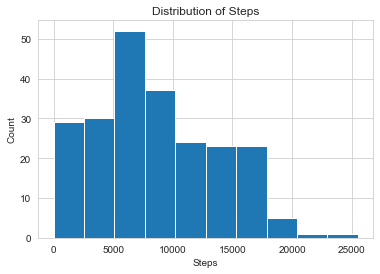

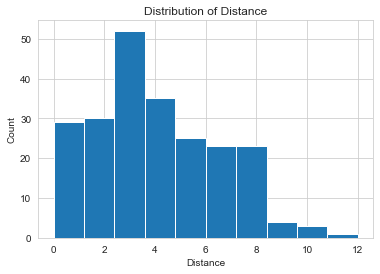

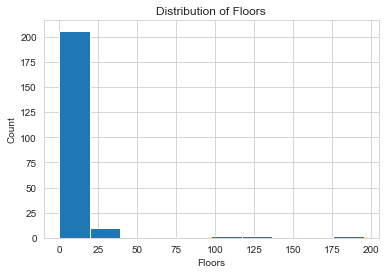

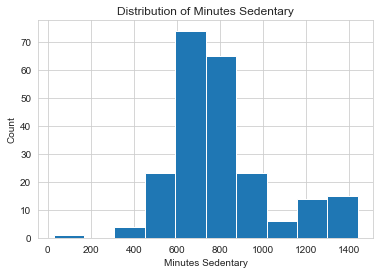

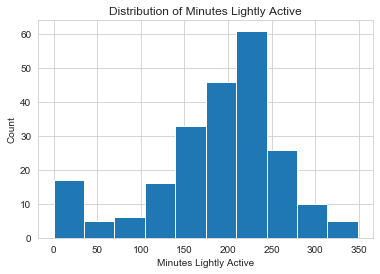

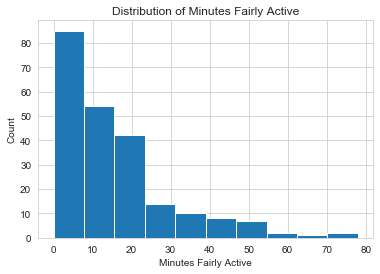

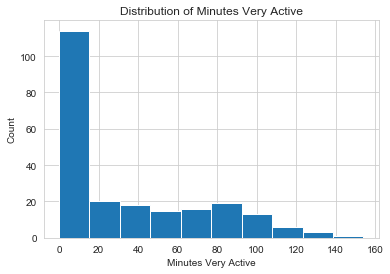

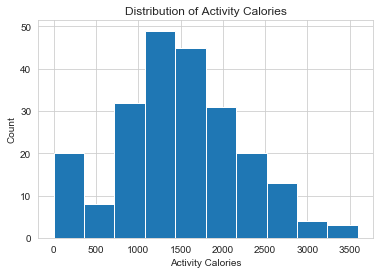

In [22]:
explore.plot_hist(df)

Resample the columns by weekly to look at variables over time

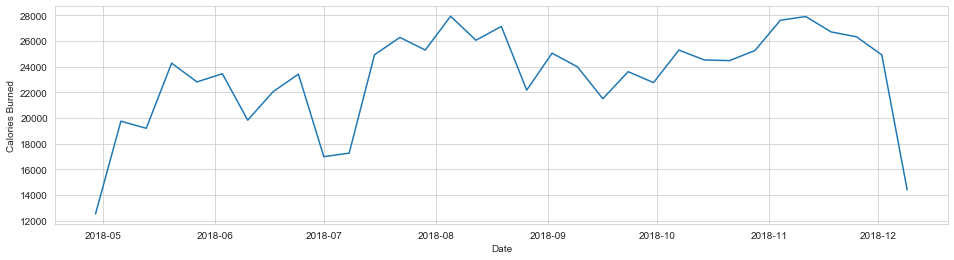

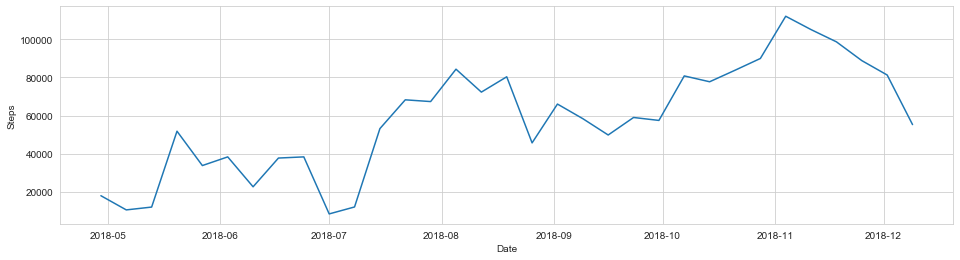

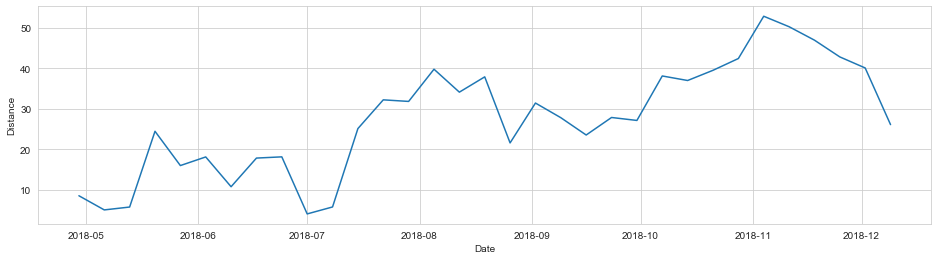

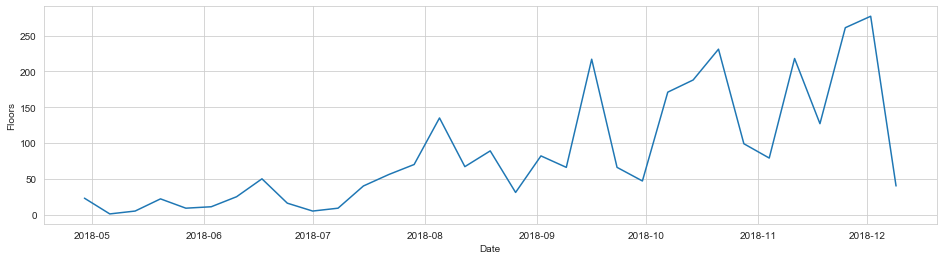

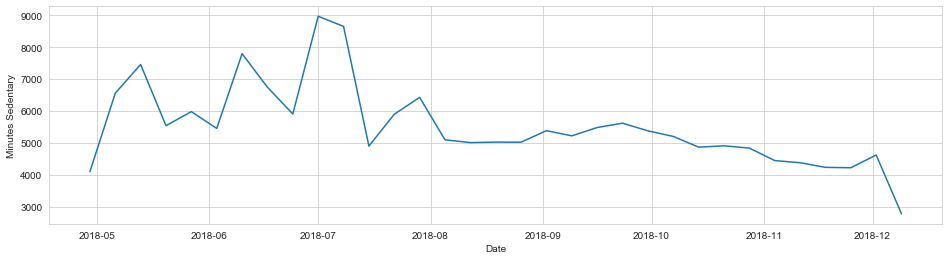

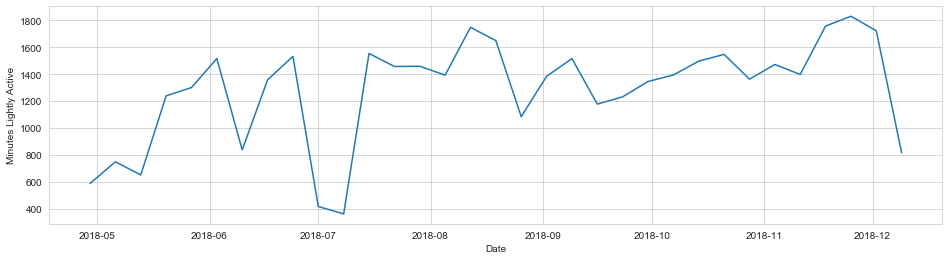

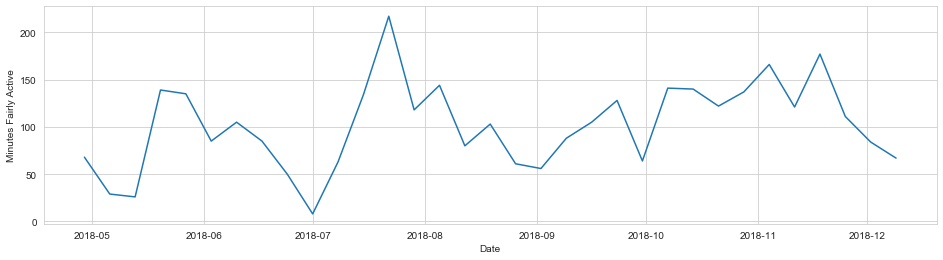

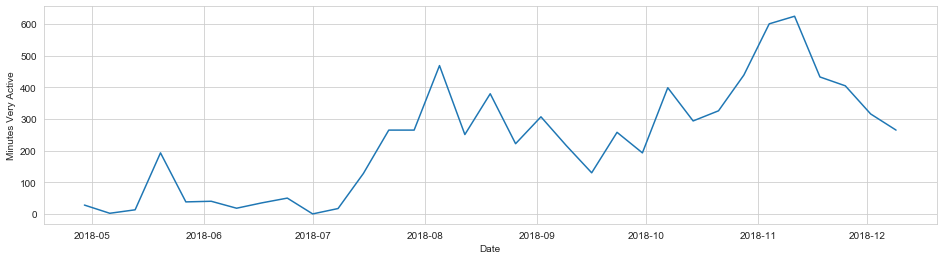

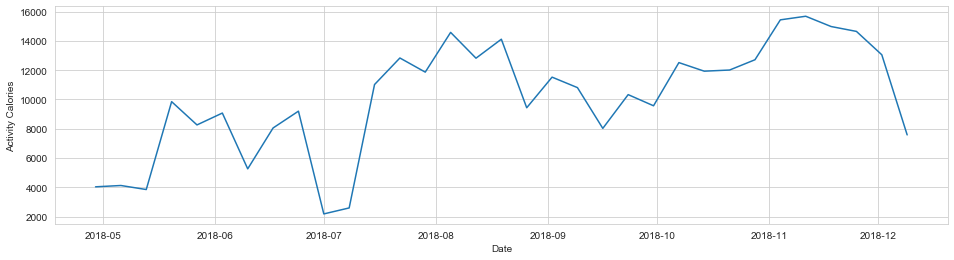

In [23]:
explore.plot_columns(df)

***Take Away:*** As time increases so does activity time, and sedentary begins to level off.

Make sure that there are not any days missing

In [24]:
df.index.nunique()

225

In [25]:
df.index.min()

Timestamp('2018-04-26 00:00:00')

In [26]:
df.index.max()

Timestamp('2018-12-06 00:00:00')

In [27]:
timedelta(df.index.nunique())

datetime.timedelta(days=225)

### Modeling

***Split the dataframe into train & test***

Our test data frame will be two weeks because that is the amount of time that we have been requested to fill. We will find our best model evaluated on the last two weeks of data, and use those models to predict for the missing two weeks.

In [28]:
df.columns

Index(['Calories Burned', 'Steps', 'Distance', 'Floors', 'Minutes Sedentary',
       'Minutes Lightly Active', 'Minutes Fairly Active',
       'Minutes Very Active', 'Activity Calories'],
      dtype='object')

In [29]:
train, test = model.train_test_split(df)

In [30]:
train.shape, test.shape

((211, 9), (14, 9))

In [31]:
train.tail()

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Date,,,,,,,,,
2018-11-18,4832,25512,12.00,23,450,269,53,154,3373
2018-11-19,3697,11993,5.56,17,502,255,34,43,2062
2018-11-20,3966,15527,7.27,13,810,196,11,96,2260
2018-11-21,3738,11079,5.16,4,582,328,9,33,2101
2018-11-22,4494,16705,7.84,177,522,284,18,115,2868


In [32]:
test.head()

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Date,,,,,,,,,
2018-11-23,3325,9602,4.53,16,660,269,23,12,1619
2018-11-24,4098,17004,9.20,23,532,217,13,100,2428
2018-11-25,3005,6921,3.26,11,614,281,3,6,1306
2018-11-26,3364,10563,5.64,20,587,210,10,42,1605
2018-11-27,3726,13420,6.29,7,650,196,12,78,2027


In [33]:
print('Observations: %d' % len(df))
print('Training Observations: %d' % (len(train)))
print('Testing Observations: %d' % (len(test)))

Observations: 225
Training Observations: 211
Testing Observations: 14


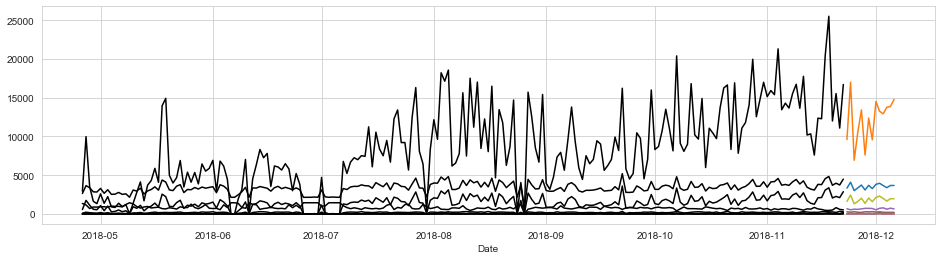

In [34]:
plt.figure(figsize = (16,4))
plt.plot(train[df.columns], color = 'black')
plt.plot(test[df.columns])
plt.xlabel('Date')
plt.show()

In [35]:
yhat = pd.DataFrame(test[df.columns])
yhat

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Date,,,,,,,,,
2018-11-23,3325,9602,4.53,16,660,269,23,12,1619
2018-11-24,4098,17004,9.20,23,532,217,13,100,2428
2018-11-25,3005,6921,3.26,11,614,281,3,6,1306
2018-11-26,3364,10563,5.64,20,587,210,10,42,1605
2018-11-27,3726,13420,6.29,7,650,196,12,78,2027
2018-11-28,3088,7602,3.59,16,717,272,0,0,1361
2018-11-29,3693,12380,6.56,18,717,258,15,53,2051
2018-11-30,3269,9559,4.51,14,699,288,12,6,1577
2018-12-01,3813,14510,7.27,7,527,233,22,67,2124


In [36]:
yhat.shape

(14, 9)

# Last Observed

In [37]:
yhat = model.last_observed_yhat(yhat,train)
yhat

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Date,,,,,,,,,
2018-11-23,4494.0,16705.0,7.84,177.0,522.0,284.0,18.0,115.0,2868.0
2018-11-24,4494.0,16705.0,7.84,177.0,522.0,284.0,18.0,115.0,2868.0
2018-11-25,4494.0,16705.0,7.84,177.0,522.0,284.0,18.0,115.0,2868.0
2018-11-26,4494.0,16705.0,7.84,177.0,522.0,284.0,18.0,115.0,2868.0
2018-11-27,4494.0,16705.0,7.84,177.0,522.0,284.0,18.0,115.0,2868.0
2018-11-28,4494.0,16705.0,7.84,177.0,522.0,284.0,18.0,115.0,2868.0
2018-11-29,4494.0,16705.0,7.84,177.0,522.0,284.0,18.0,115.0,2868.0
2018-11-30,4494.0,16705.0,7.84,177.0,522.0,284.0,18.0,115.0,2868.0
2018-12-01,4494.0,16705.0,7.84,177.0,522.0,284.0,18.0,115.0,2868.0


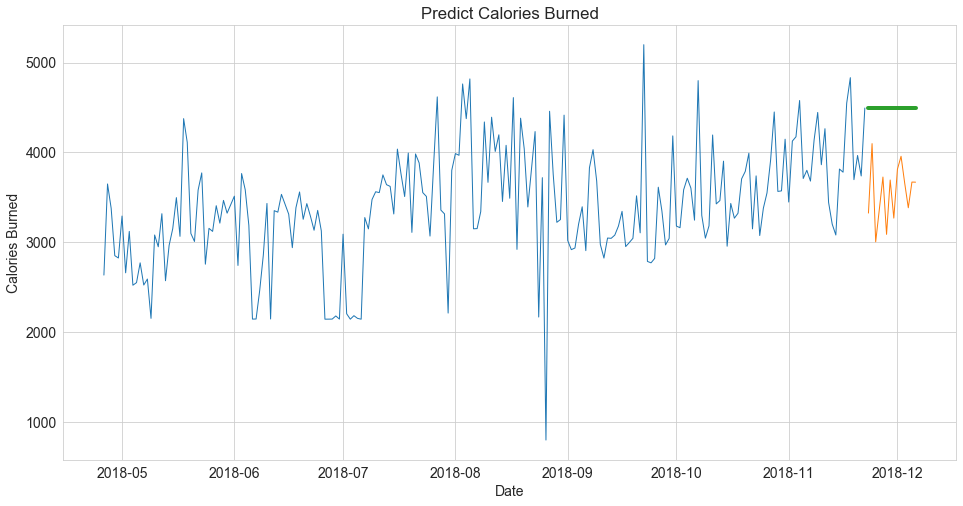

Calories Burned -- MSE: 983262.21 RMSE: 991.60


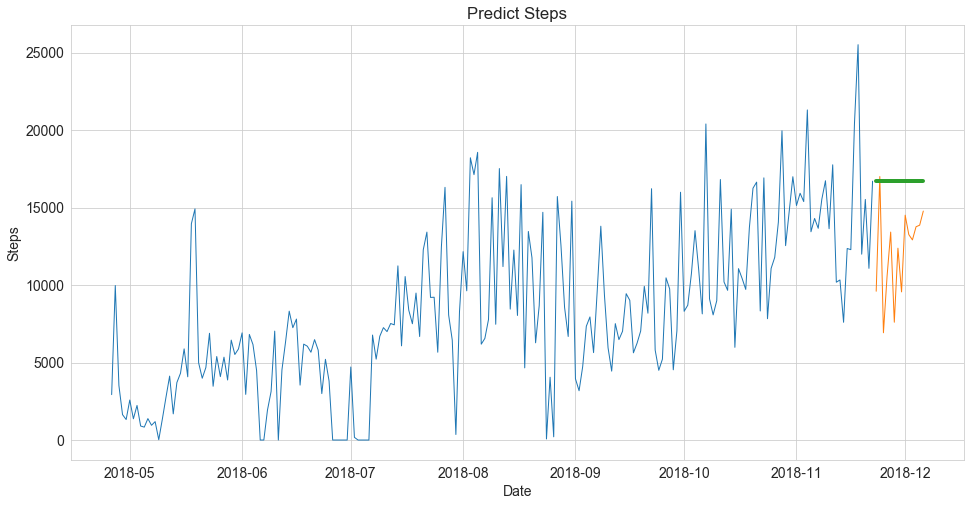

Steps -- MSE: 28495725.64 RMSE: 5338.14


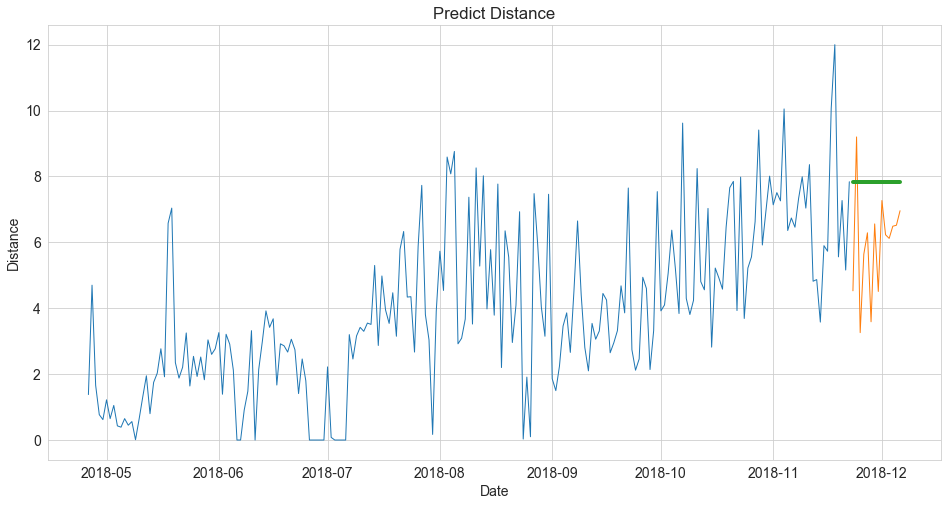

Distance -- MSE: 5.86 RMSE: 2.42


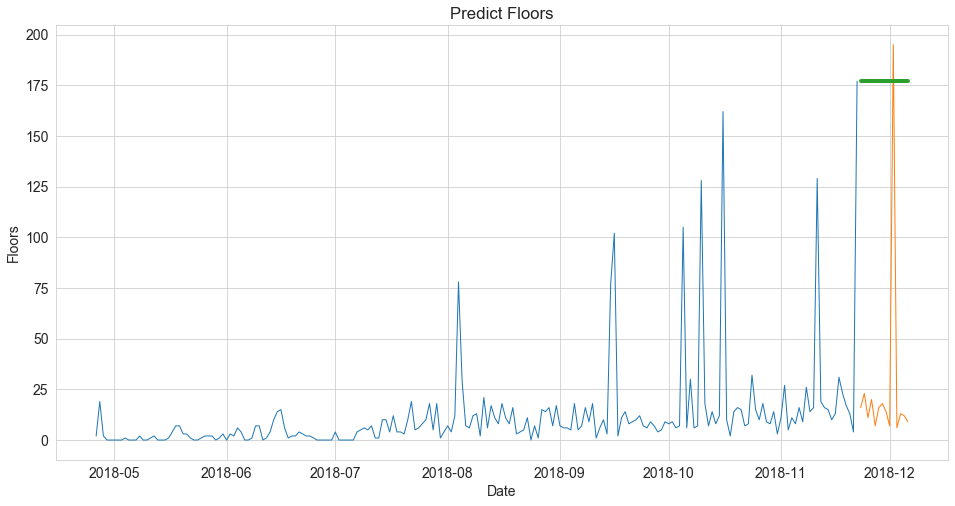

Floors -- MSE: 24951.64 RMSE: 157.96


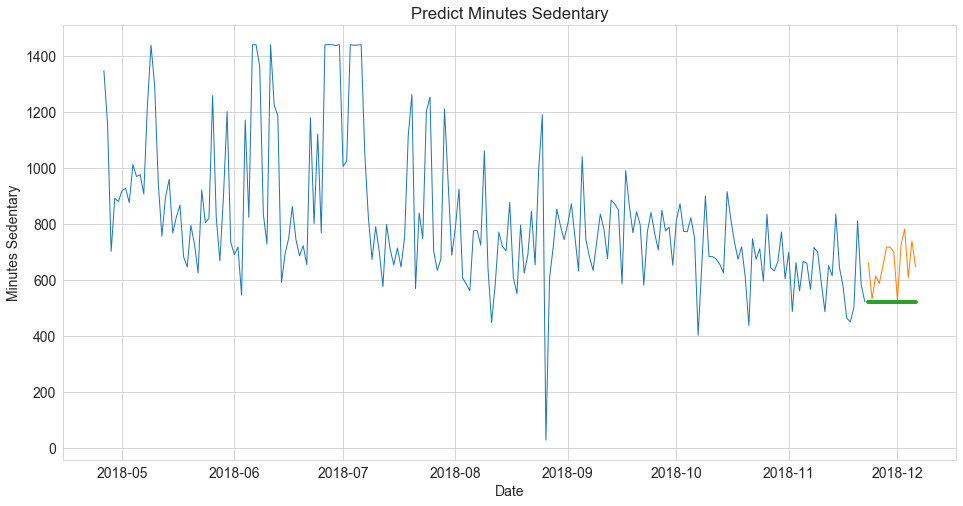

Minutes Sedentary -- MSE: 23895.71 RMSE: 154.58


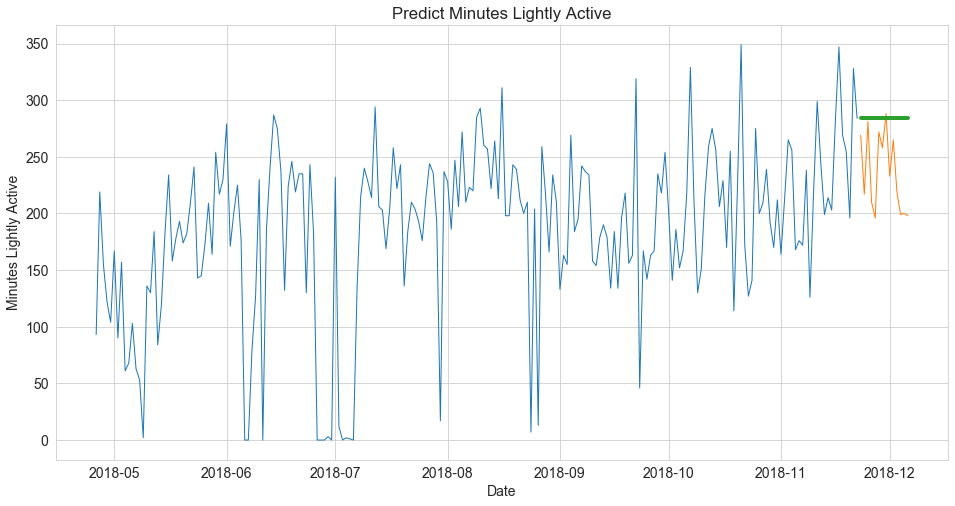

Minutes Lightly Active -- MSE: 3403.07 RMSE: 58.34


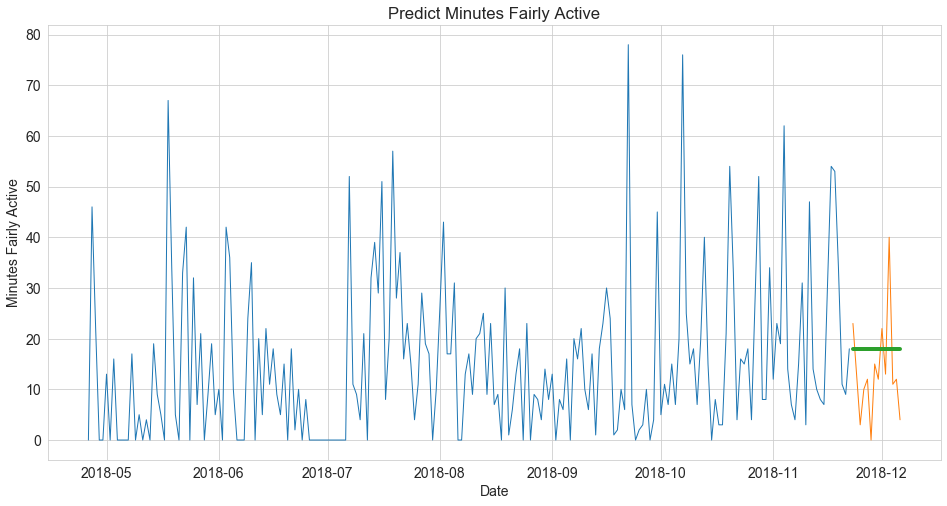

Minutes Fairly Active -- MSE: 110.71 RMSE: 10.52


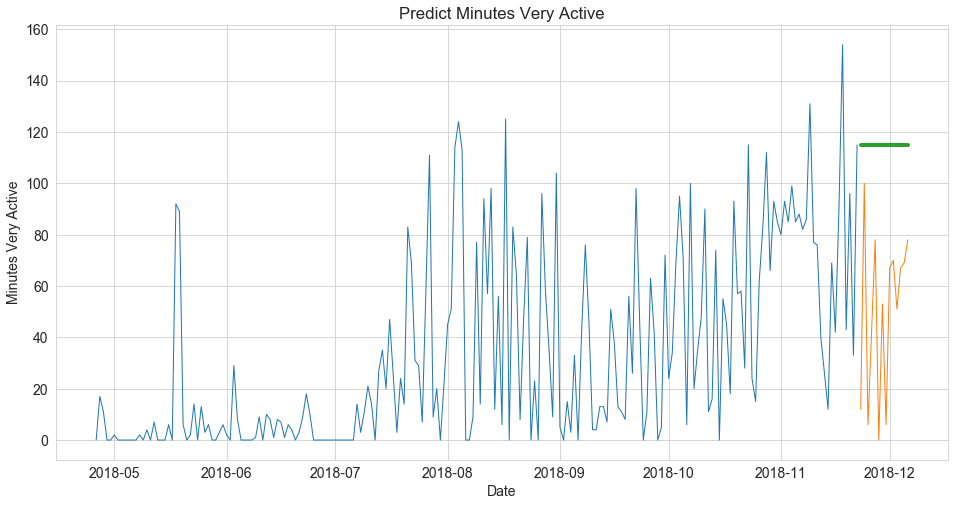

Minutes Very Active -- MSE: 5184.07 RMSE: 72.00


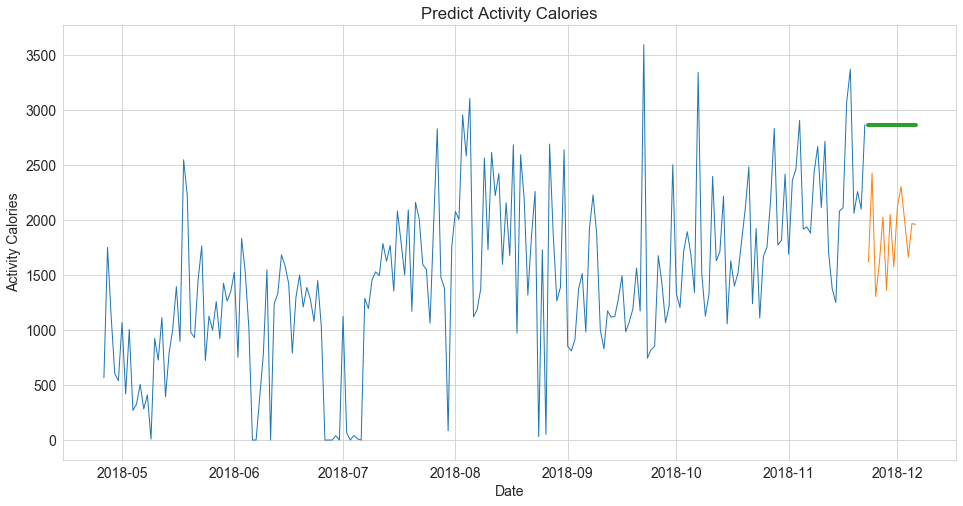

Activity Calories -- MSE: 1130007.50 RMSE: 1063.02


In [38]:
model.plot_and_eval(yhat, list(df.columns), train, test)

In [39]:
last_observed_metrics = model.append_eval_df(yhat, 'Last Observed', train, test)
last_observed_metrics

,model_type,target_var,metric,value
0,Last Observed,Calories Burned,mse,9.832622e+05
1,Last Observed,Calories Burned,rmse,9.915958e+02
2,Last Observed,Steps,mse,2.849573e+07
3,Last Observed,Steps,rmse,5.338139e+03
4,Last Observed,Distance,mse,5.859221e+00
5,Last Observed,Distance,rmse,2.420583e+00
6,Last Observed,Floors,mse,2.495164e+04
7,Last Observed,Floors,rmse,1.579609e+02
8,Last Observed,Minutes Sedentary,mse,2.389571e+04
9,Last Observed,Minutes Sedentary,rmse,1.545824e+02


# Simple Average

In [40]:
yhat = model.simple_average(yhat, train)
yhat

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Date,,,,,,,,,
2018-11-23,3391.985782,8296.241706,3.921137,11.687204,819.611374,185.061611,15.009479,32.805687,1459.876777
2018-11-24,3391.985782,8296.241706,3.921137,11.687204,819.611374,185.061611,15.009479,32.805687,1459.876777
2018-11-25,3391.985782,8296.241706,3.921137,11.687204,819.611374,185.061611,15.009479,32.805687,1459.876777
2018-11-26,3391.985782,8296.241706,3.921137,11.687204,819.611374,185.061611,15.009479,32.805687,1459.876777
2018-11-27,3391.985782,8296.241706,3.921137,11.687204,819.611374,185.061611,15.009479,32.805687,1459.876777
2018-11-28,3391.985782,8296.241706,3.921137,11.687204,819.611374,185.061611,15.009479,32.805687,1459.876777
2018-11-29,3391.985782,8296.241706,3.921137,11.687204,819.611374,185.061611,15.009479,32.805687,1459.876777
2018-11-30,3391.985782,8296.241706,3.921137,11.687204,819.611374,185.061611,15.009479,32.805687,1459.876777
2018-12-01,3391.985782,8296.241706,3.921137,11.687204,819.611374,185.061611,15.009479,32.805687,1459.876777


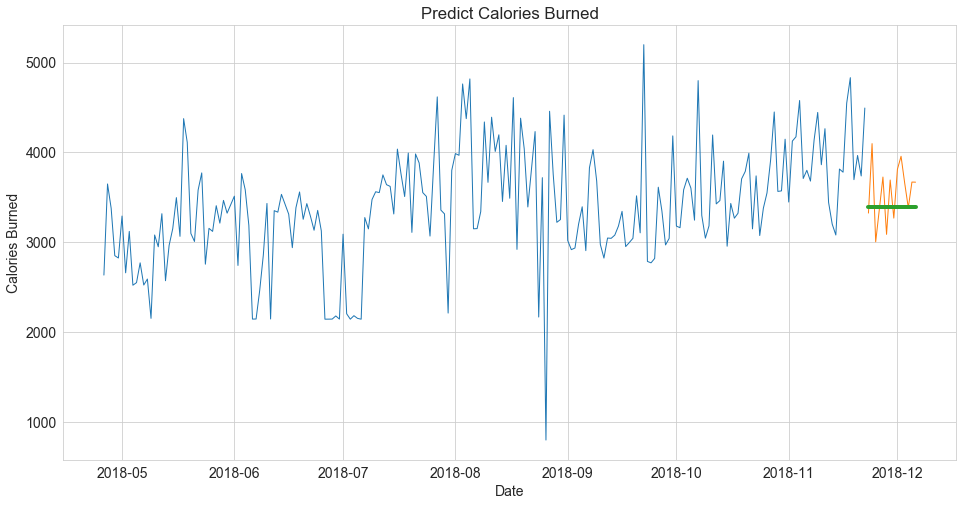

Calories Burned -- MSE: 120400.75 RMSE: 346.99


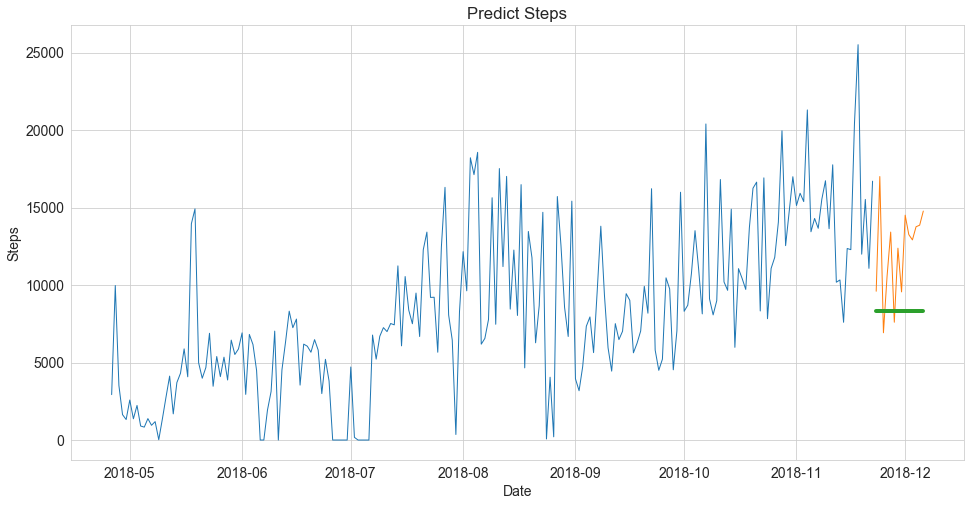

Steps -- MSE: 22641197.42 RMSE: 4758.28


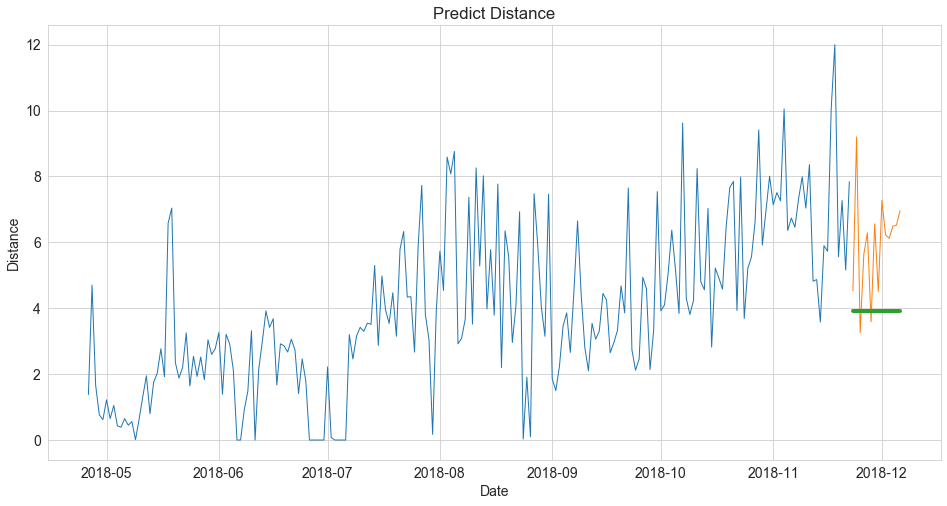

Distance -- MSE: 6.33 RMSE: 2.52


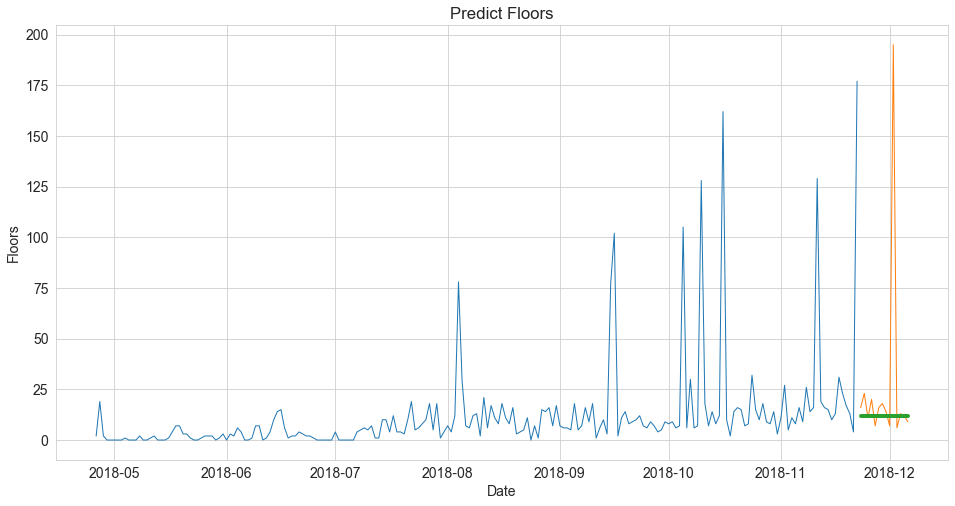

Floors -- MSE: 2426.35 RMSE: 49.26


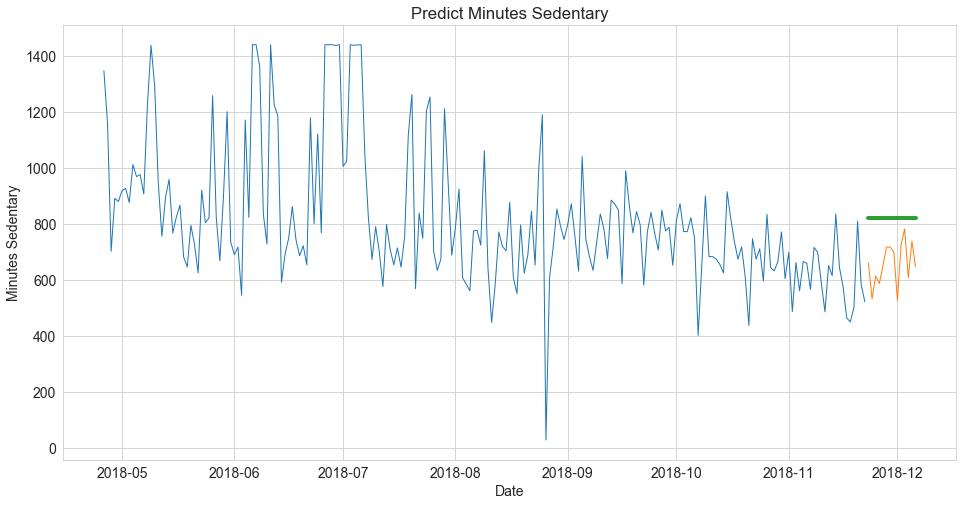

Minutes Sedentary -- MSE: 31858.08 RMSE: 178.49


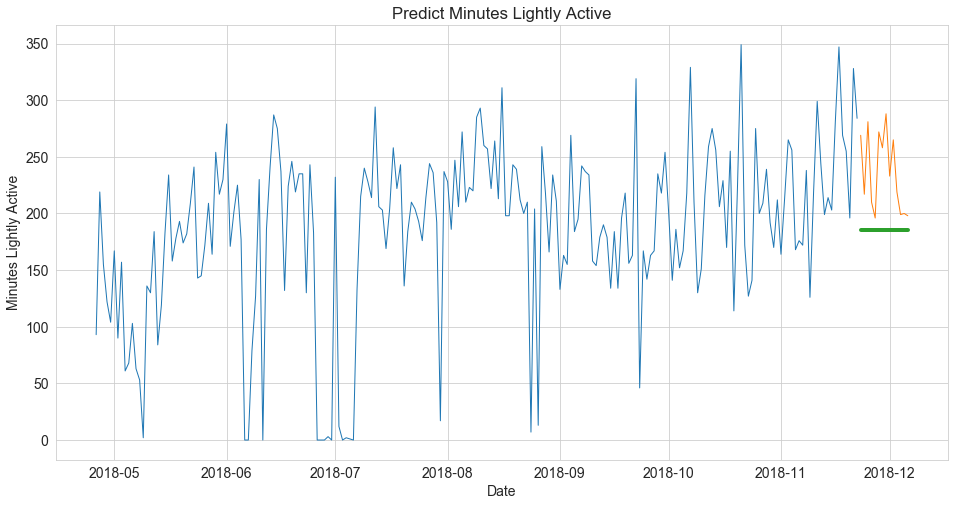

Minutes Lightly Active -- MSE: 3707.92 RMSE: 60.89


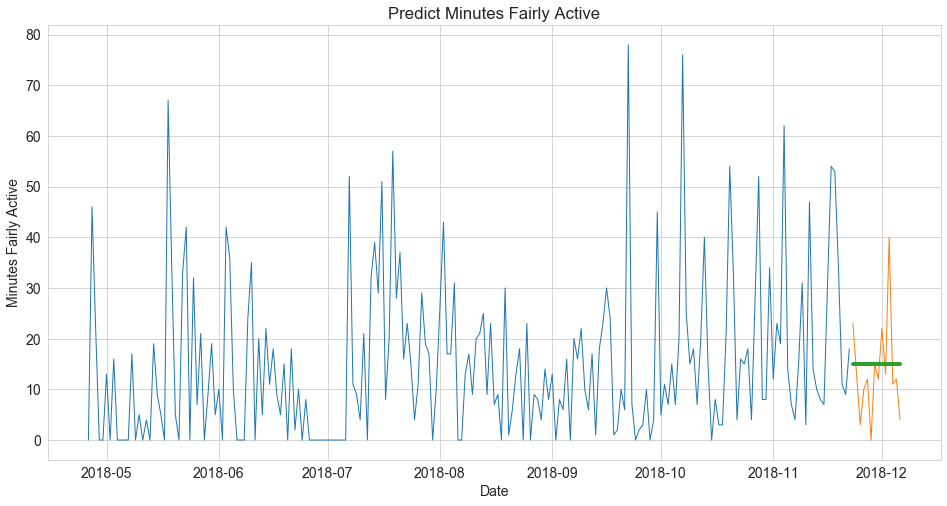

Minutes Fairly Active -- MSE: 93.17 RMSE: 9.65


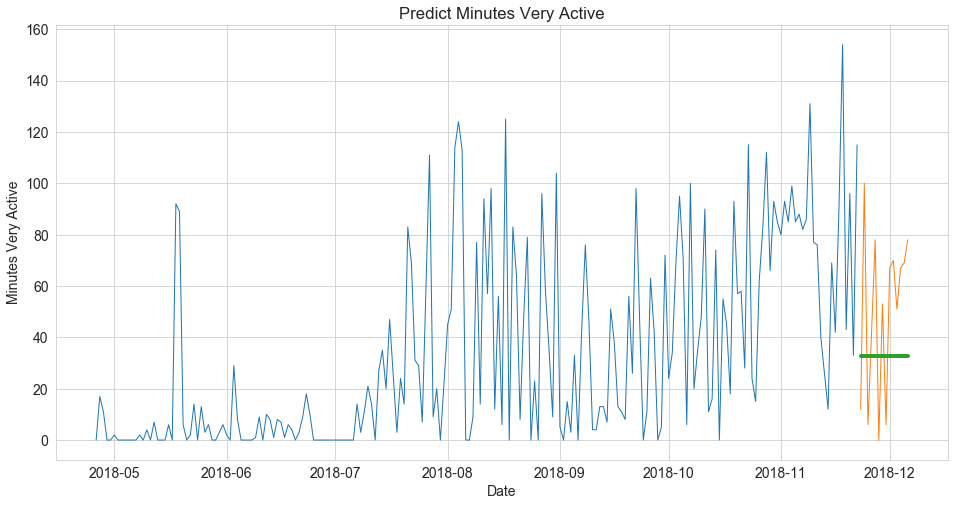

Minutes Very Active -- MSE: 1242.97 RMSE: 35.26


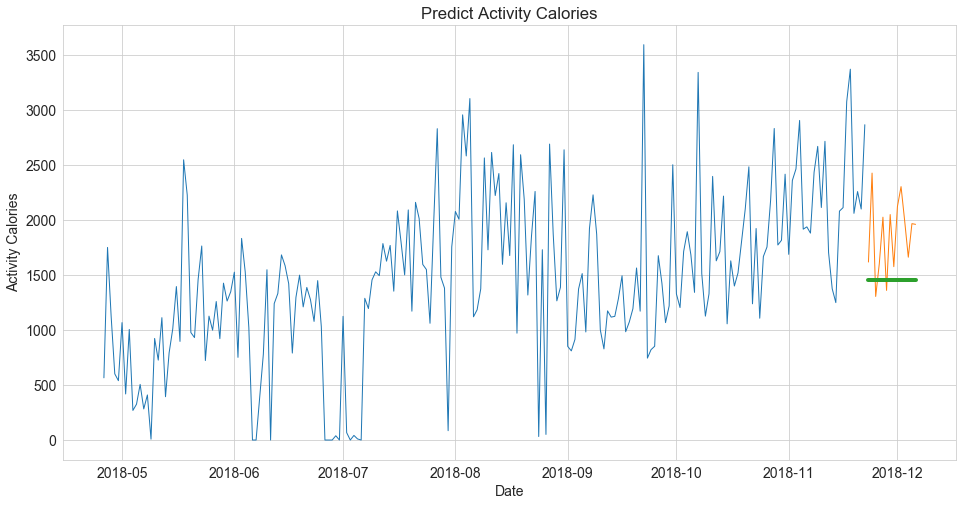

Activity Calories -- MSE: 263782.91 RMSE: 513.60


In [41]:
model.plot_and_eval(yhat, list(df.columns), train, test)

In [42]:
simple_average = model.append_eval_df(yhat, 'Simple Average', train, test)
simple_average

,model_type,target_var,metric,value
0,Simple Average,Calories Burned,mse,1.204008e+05
1,Simple Average,Calories Burned,rmse,3.469881e+02
2,Simple Average,Steps,mse,2.264120e+07
3,Simple Average,Steps,rmse,4.758277e+03
4,Simple Average,Distance,mse,6.330626e+00
5,Simple Average,Distance,rmse,2.516073e+00
6,Simple Average,Floors,mse,2.426347e+03
7,Simple Average,Floors,rmse,4.925797e+01
8,Simple Average,Minutes Sedentary,mse,3.185808e+04
9,Simple Average,Minutes Sedentary,rmse,1.784883e+02


# Moving Average

periods = 2 days

In [43]:
yhat = model.moving_average(yhat, train, 2)
yhat

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Date,,,,,,,,,
2018-11-23,4116.0,13892.0,6.5,90.5,552.0,306.0,13.5,74.0,2484.5
2018-11-24,4116.0,13892.0,6.5,90.5,552.0,306.0,13.5,74.0,2484.5
2018-11-25,4116.0,13892.0,6.5,90.5,552.0,306.0,13.5,74.0,2484.5
2018-11-26,4116.0,13892.0,6.5,90.5,552.0,306.0,13.5,74.0,2484.5
2018-11-27,4116.0,13892.0,6.5,90.5,552.0,306.0,13.5,74.0,2484.5
2018-11-28,4116.0,13892.0,6.5,90.5,552.0,306.0,13.5,74.0,2484.5
2018-11-29,4116.0,13892.0,6.5,90.5,552.0,306.0,13.5,74.0,2484.5
2018-11-30,4116.0,13892.0,6.5,90.5,552.0,306.0,13.5,74.0,2484.5
2018-12-01,4116.0,13892.0,6.5,90.5,552.0,306.0,13.5,74.0,2484.5


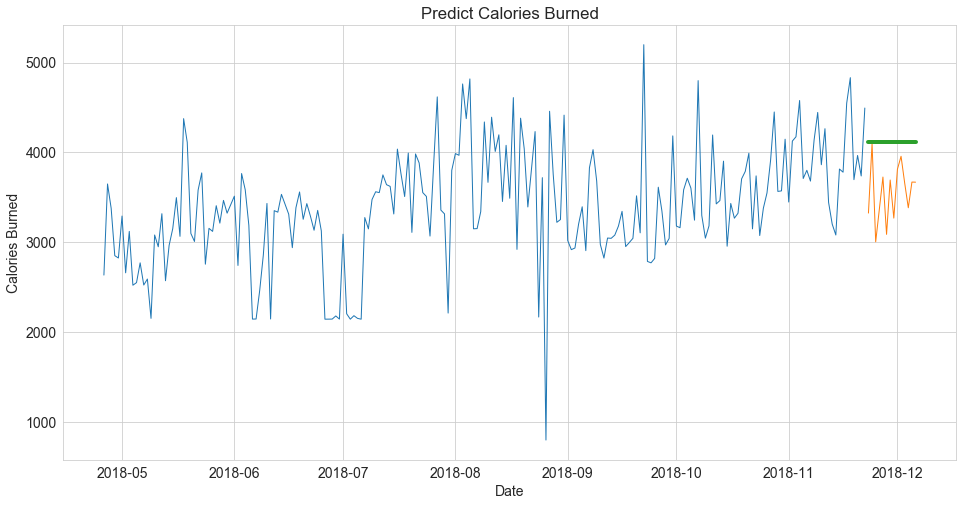

Calories Burned -- MSE: 413616.21 RMSE: 643.13


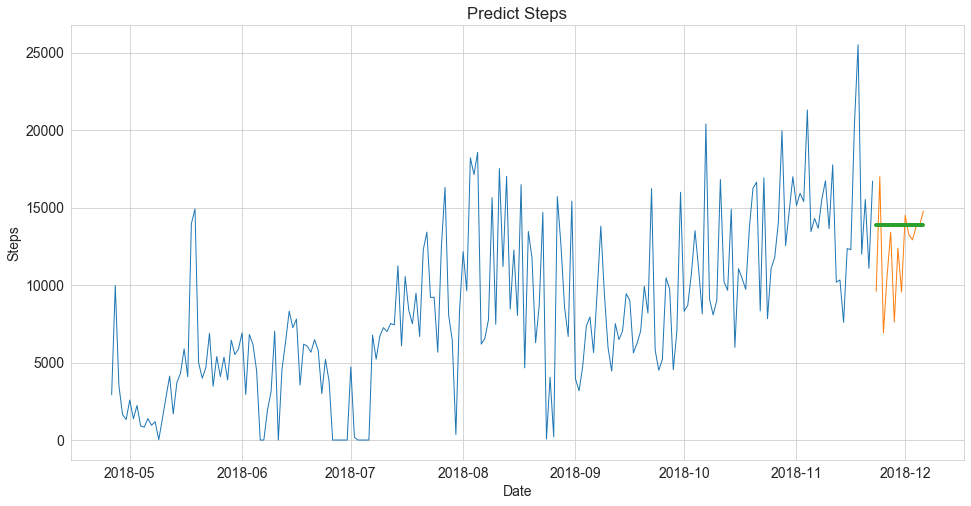

Steps -- MSE: 10796329.64 RMSE: 3285.78


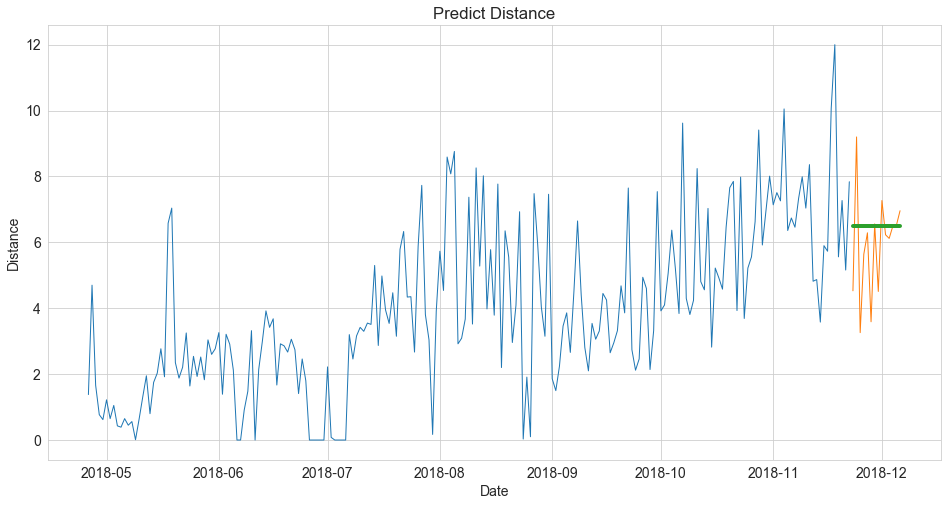

Distance -- MSE: 2.56 RMSE: 1.60


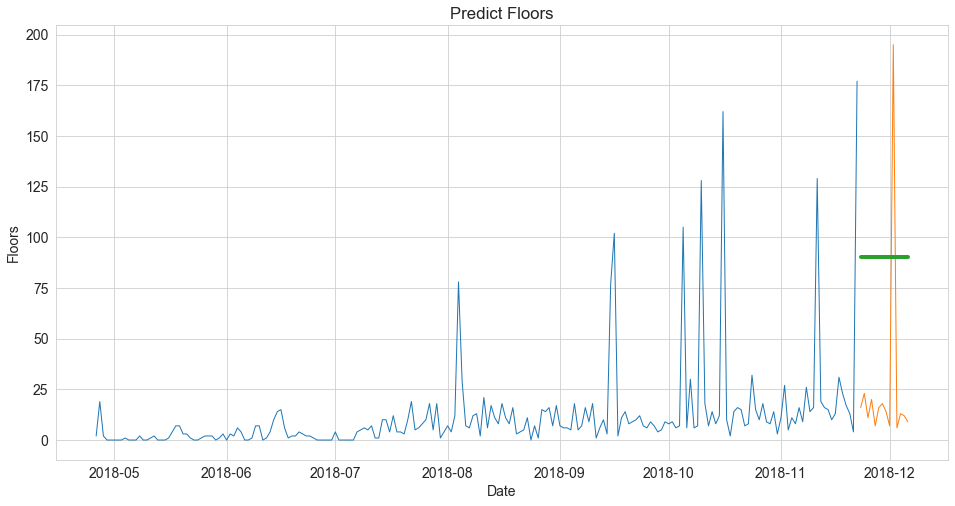

Floors -- MSE: 6347.96 RMSE: 79.67


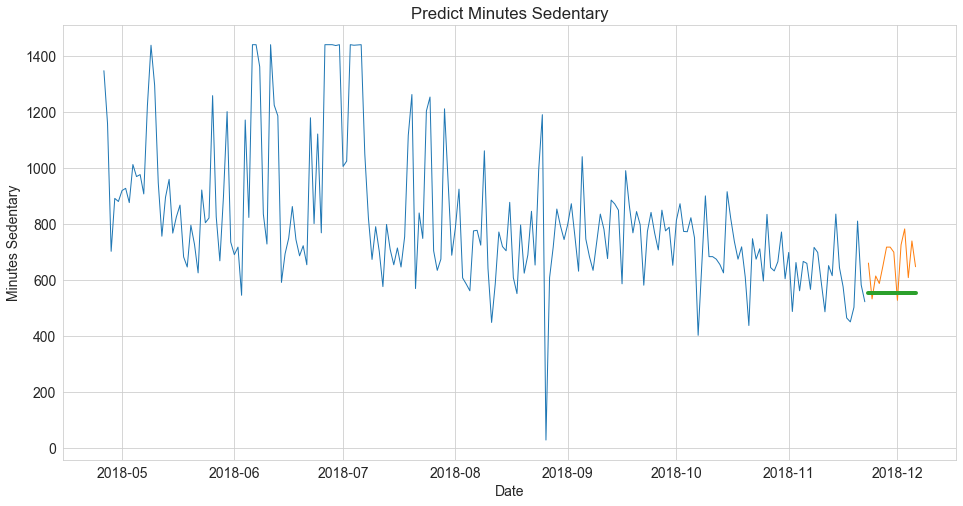

Minutes Sedentary -- MSE: 16670.00 RMSE: 129.11


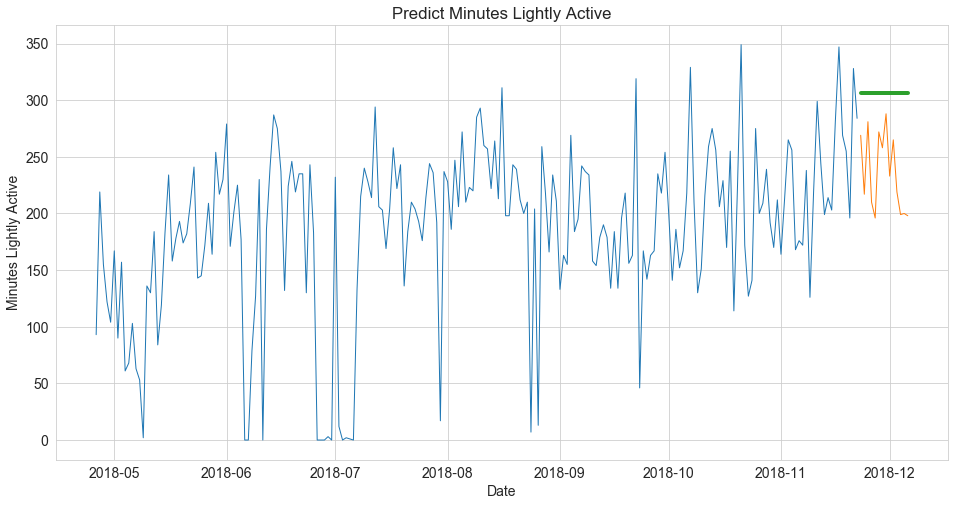

Minutes Lightly Active -- MSE: 5995.93 RMSE: 77.43


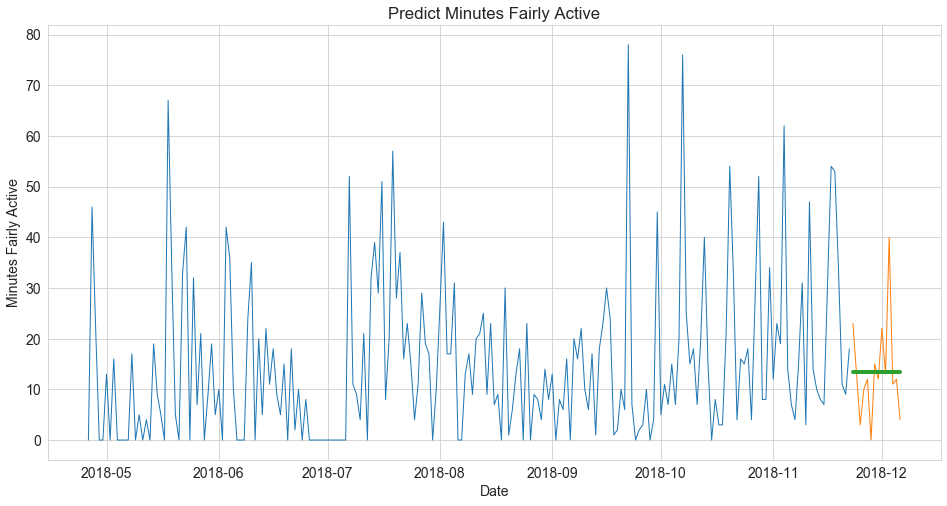

Minutes Fairly Active -- MSE: 91.11 RMSE: 9.55


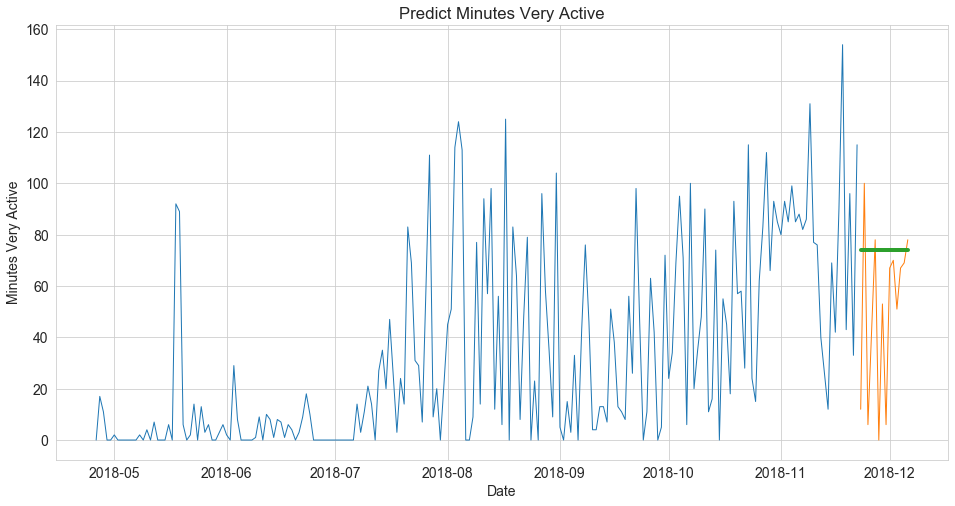

Minutes Very Active -- MSE: 1529.21 RMSE: 39.11


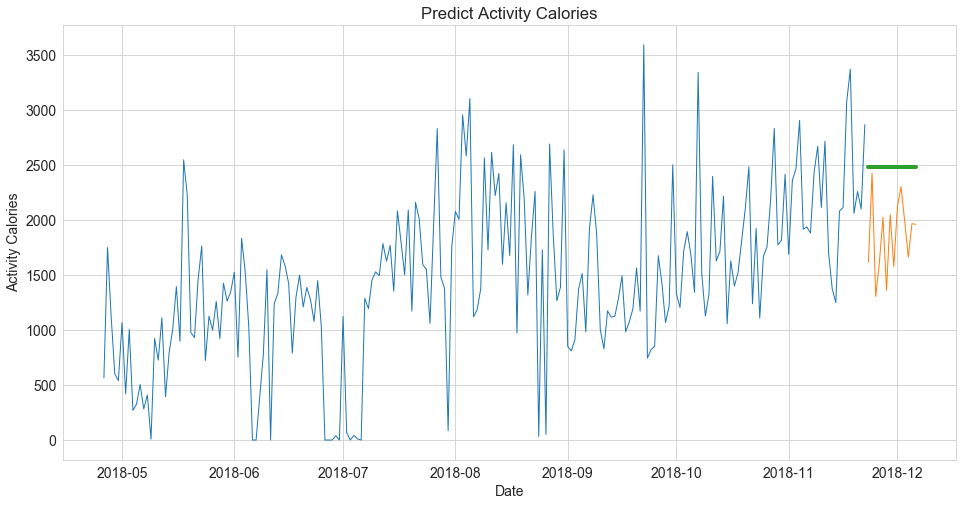

Activity Calories -- MSE: 501149.68 RMSE: 707.92


In [44]:
model.plot_and_eval(yhat, list(df.columns), train, test)

In [45]:
moving_average_2 = model.append_eval_df(yhat, 'Moving Average (2 days)', train, test)

In [46]:
moving_average_2

,model_type,target_var,metric,value
0,Moving Average (2 days),Calories Burned,mse,4.136162e+05
1,Moving Average (2 days),Calories Burned,rmse,6.431300e+02
2,Moving Average (2 days),Steps,mse,1.079633e+07
3,Moving Average (2 days),Steps,rmse,3.285777e+03
4,Moving Average (2 days),Distance,mse,2.564736e+00
5,Moving Average (2 days),Distance,rmse,1.601479e+00
6,Moving Average (2 days),Floors,mse,6.347964e+03
7,Moving Average (2 days),Floors,rmse,7.967411e+01
8,Moving Average (2 days),Minutes Sedentary,mse,1.667000e+04
9,Moving Average (2 days),Minutes Sedentary,rmse,1.291124e+02


periods = 7

In [47]:
yhat = model.moving_average(yhat, train, 7)
yhat

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Date,,,,,,,,,
2018-11-23,4150.714286,16213.857143,7.66,39.714286,558.0,280.0,30.0,81.857143,2550.714286
2018-11-24,4150.714286,16213.857143,7.66,39.714286,558.0,280.0,30.0,81.857143,2550.714286
2018-11-25,4150.714286,16213.857143,7.66,39.714286,558.0,280.0,30.0,81.857143,2550.714286
2018-11-26,4150.714286,16213.857143,7.66,39.714286,558.0,280.0,30.0,81.857143,2550.714286
2018-11-27,4150.714286,16213.857143,7.66,39.714286,558.0,280.0,30.0,81.857143,2550.714286
2018-11-28,4150.714286,16213.857143,7.66,39.714286,558.0,280.0,30.0,81.857143,2550.714286
2018-11-29,4150.714286,16213.857143,7.66,39.714286,558.0,280.0,30.0,81.857143,2550.714286
2018-11-30,4150.714286,16213.857143,7.66,39.714286,558.0,280.0,30.0,81.857143,2550.714286
2018-12-01,4150.714286,16213.857143,7.66,39.714286,558.0,280.0,30.0,81.857143,2550.714286


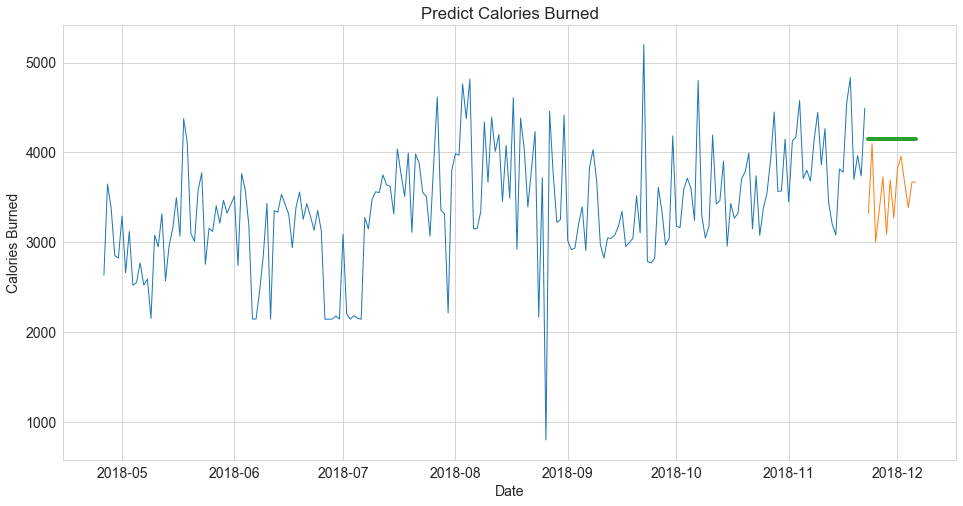

Calories Burned -- MSE: 454013.72 RMSE: 673.81


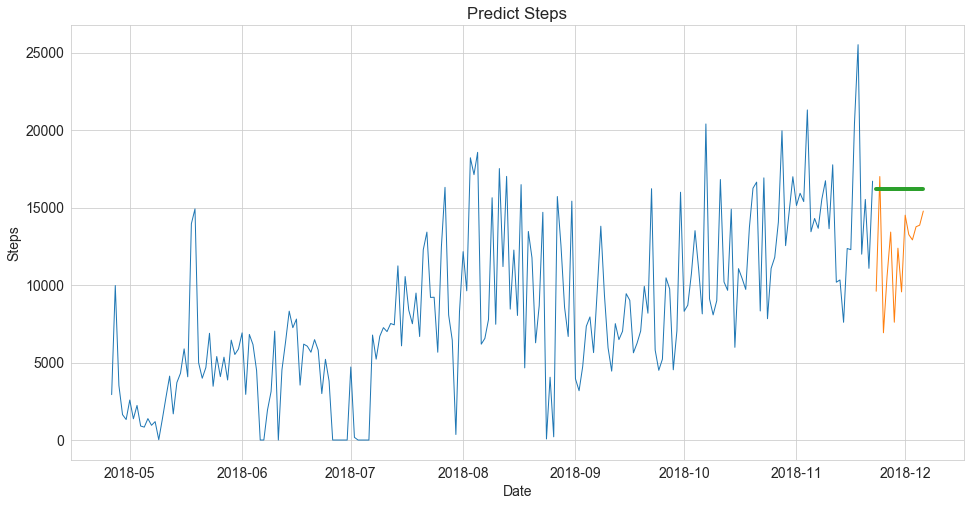

Steps -- MSE: 24265091.23 RMSE: 4925.96


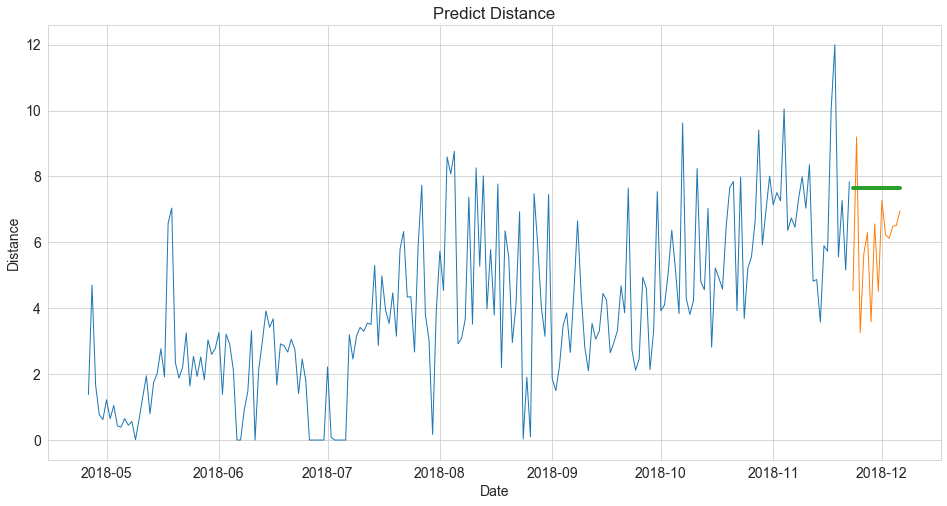

Distance -- MSE: 5.21 RMSE: 2.28


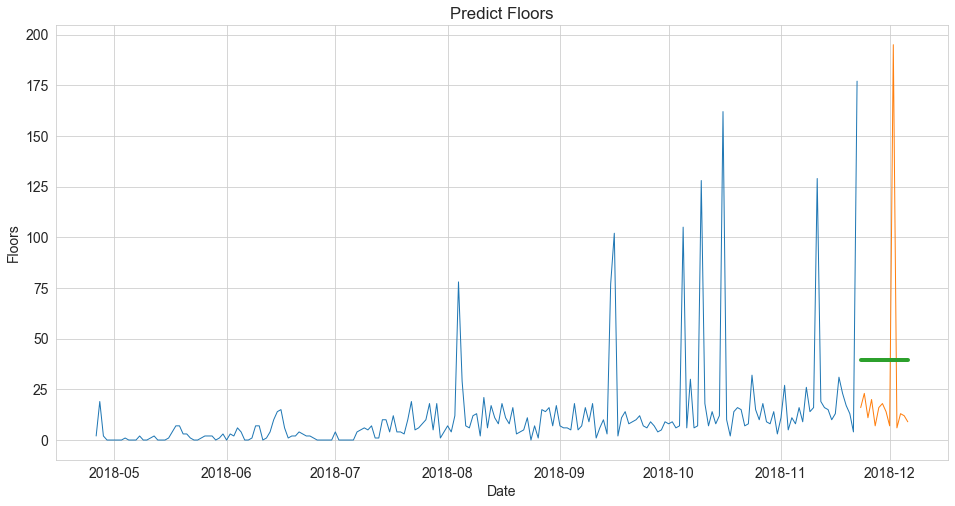

Floors -- MSE: 2397.56 RMSE: 48.96


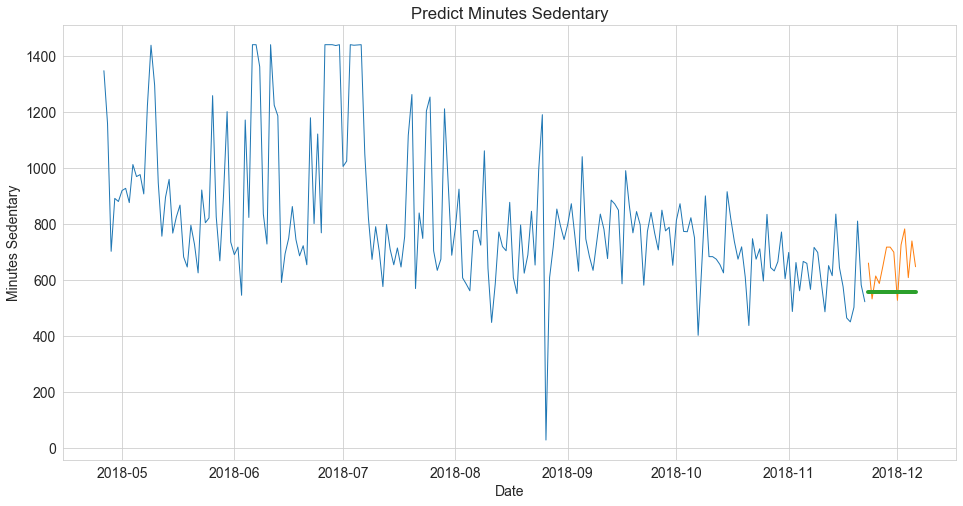

Minutes Sedentary -- MSE: 15440.86 RMSE: 124.26


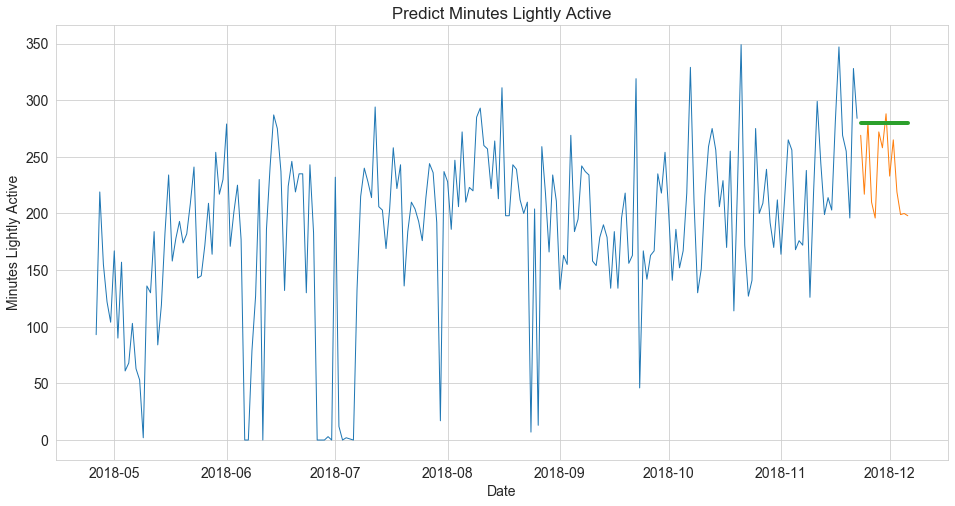

Minutes Lightly Active -- MSE: 3035.64 RMSE: 55.10


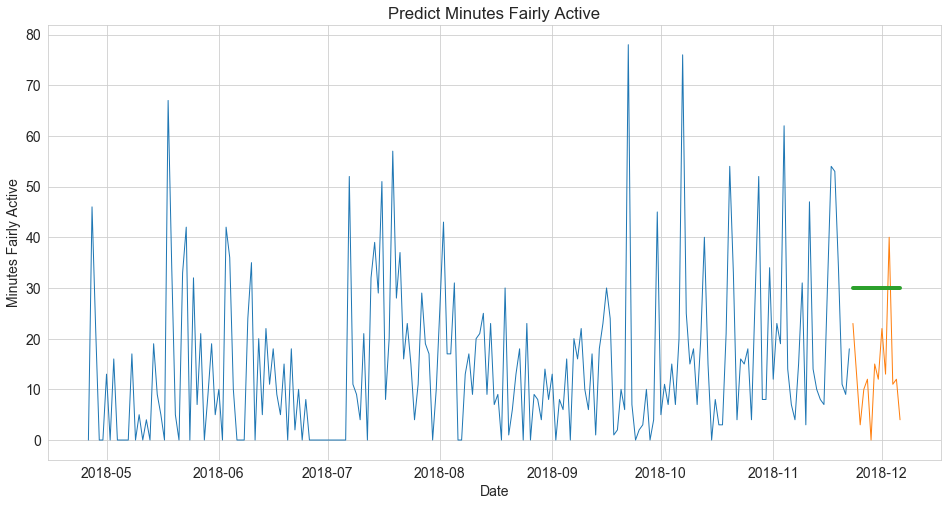

Minutes Fairly Active -- MSE: 361.00 RMSE: 19.00


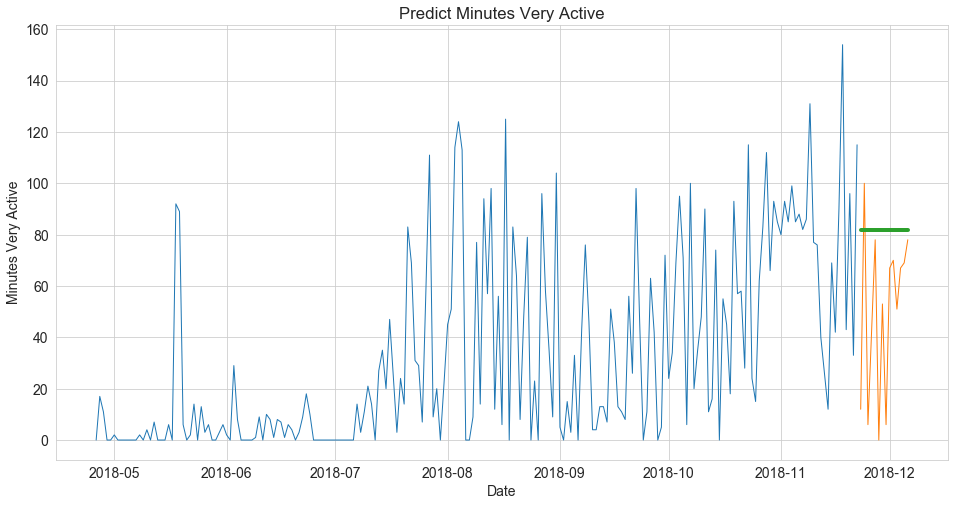

Minutes Very Active -- MSE: 1969.21 RMSE: 44.38


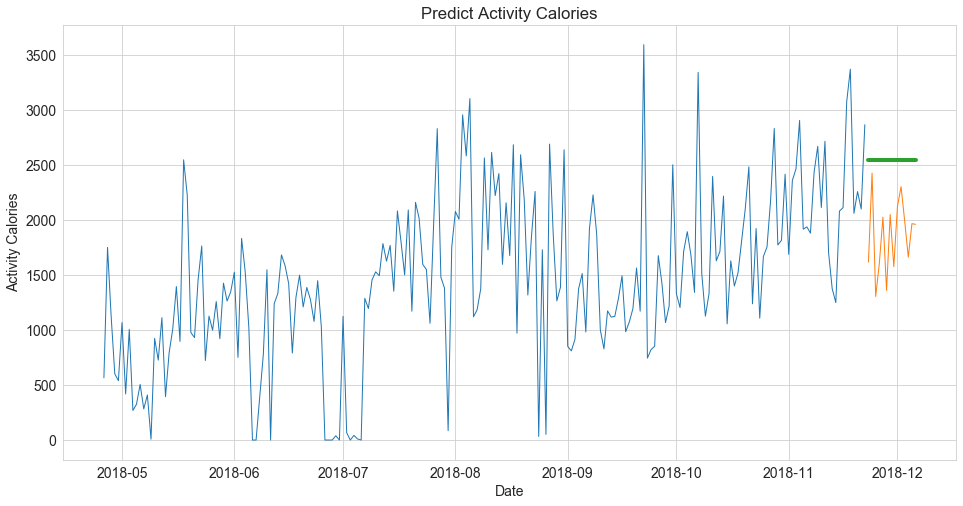

Activity Calories -- MSE: 588718.07 RMSE: 767.28


In [48]:
model.plot_and_eval(yhat, list(df.columns), train, test)

In [49]:
moving_average_7 = model.append_eval_df(yhat, 'Moving Average (7 days)', train, test)
moving_average_7

,model_type,target_var,metric,value
0,Moving Average (7 days),Calories Burned,mse,4.540137e+05
1,Moving Average (7 days),Calories Burned,rmse,6.738054e+02
2,Moving Average (7 days),Steps,mse,2.426509e+07
3,Moving Average (7 days),Steps,rmse,4.925961e+03
4,Moving Average (7 days),Distance,mse,5.207879e+00
5,Moving Average (7 days),Distance,rmse,2.282078e+00
6,Moving Average (7 days),Floors,mse,2.397561e+03
7,Moving Average (7 days),Floors,rmse,4.896490e+01
8,Moving Average (7 days),Minutes Sedentary,mse,1.544086e+04
9,Moving Average (7 days),Minutes Sedentary,rmse,1.242612e+02


periods = 14 days

In [50]:
yhat = model.moving_average(yhat, train, 14)
yhat

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Date,,,,,,,,,
2018-11-23,3940.642857,14435.571429,6.87,35.5,601.714286,247.428571,23.571429,71.714286,2269.357143
2018-11-24,3940.642857,14435.571429,6.87,35.5,601.714286,247.428571,23.571429,71.714286,2269.357143
2018-11-25,3940.642857,14435.571429,6.87,35.5,601.714286,247.428571,23.571429,71.714286,2269.357143
2018-11-26,3940.642857,14435.571429,6.87,35.5,601.714286,247.428571,23.571429,71.714286,2269.357143
2018-11-27,3940.642857,14435.571429,6.87,35.5,601.714286,247.428571,23.571429,71.714286,2269.357143
2018-11-28,3940.642857,14435.571429,6.87,35.5,601.714286,247.428571,23.571429,71.714286,2269.357143
2018-11-29,3940.642857,14435.571429,6.87,35.5,601.714286,247.428571,23.571429,71.714286,2269.357143
2018-11-30,3940.642857,14435.571429,6.87,35.5,601.714286,247.428571,23.571429,71.714286,2269.357143
2018-12-01,3940.642857,14435.571429,6.87,35.5,601.714286,247.428571,23.571429,71.714286,2269.357143


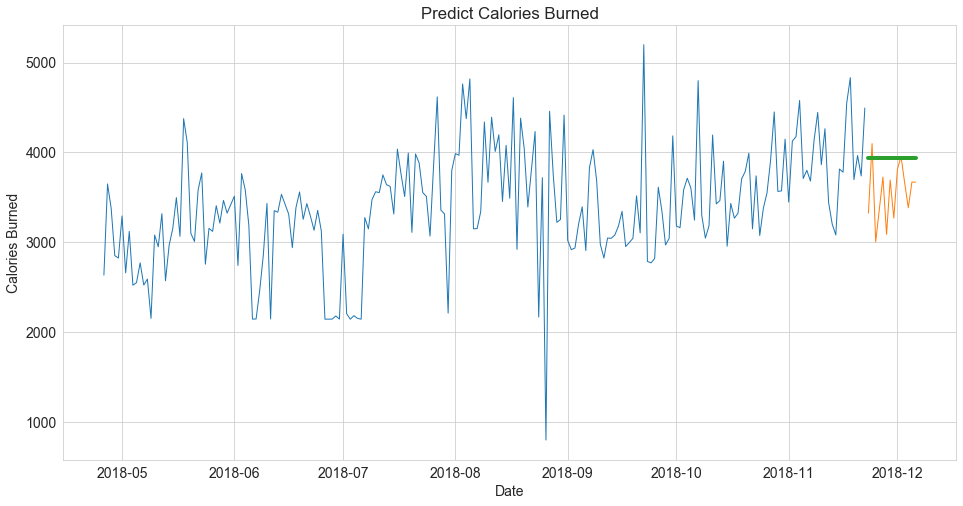

Calories Burned -- MSE: 246388.13 RMSE: 496.37


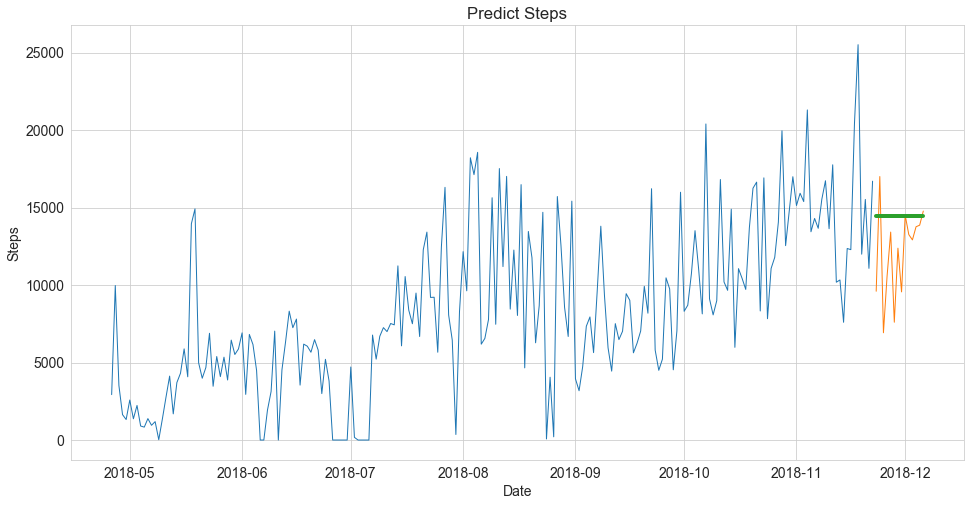

Steps -- MSE: 12982884.54 RMSE: 3603.18


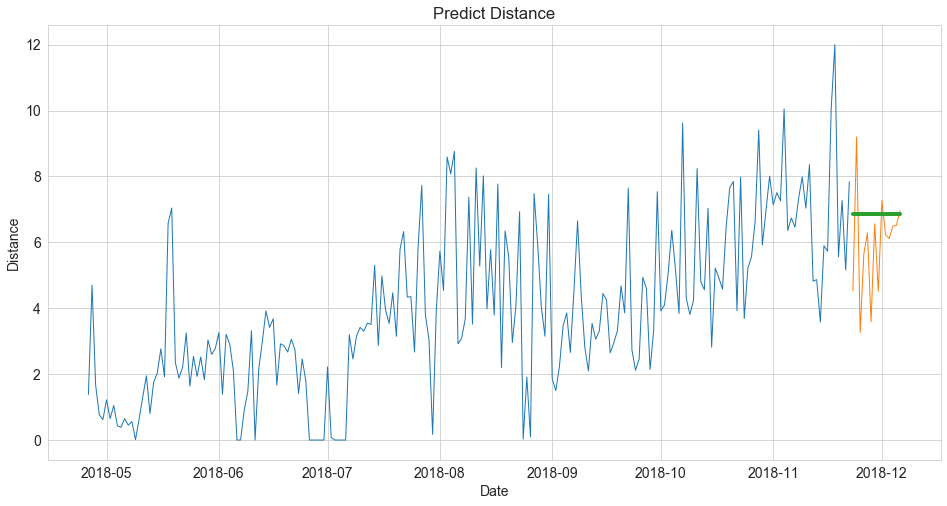

Distance -- MSE: 3.12 RMSE: 1.77


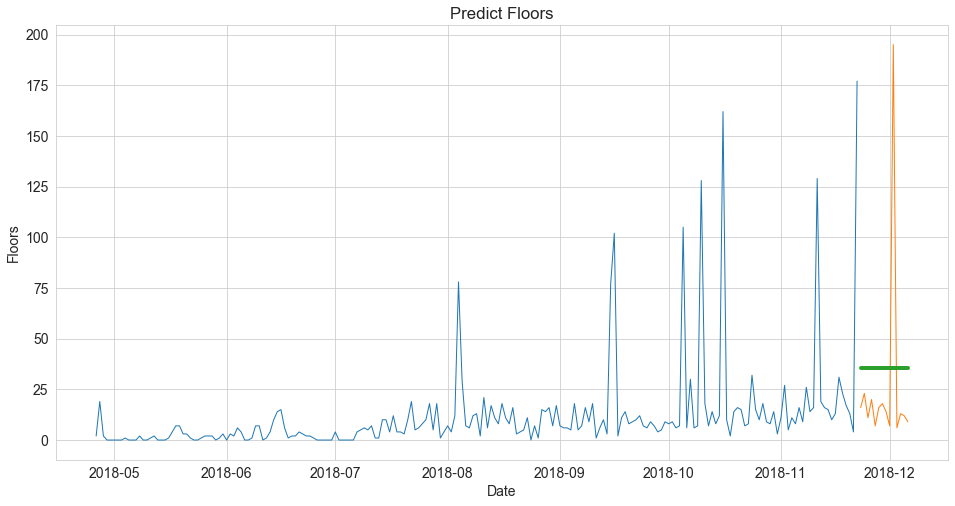

Floors -- MSE: 2301.54 RMSE: 47.97


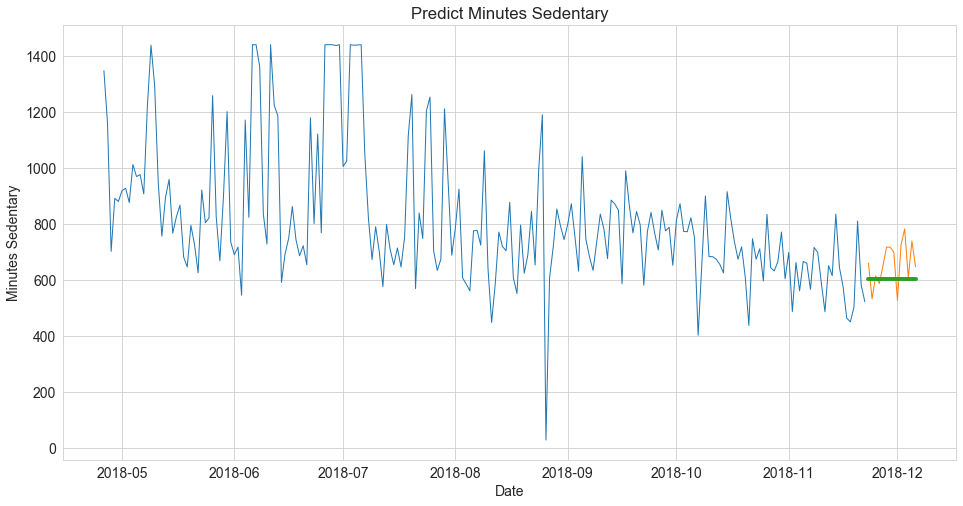

Minutes Sedentary -- MSE: 8658.90 RMSE: 93.05


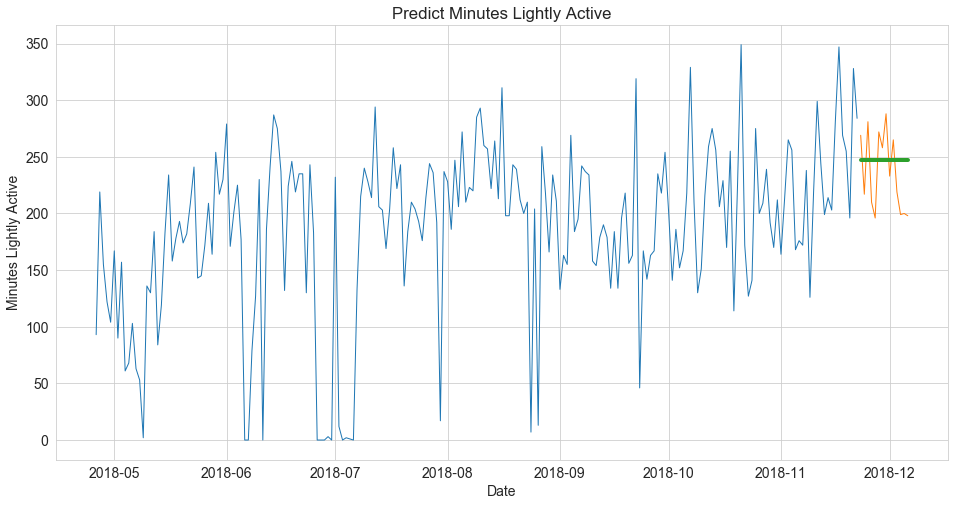

Minutes Lightly Active -- MSE: 1234.91 RMSE: 35.14


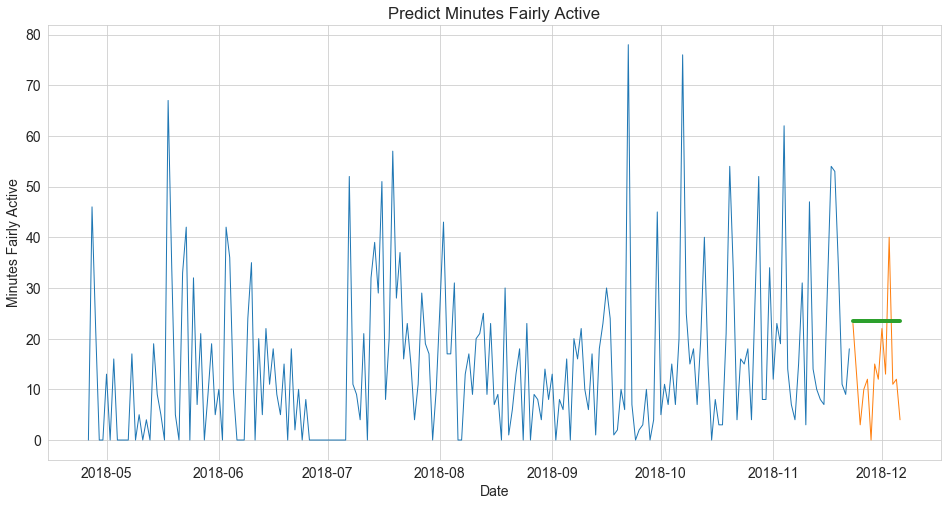

Minutes Fairly Active -- MSE: 191.10 RMSE: 13.82


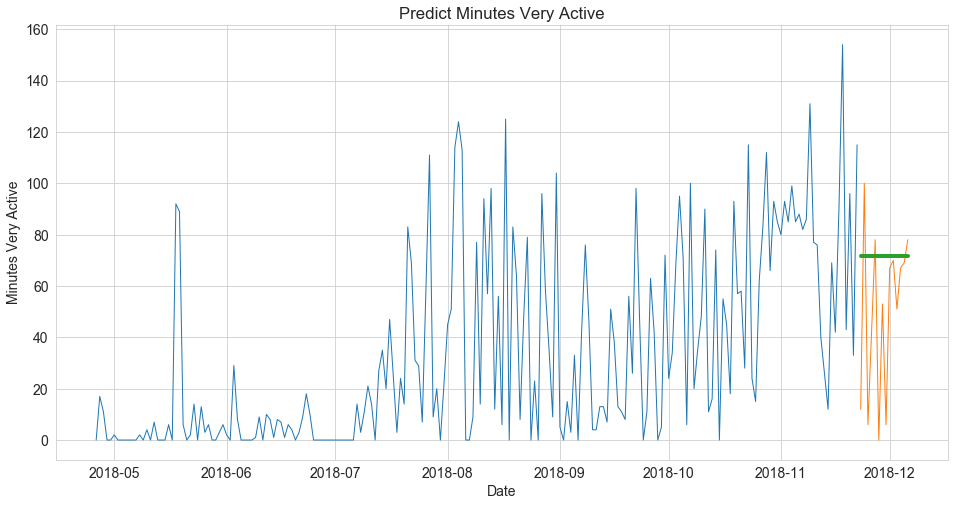

Minutes Very Active -- MSE: 1424.40 RMSE: 37.74


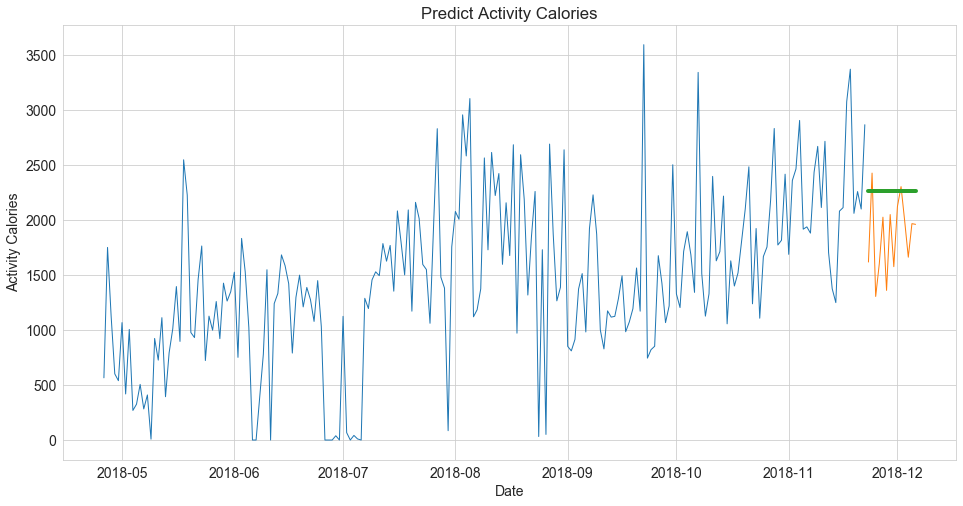

Activity Calories -- MSE: 277155.23 RMSE: 526.46


In [51]:
model.plot_and_eval(yhat, list(df.columns), train, test)

In [52]:
moving_average_14 = model.append_eval_df(yhat, 'Moving Average (14 days)', train, test)
moving_average_14

,model_type,target_var,metric,value
0,Moving Average (14 days),Calories Burned,mse,2.463881e+05
1,Moving Average (14 days),Calories Burned,rmse,4.963750e+02
2,Moving Average (14 days),Steps,mse,1.298288e+07
3,Moving Average (14 days),Steps,rmse,3.603177e+03
4,Moving Average (14 days),Distance,mse,3.115507e+00
5,Moving Average (14 days),Distance,rmse,1.765080e+00
6,Moving Average (14 days),Floors,mse,2.301536e+03
7,Moving Average (14 days),Floors,rmse,4.797432e+01
8,Moving Average (14 days),Minutes Sedentary,mse,8.658898e+03
9,Moving Average (14 days),Minutes Sedentary,rmse,9.305320e+01


periods = 21

In [53]:
yhat = model.moving_average(yhat, train, 21)

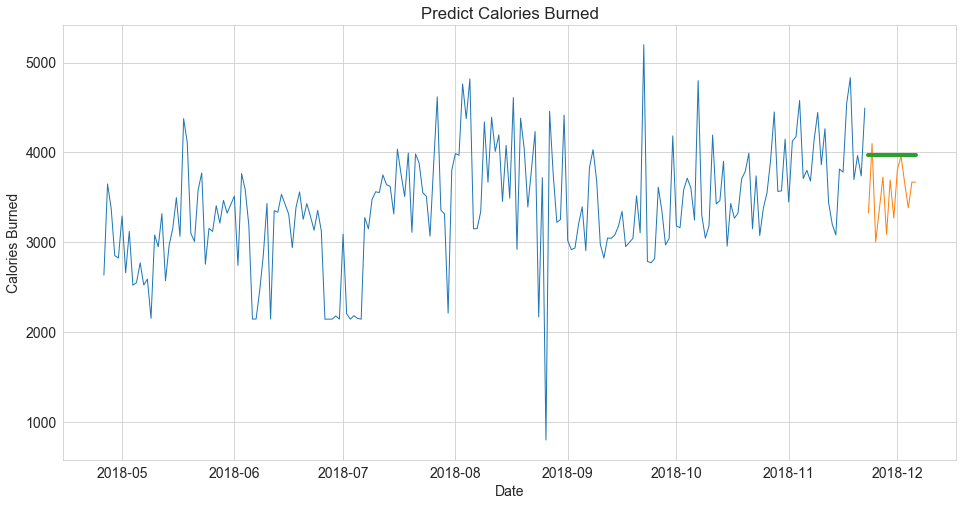

Calories Burned -- MSE: 270337.44 RMSE: 519.94


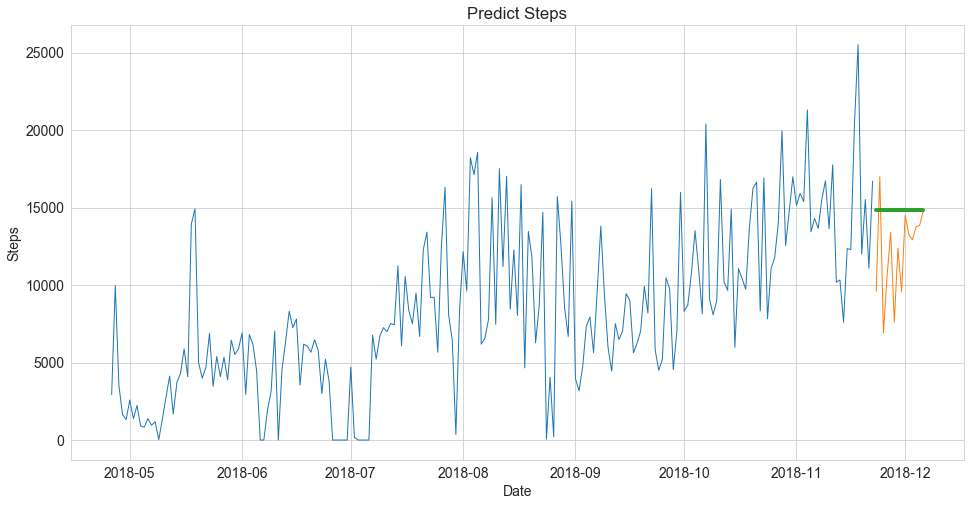

Steps -- MSE: 14997989.56 RMSE: 3872.72


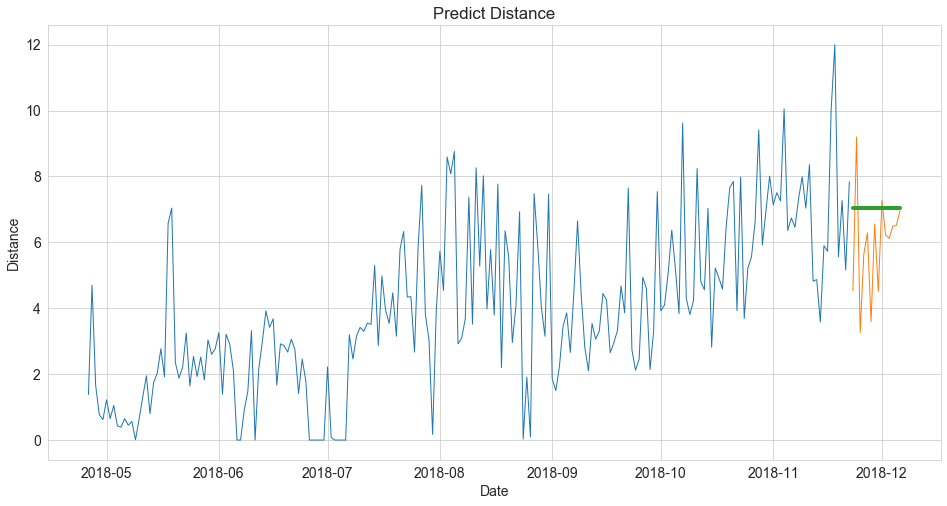

Distance -- MSE: 3.47 RMSE: 1.86


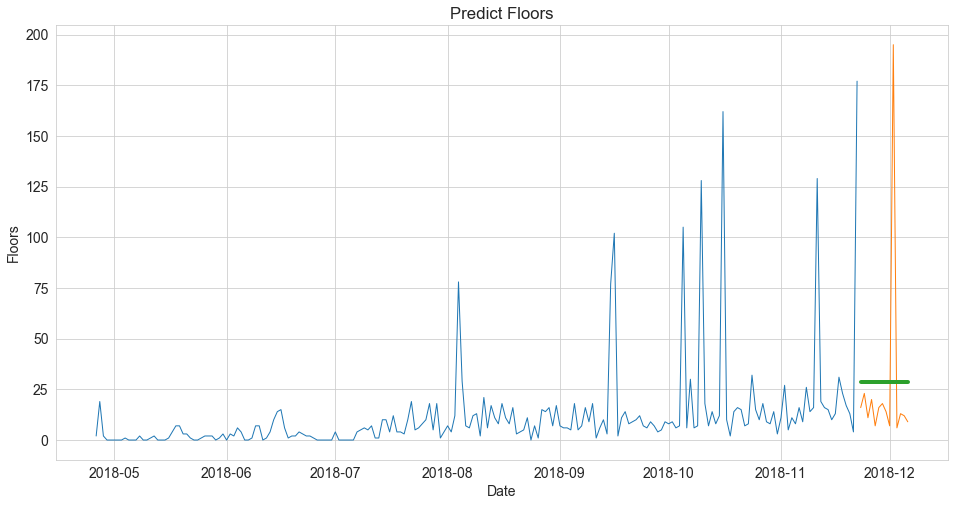

Floors -- MSE: 2220.65 RMSE: 47.12


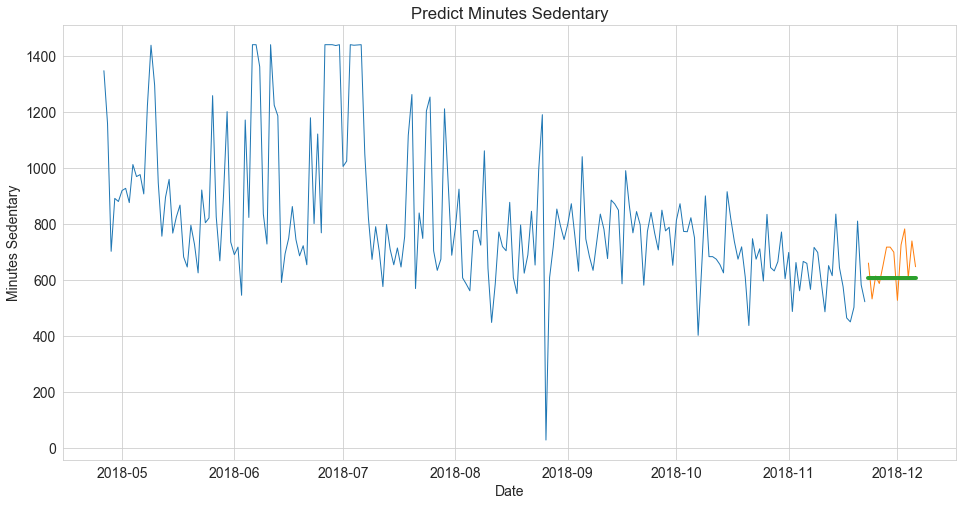

Minutes Sedentary -- MSE: 8126.76 RMSE: 90.15


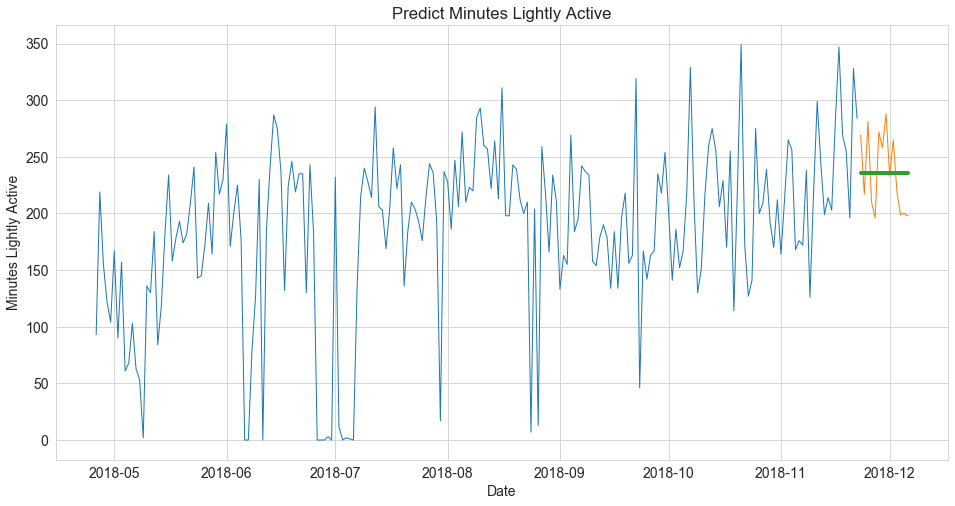

Minutes Lightly Active -- MSE: 1105.99 RMSE: 33.26


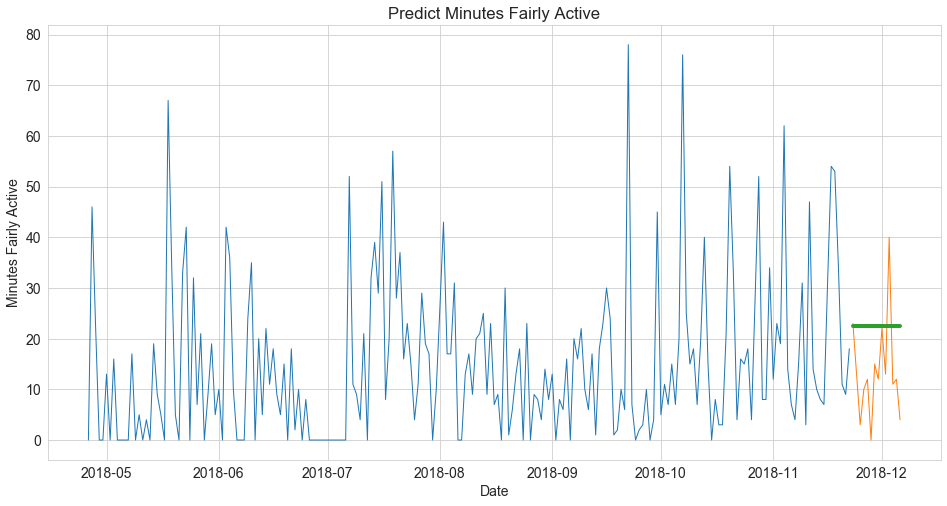

Minutes Fairly Active -- MSE: 172.10 RMSE: 13.12


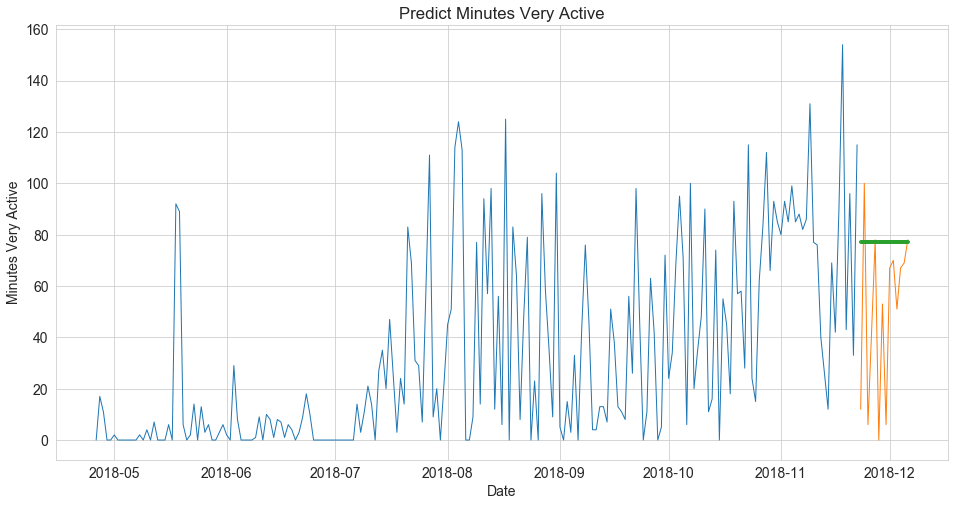

Minutes Very Active -- MSE: 1695.59 RMSE: 41.18


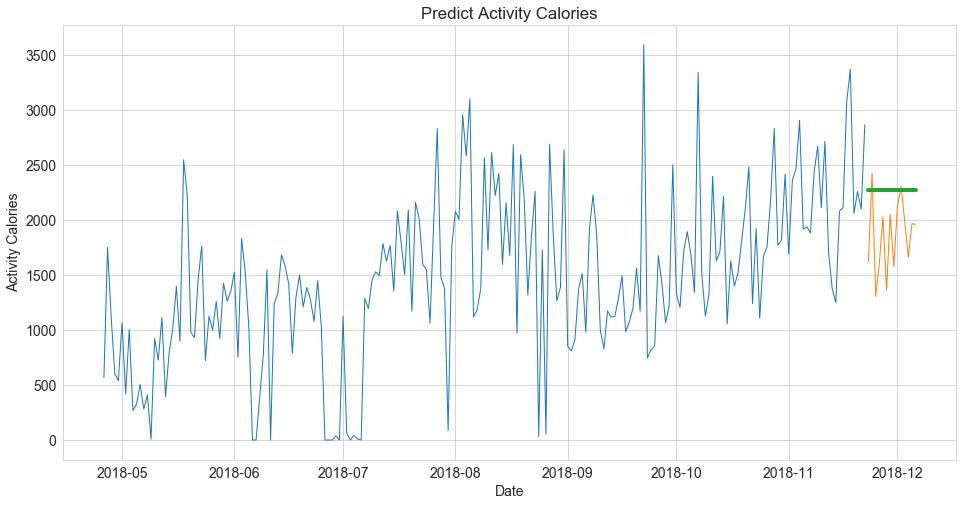

Activity Calories -- MSE: 278080.82 RMSE: 527.33


In [54]:
model.plot_and_eval(yhat, list(df.columns), train, test)

In [55]:
moving_average_21 = model.append_eval_df(yhat, 'Moving Average (21 days)', train, test)
moving_average_21

,model_type,target_var,metric,value
0,Moving Average (21 days),Calories Burned,mse,2.703374e+05
1,Moving Average (21 days),Calories Burned,rmse,5.199398e+02
2,Moving Average (21 days),Steps,mse,1.499799e+07
3,Moving Average (21 days),Steps,rmse,3.872724e+03
4,Moving Average (21 days),Distance,mse,3.465605e+00
5,Moving Average (21 days),Distance,rmse,1.861613e+00
6,Moving Average (21 days),Floors,mse,2.220645e+03
7,Moving Average (21 days),Floors,rmse,4.712372e+01
8,Moving Average (21 days),Minutes Sedentary,mse,8.126755e+03
9,Moving Average (21 days),Minutes Sedentary,rmse,9.014852e+01


periods = 30 days

In [56]:
yhat = model.moving_average(yhat, train, 30)

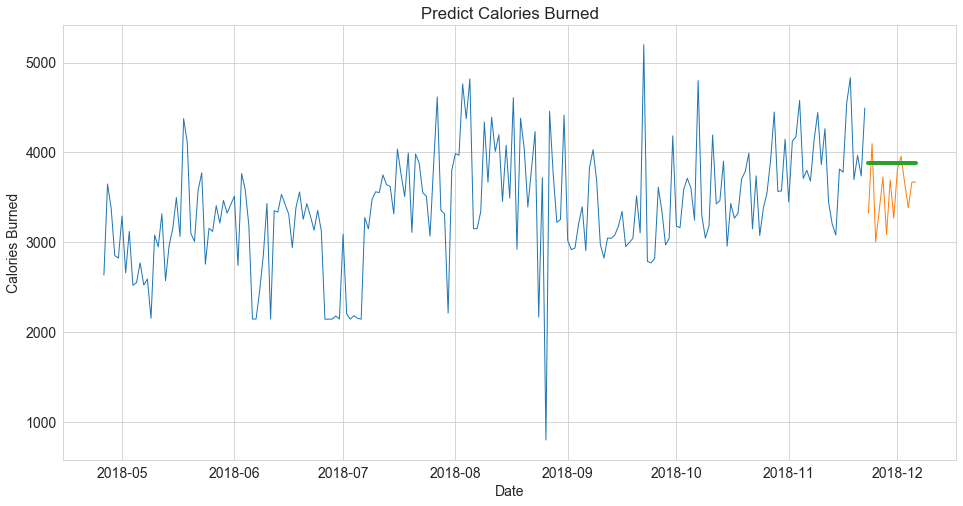

Calories Burned -- MSE: 204561.10 RMSE: 452.28


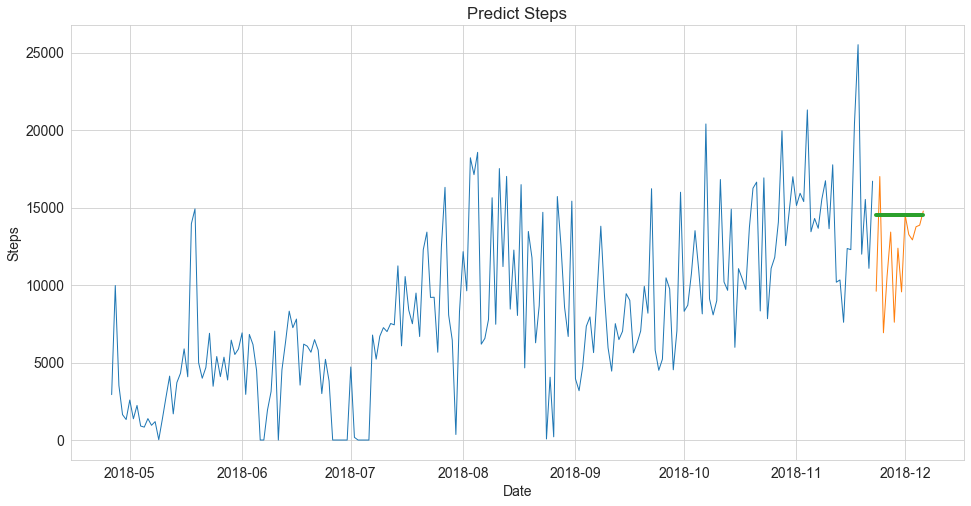

Steps -- MSE: 13411569.40 RMSE: 3662.18


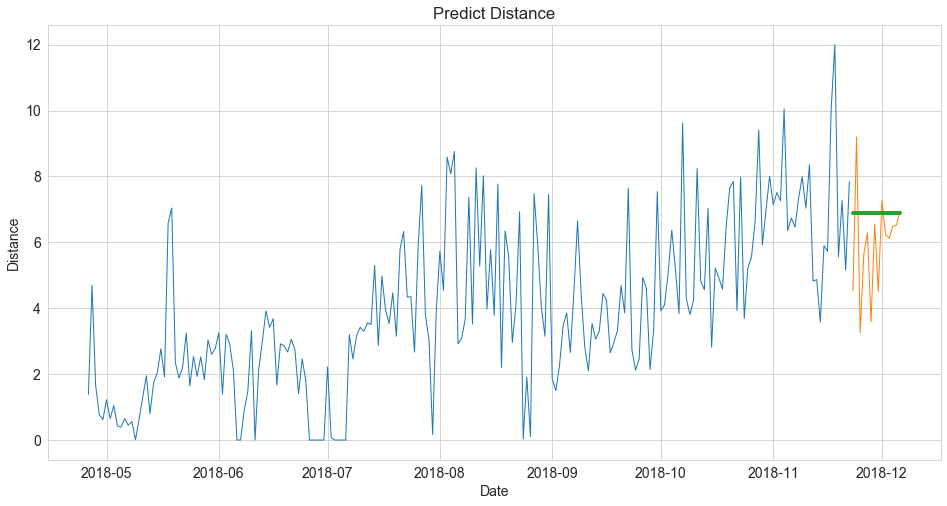

Distance -- MSE: 3.14 RMSE: 1.77


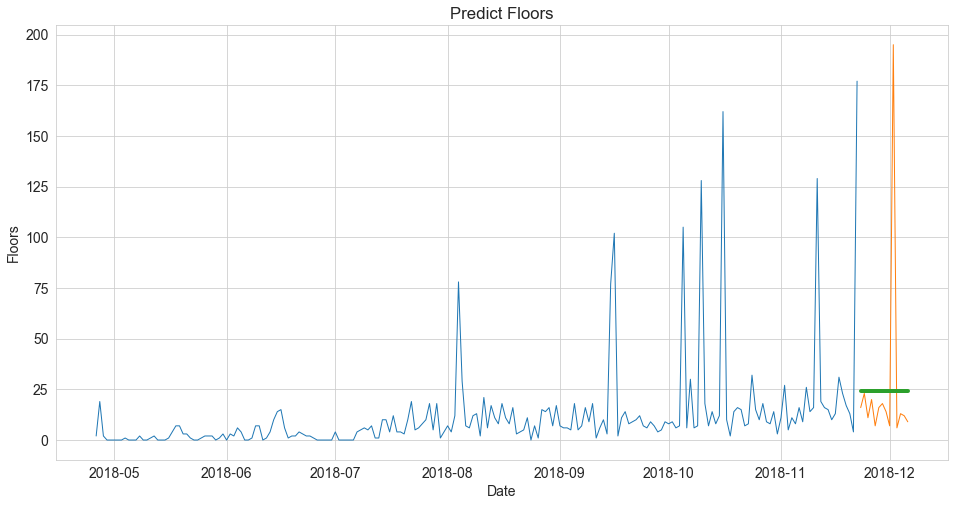

Floors -- MSE: 2220.36 RMSE: 47.12


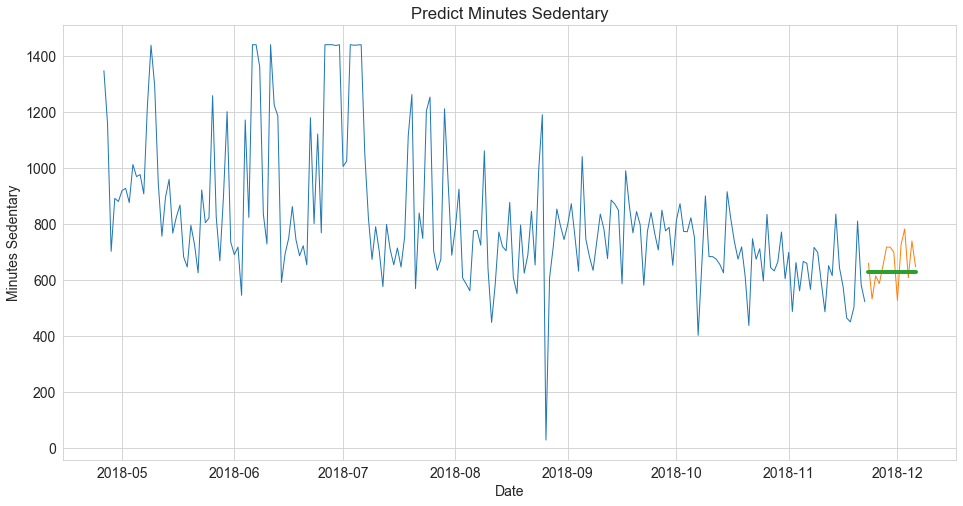

Minutes Sedentary -- MSE: 6314.47 RMSE: 79.46


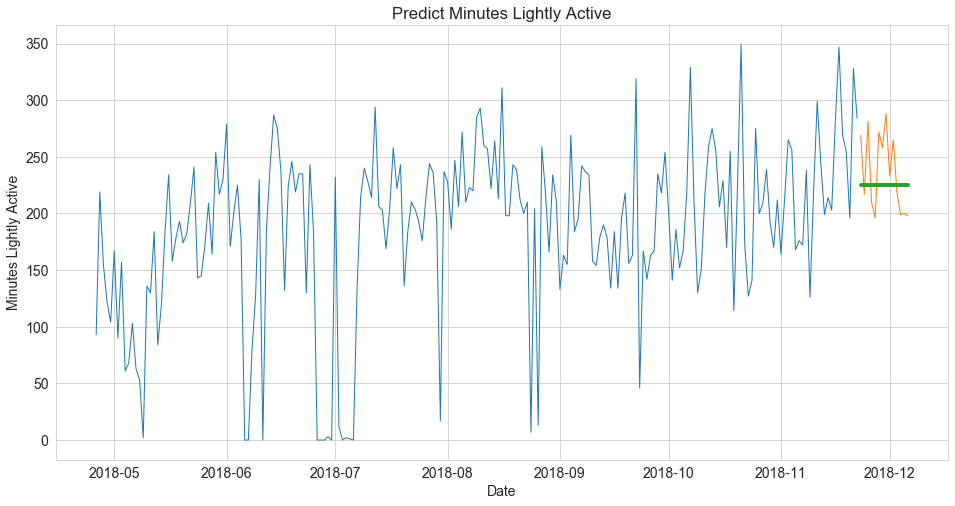

Minutes Lightly Active -- MSE: 1225.57 RMSE: 35.01


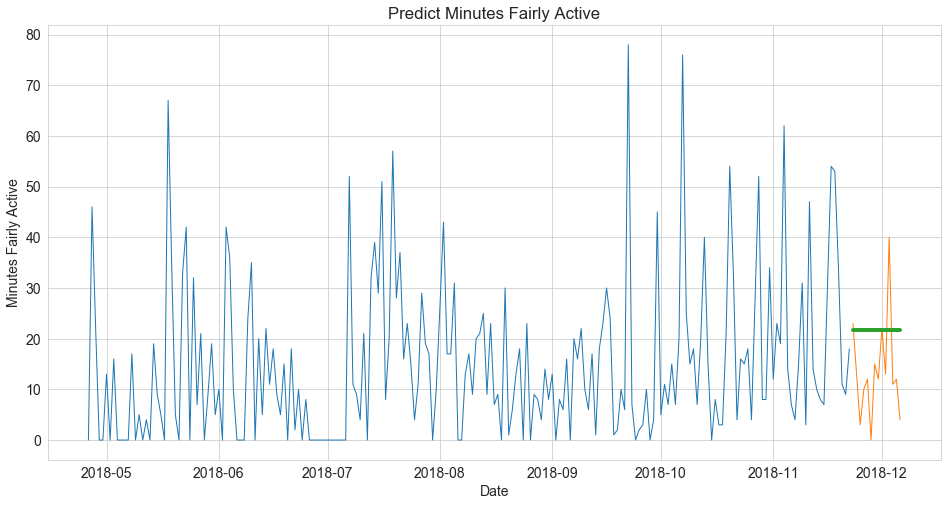

Minutes Fairly Active -- MSE: 158.26 RMSE: 12.58


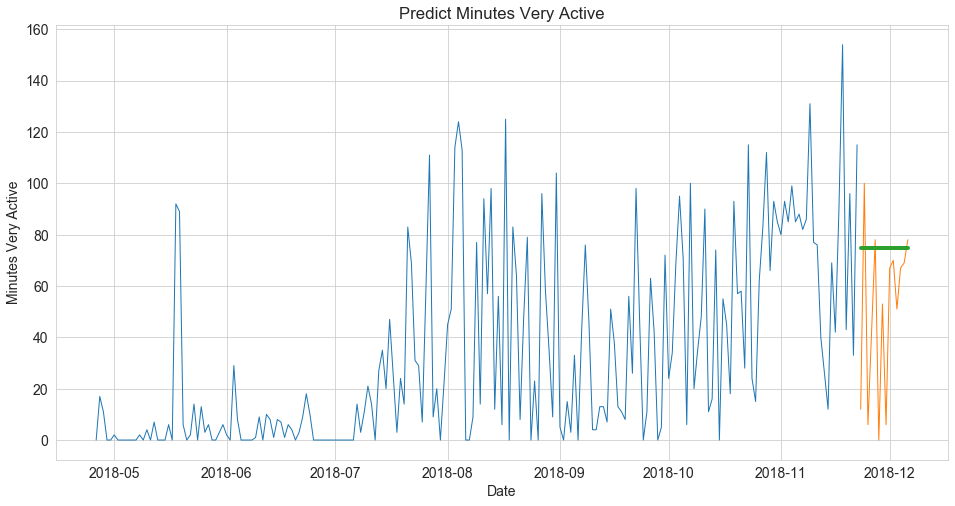

Minutes Very Active -- MSE: 1565.06 RMSE: 39.56


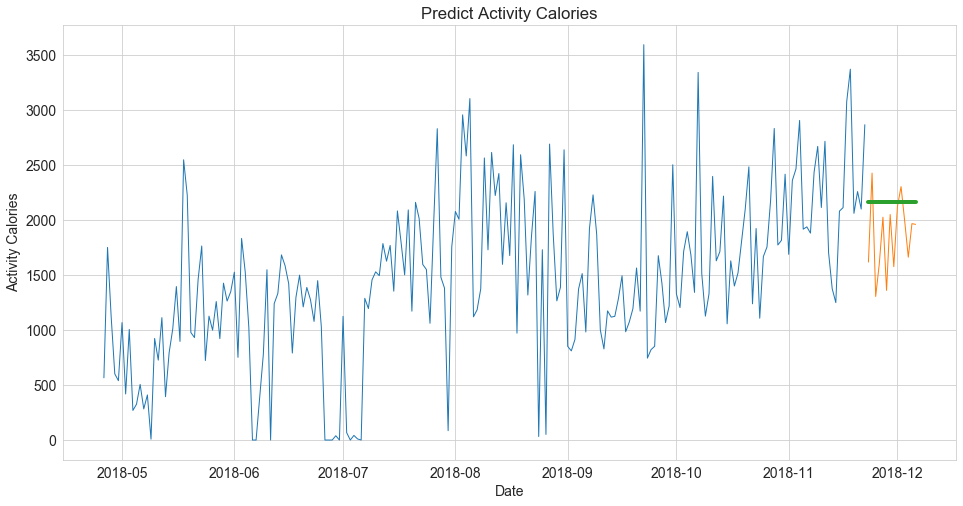

Activity Calories -- MSE: 201353.45 RMSE: 448.72


In [57]:
model.plot_and_eval(yhat, list(df.columns), train, test)

In [58]:
moving_average_30 = model.append_eval_df(yhat, 'Moving Average (30 days)', train, test)
moving_average_30

,model_type,target_var,metric,value
0,Moving Average (30 days),Calories Burned,mse,2.045611e+05
1,Moving Average (30 days),Calories Burned,rmse,4.522843e+02
2,Moving Average (30 days),Steps,mse,1.341157e+07
3,Moving Average (30 days),Steps,rmse,3.662181e+03
4,Moving Average (30 days),Distance,mse,3.137327e+00
5,Moving Average (30 days),Distance,rmse,1.771250e+00
6,Moving Average (30 days),Floors,mse,2.220363e+03
7,Moving Average (30 days),Floors,rmse,4.712073e+01
8,Moving Average (30 days),Minutes Sedentary,mse,6.314475e+03
9,Moving Average (30 days),Minutes Sedentary,rmse,7.946367e+01


periods = 60

In [59]:
yhat = model.moving_average(yhat, train, 60)

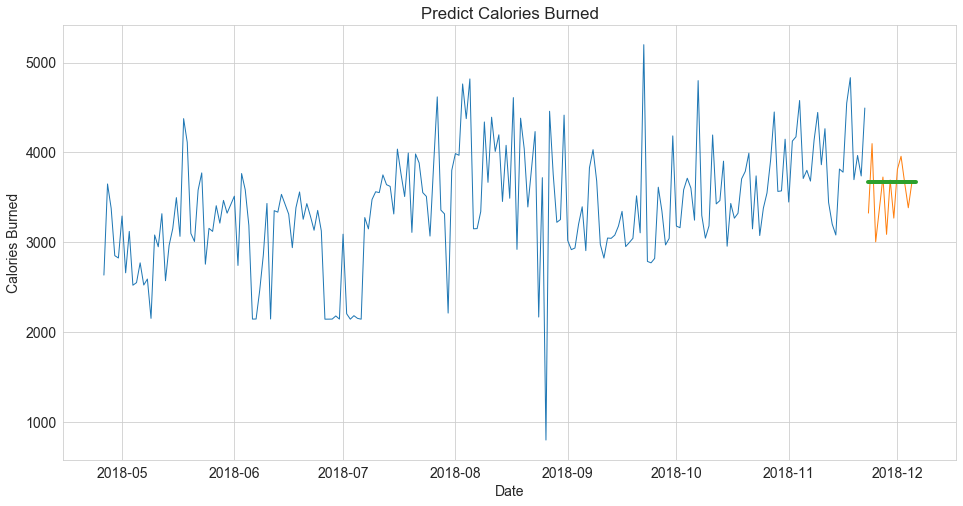

Calories Burned -- MSE: 109722.26 RMSE: 331.24


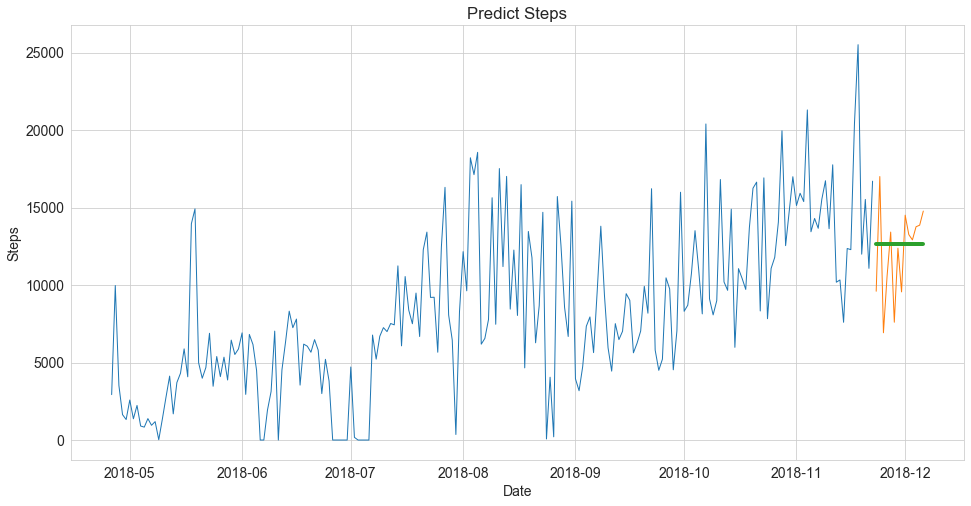

Steps -- MSE: 8050927.90 RMSE: 2837.42


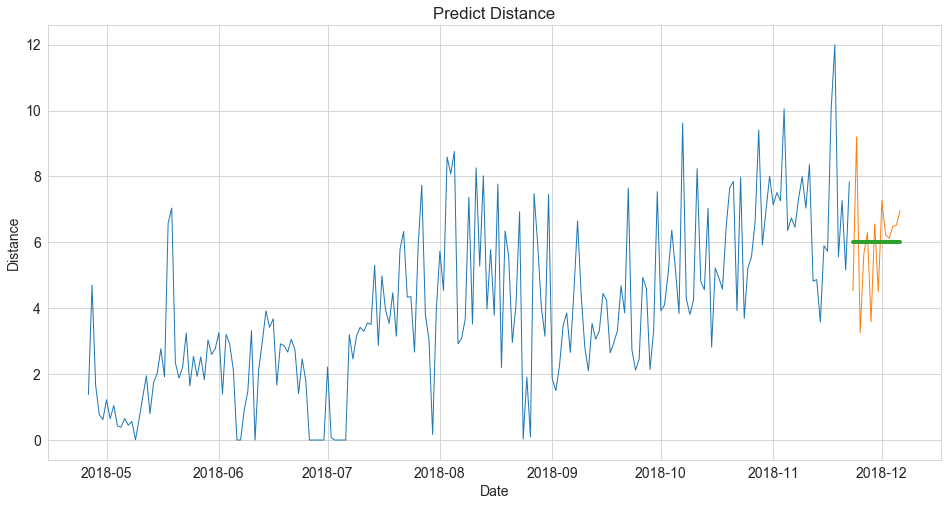

Distance -- MSE: 2.26 RMSE: 1.50


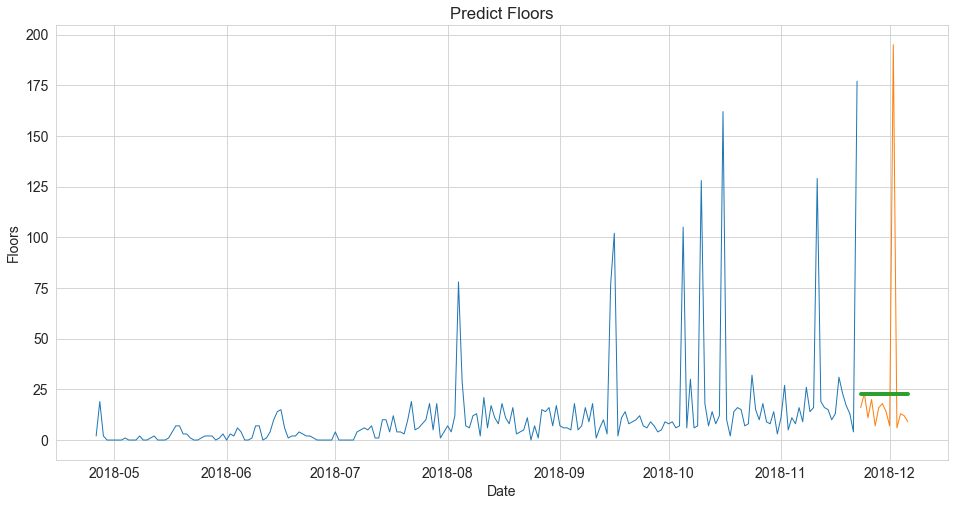

Floors -- MSE: 2226.63 RMSE: 47.19


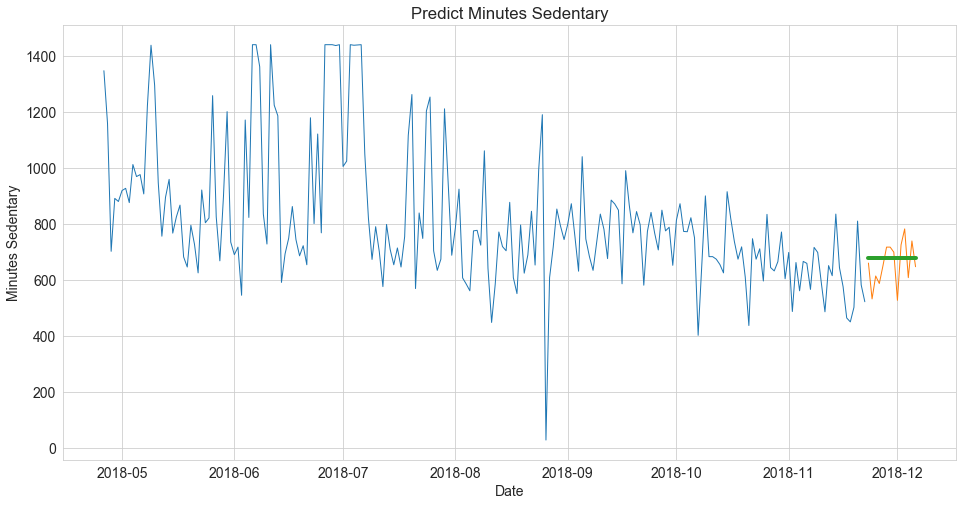

Minutes Sedentary -- MSE: 5976.63 RMSE: 77.31


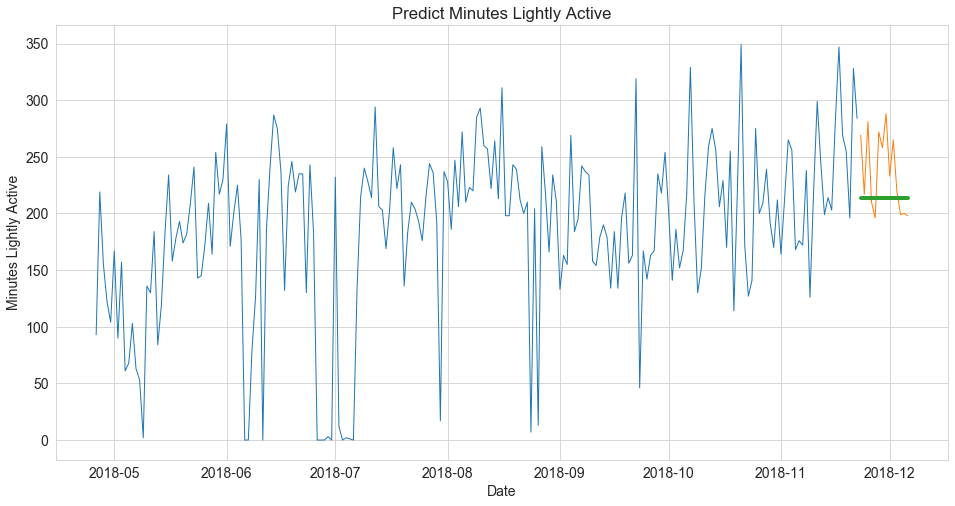

Minutes Lightly Active -- MSE: 1595.28 RMSE: 39.94


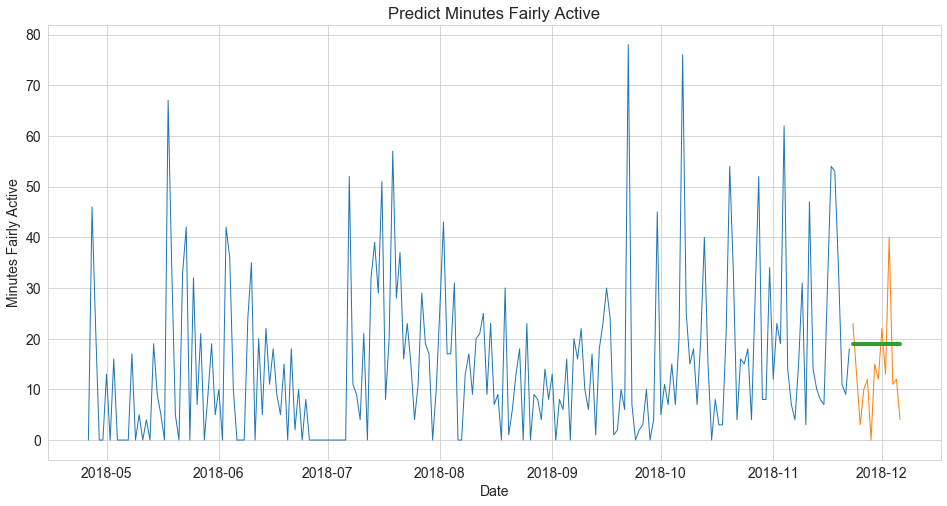

Minutes Fairly Active -- MSE: 120.57 RMSE: 10.98


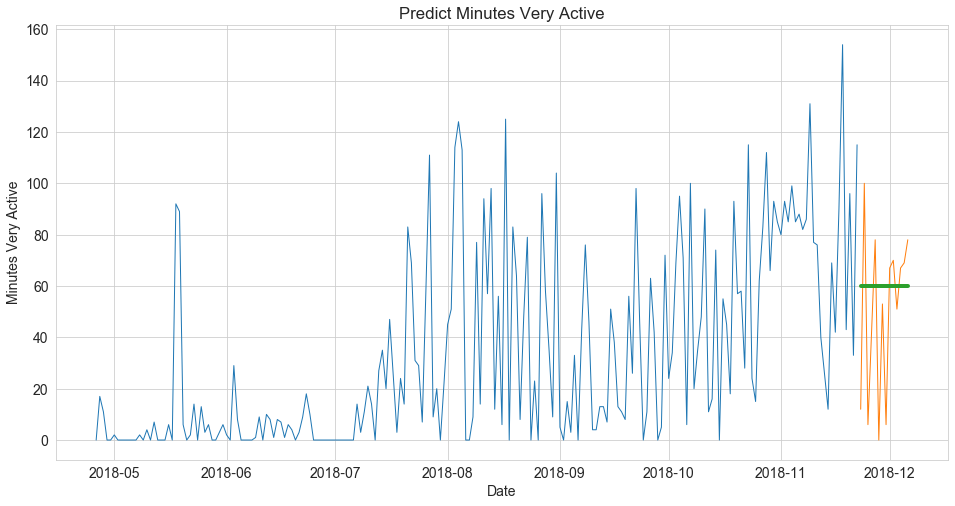

Minutes Very Active -- MSE: 1050.21 RMSE: 32.41


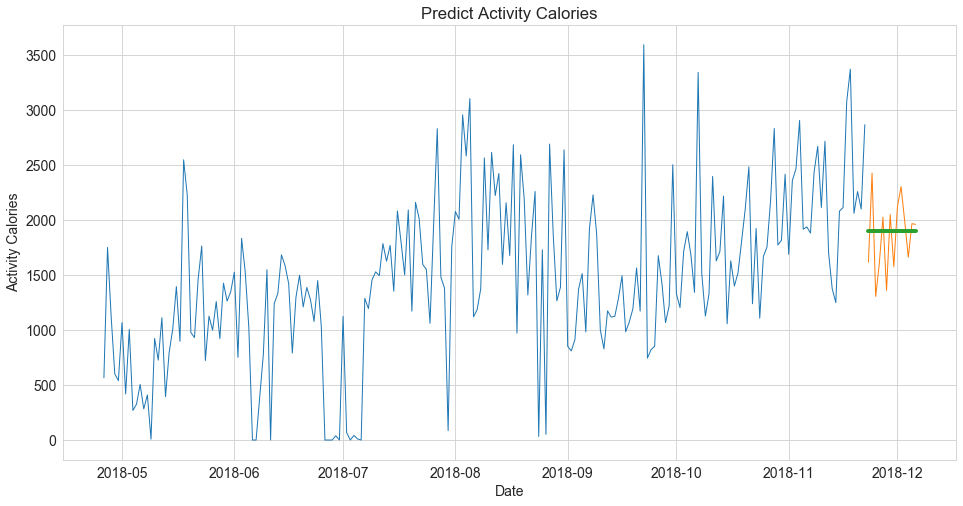

Activity Calories -- MSE: 108664.94 RMSE: 329.64


In [60]:
model.plot_and_eval(yhat, list(df.columns), train, test)

In [61]:
moving_average_60 = model.append_eval_df(yhat, 'Moving Average (60 days)', train, test)
moving_average_60

,model_type,target_var,metric,value
0,Moving Average (60 days),Calories Burned,mse,1.097223e+05
1,Moving Average (60 days),Calories Burned,rmse,3.312435e+02
2,Moving Average (60 days),Steps,mse,8.050928e+06
3,Moving Average (60 days),Steps,rmse,2.837416e+03
4,Moving Average (60 days),Distance,mse,2.255630e+00
5,Moving Average (60 days),Distance,rmse,1.501876e+00
6,Moving Average (60 days),Floors,mse,2.226630e+03
7,Moving Average (60 days),Floors,rmse,4.718718e+01
8,Moving Average (60 days),Minutes Sedentary,mse,5.976630e+03
9,Moving Average (60 days),Minutes Sedentary,rmse,7.730866e+01


periods = 90

In [62]:
yhat = model.moving_average(yhat, train, 90)
yhat

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Date,,,,,,,,,
2018-11-23,3544.666667,11095.411111,5.252111,20.111111,706.722222,204.044444,17.111111,50.344444,1739.944444
2018-11-24,3544.666667,11095.411111,5.252111,20.111111,706.722222,204.044444,17.111111,50.344444,1739.944444
2018-11-25,3544.666667,11095.411111,5.252111,20.111111,706.722222,204.044444,17.111111,50.344444,1739.944444
2018-11-26,3544.666667,11095.411111,5.252111,20.111111,706.722222,204.044444,17.111111,50.344444,1739.944444
2018-11-27,3544.666667,11095.411111,5.252111,20.111111,706.722222,204.044444,17.111111,50.344444,1739.944444
2018-11-28,3544.666667,11095.411111,5.252111,20.111111,706.722222,204.044444,17.111111,50.344444,1739.944444
2018-11-29,3544.666667,11095.411111,5.252111,20.111111,706.722222,204.044444,17.111111,50.344444,1739.944444
2018-11-30,3544.666667,11095.411111,5.252111,20.111111,706.722222,204.044444,17.111111,50.344444,1739.944444
2018-12-01,3544.666667,11095.411111,5.252111,20.111111,706.722222,204.044444,17.111111,50.344444,1739.944444


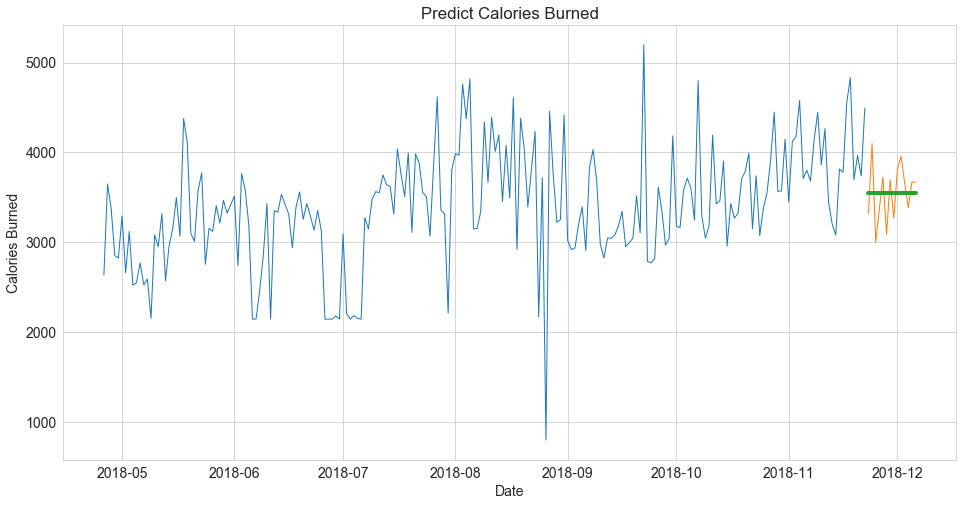

Calories Burned -- MSE: 95002.66 RMSE: 308.23


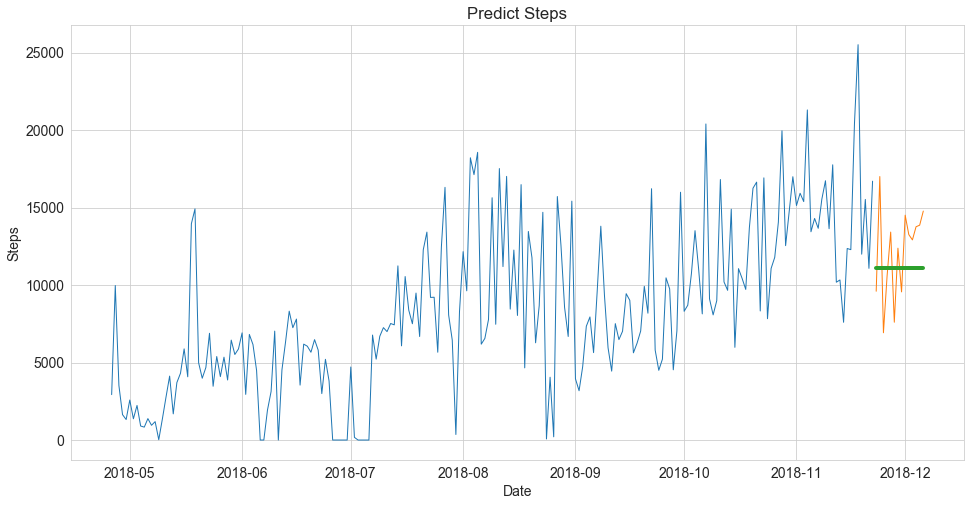

Steps -- MSE: 8887906.31 RMSE: 2981.26


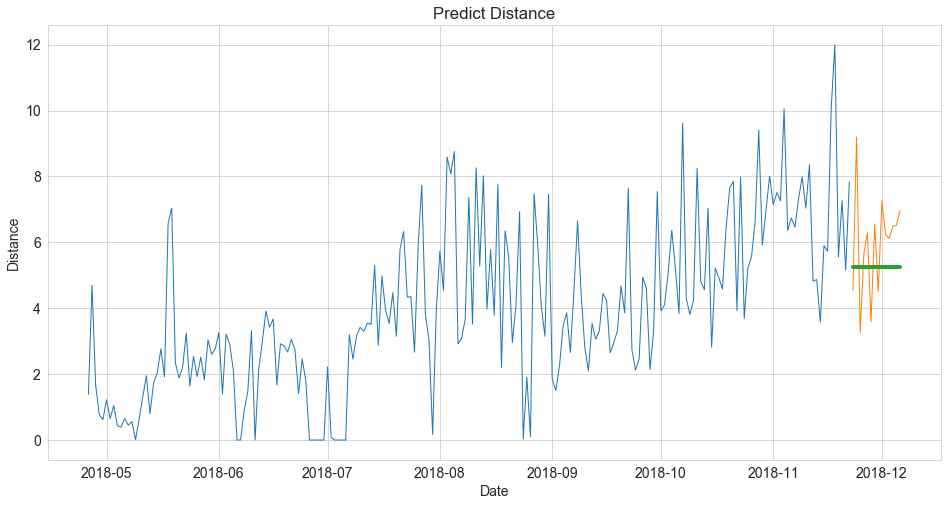

Distance -- MSE: 2.73 RMSE: 1.65


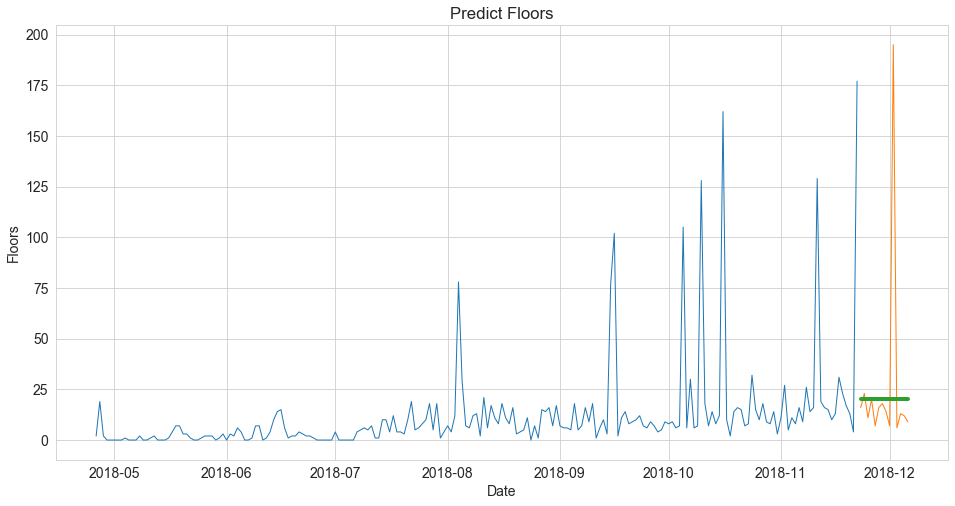

Floors -- MSE: 2252.56 RMSE: 47.46


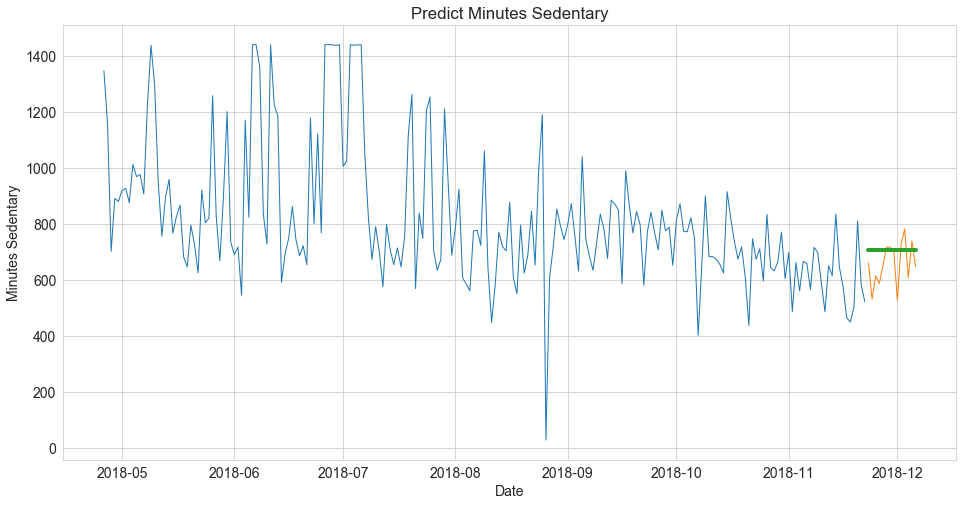

Minutes Sedentary -- MSE: 7984.68 RMSE: 89.36


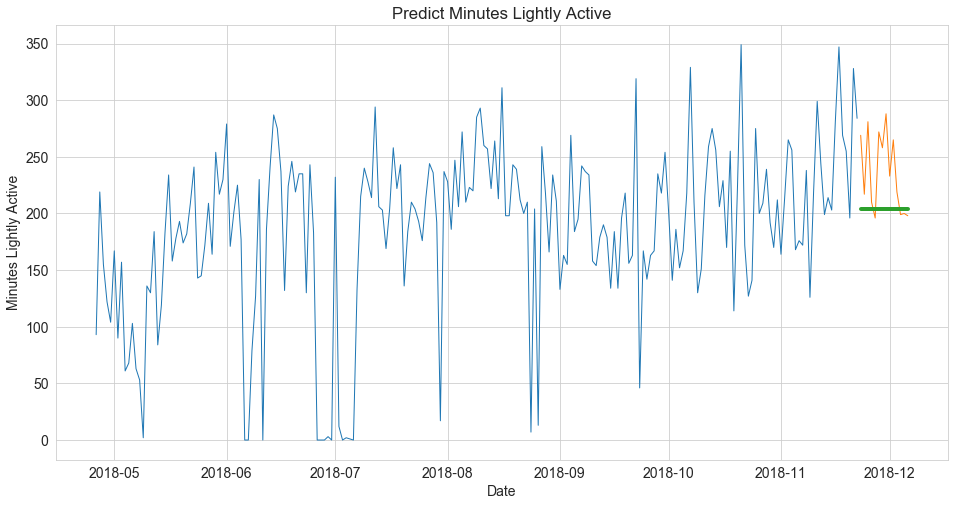

Minutes Lightly Active -- MSE: 2131.65 RMSE: 46.17


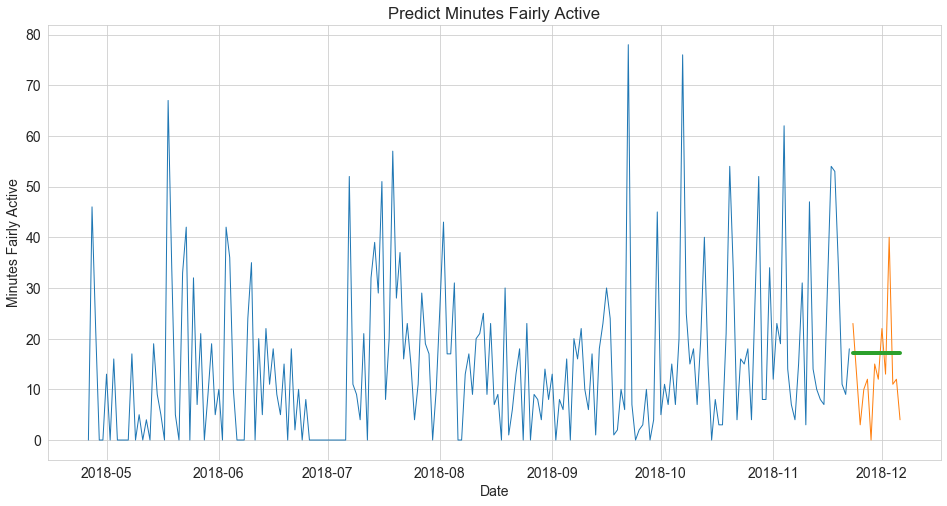

Minutes Fairly Active -- MSE: 103.63 RMSE: 10.18


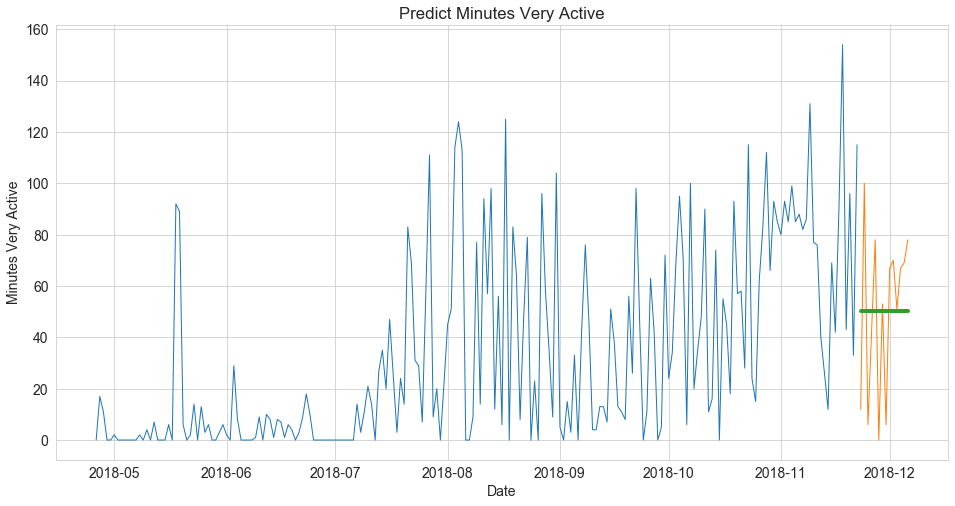

Minutes Very Active -- MSE: 949.95 RMSE: 30.82


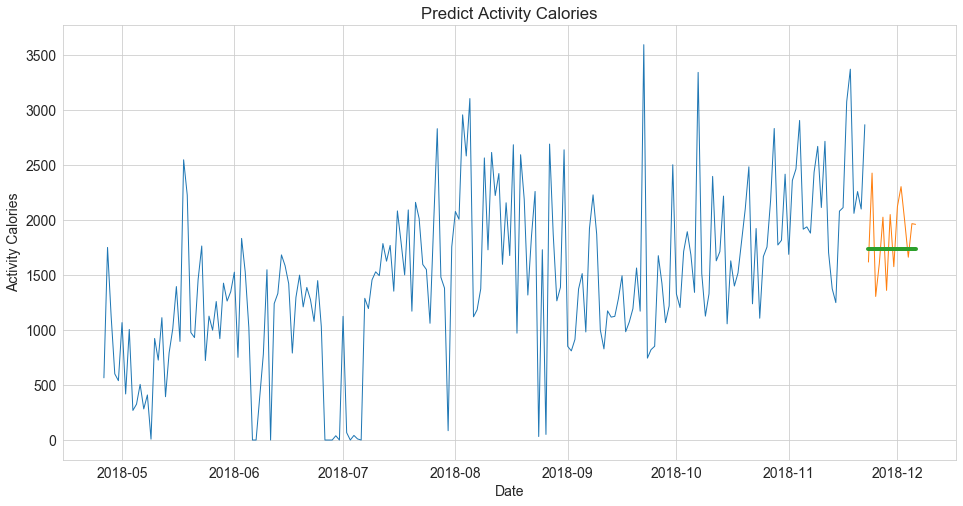

Activity Calories -- MSE: 120138.15 RMSE: 346.61


In [63]:
model.plot_and_eval(yhat, list(df.columns), train, test)

In [64]:
moving_average_90 = model.append_eval_df(yhat, 'Moving Average (90 days)', train, test)
moving_average_90

,model_type,target_var,metric,value
0,Moving Average (90 days),Calories Burned,mse,9.500266e+04
1,Moving Average (90 days),Calories Burned,rmse,3.082250e+02
2,Moving Average (90 days),Steps,mse,8.887906e+06
3,Moving Average (90 days),Steps,rmse,2.981259e+03
4,Moving Average (90 days),Distance,mse,2.726110e+00
5,Moving Average (90 days),Distance,rmse,1.651093e+00
6,Moving Average (90 days),Floors,mse,2.252560e+03
7,Moving Average (90 days),Floors,rmse,4.746114e+01
8,Moving Average (90 days),Minutes Sedentary,mse,7.984680e+03
9,Moving Average (90 days),Minutes Sedentary,rmse,8.935704e+01


# Holt's Linear Trend

In [65]:
yhat = model.holt_linear_trend(yhat,train, test)

Calories Burned 



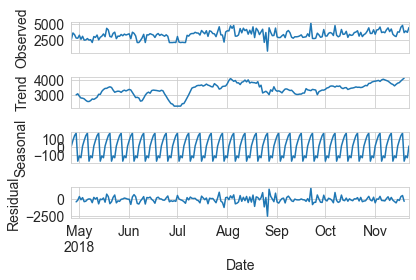

Steps 



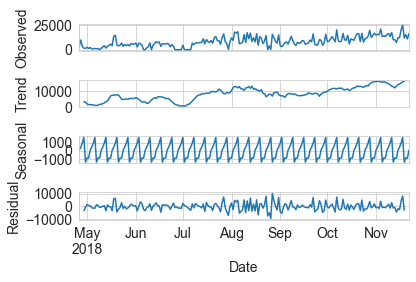

Distance 



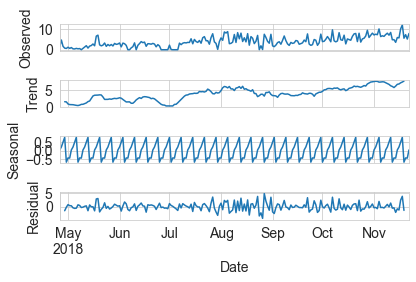

Floors 



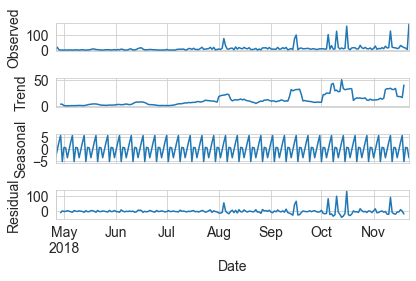

Minutes Sedentary 



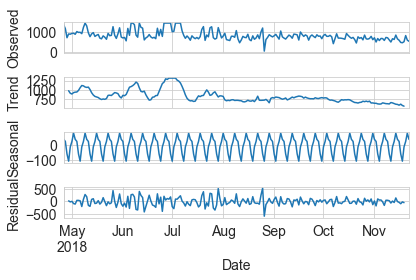

Minutes Lightly Active 



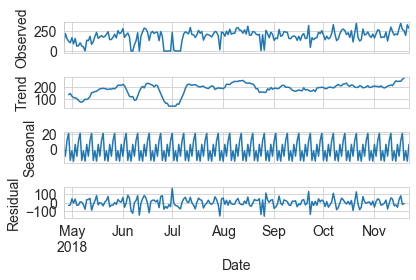

Minutes Fairly Active 



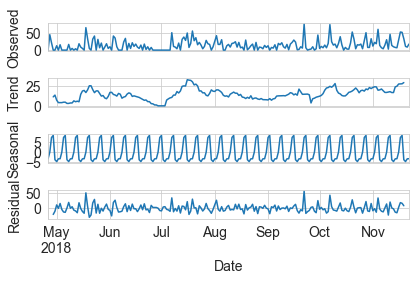

Minutes Very Active 



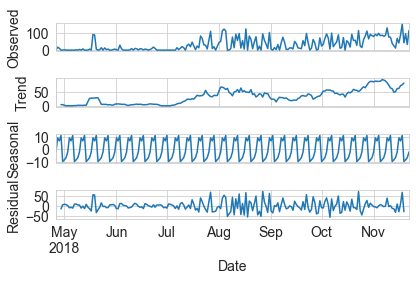

Activity Calories 



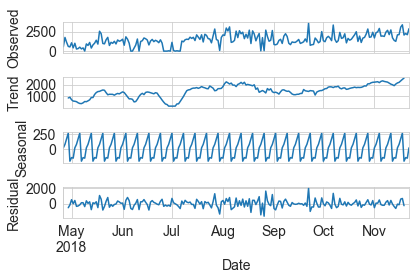

In [66]:
for var in train:
    print(var,'\n')
    _ = sm.tsa.seasonal_decompose(train[var].resample('D').mean()).plot()
    plt.show()

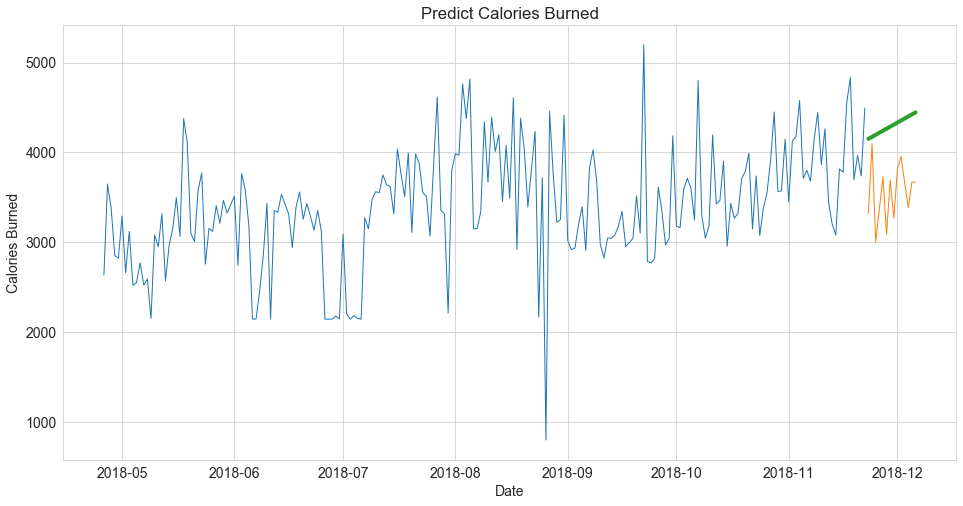

Calories Burned -- MSE: 647548.21 RMSE: 804.70


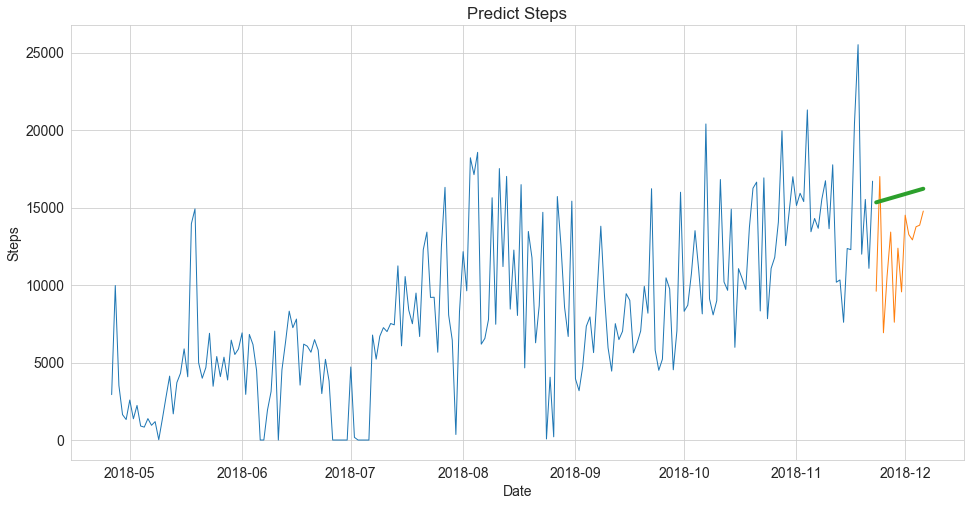

Steps -- MSE: 20358209.72 RMSE: 4512.01


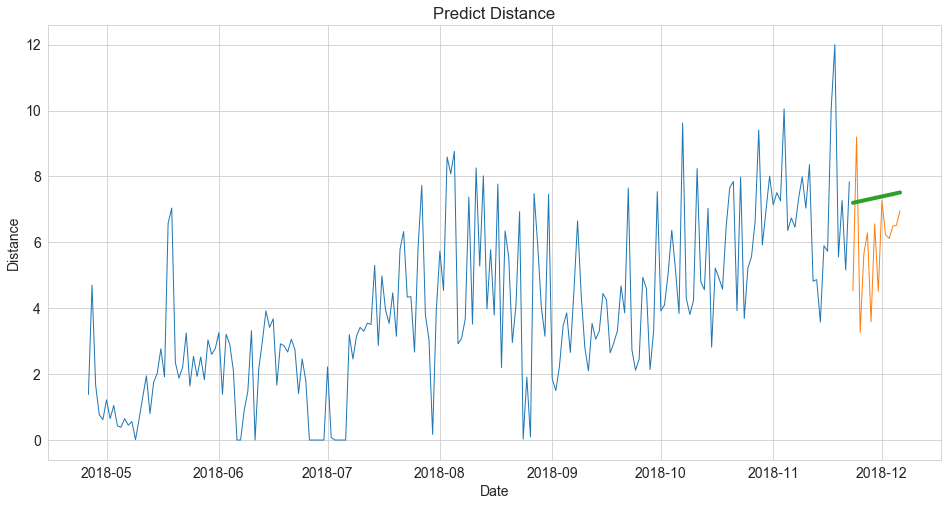

Distance -- MSE: 4.19 RMSE: 2.05


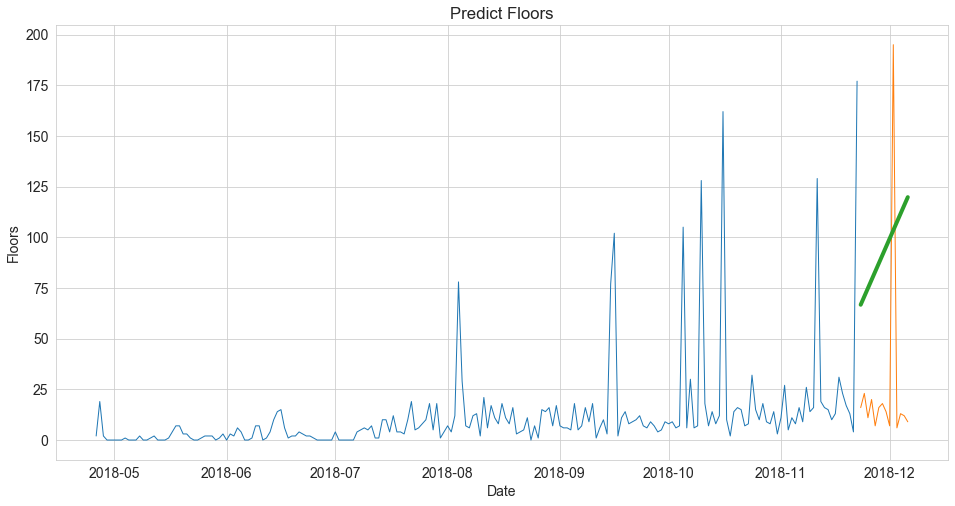

Floors -- MSE: 6801.58 RMSE: 82.47


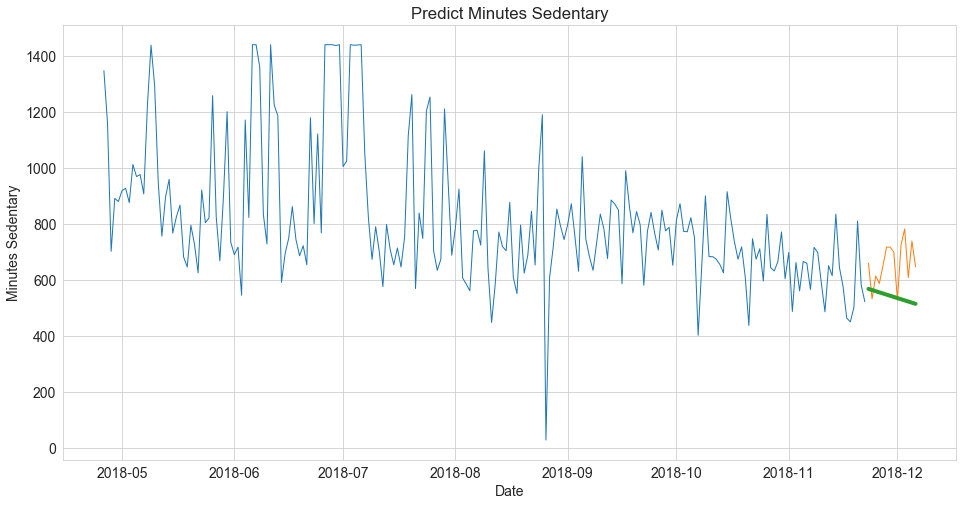

Minutes Sedentary -- MSE: 20289.18 RMSE: 142.44


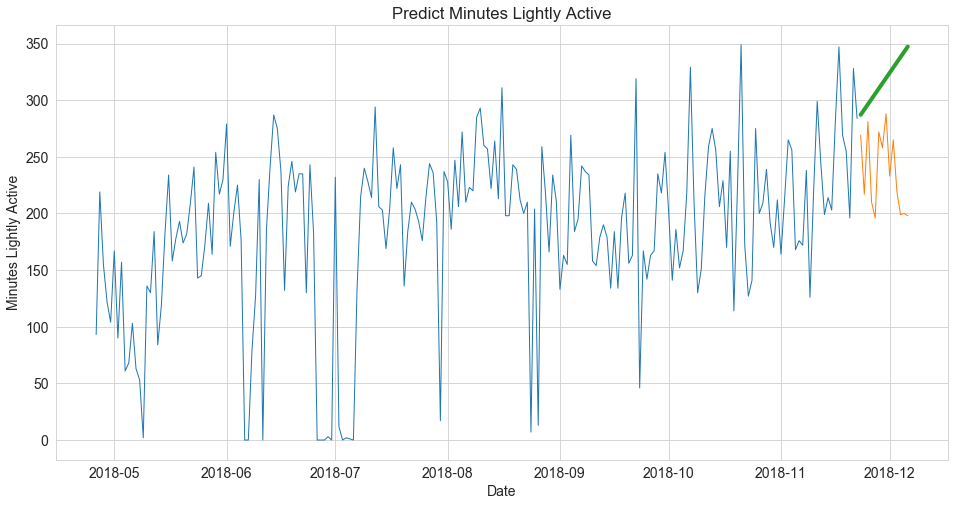

Minutes Lightly Active -- MSE: 8547.34 RMSE: 92.45


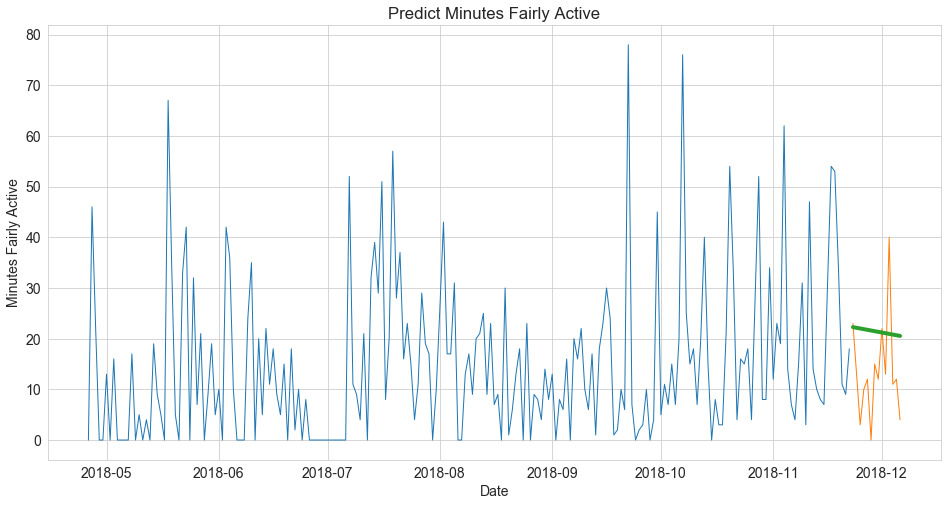

Minutes Fairly Active -- MSE: 153.69 RMSE: 12.40


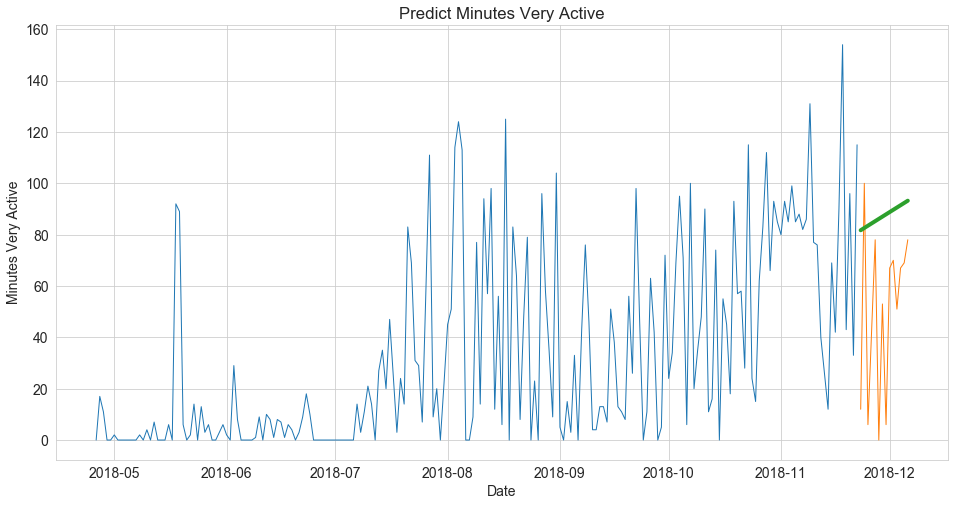

Minutes Very Active -- MSE: 2293.53 RMSE: 47.89


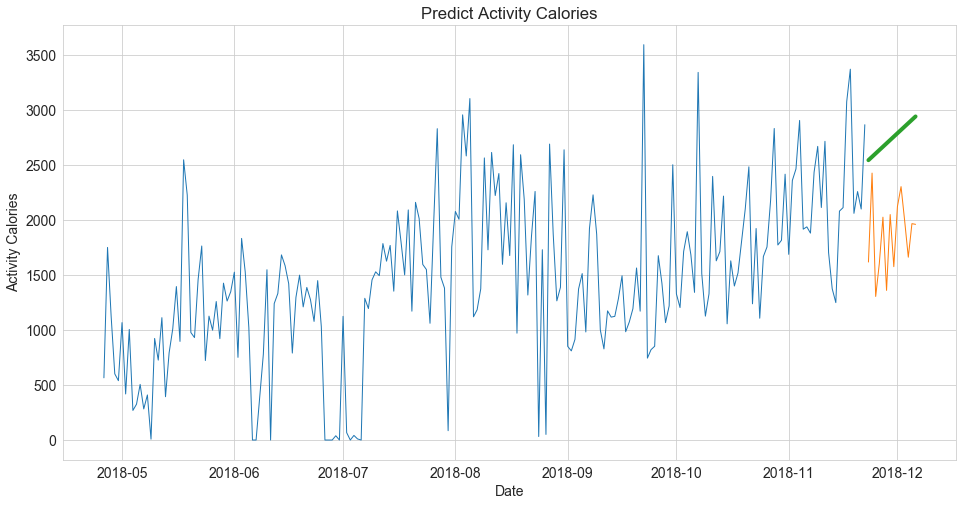

Activity Calories -- MSE: 891793.05 RMSE: 944.35


In [67]:
model.plot_and_eval(yhat, list(df.columns), train, test)

In [68]:
holts_linear = model.append_eval_df(yhat, 'Holts Linear Trend', train, test)
holts_linear

,model_type,target_var,metric,value
0,Holts Linear Trend,Calories Burned,mse,6.475482e+05
1,Holts Linear Trend,Calories Burned,rmse,8.047038e+02
2,Holts Linear Trend,Steps,mse,2.035821e+07
3,Holts Linear Trend,Steps,rmse,4.512007e+03
4,Holts Linear Trend,Distance,mse,4.192694e+00
5,Holts Linear Trend,Distance,rmse,2.047607e+00
6,Holts Linear Trend,Floors,mse,6.801575e+03
7,Holts Linear Trend,Floors,rmse,8.247166e+01
8,Holts Linear Trend,Minutes Sedentary,mse,2.028918e+04
9,Holts Linear Trend,Minutes Sedentary,rmse,1.424401e+02


# Holt's Exponential Linear trend


In [69]:
model1 = Holt(train['Calories Burned'],exponential =True).fit(smoothing_level=.3, smoothing_slope=.1, optimized=False)
# model2 = Holt(train['Steps'],exponential =True).fit(smoothing_level=.3, smoothing_slope=.1, optimized=False)
# model3 = Holt(train['Distance'],exponential =True).fit(smoothing_level=.3, smoothing_slope=.1, optimized=False)
# model4 = Holt(train['Floors'],exponential =True).fit(smoothing_level=.3, smoothing_slope=.1, optimized=False)
model5 = Holt(train['Minutes Sedentary'],exponential =True).fit(smoothing_level=.3, smoothing_slope=.1, optimized=False)
# model6 = Holt(train['Minutes Lightly Active'],exponential =True).fit(smoothing_level=.3, smoothing_slope=.1, optimized=False)
# model7 = Holt(train['Minutes Fairly Active'],exponential =True).fit(smoothing_level=.3, smoothing_slope=.1, optimized=False)
# model8 = Holt(train['Minutes Very Active'],exponential =True).fit(smoothing_level=.3, smoothing_slope=.1, optimized=False)
# model9 = Holt(train['Activity Calories'],exponential =True).fit(smoothing_level=.3, smoothing_slope=.1, optimized=False)

In [70]:
yhat['Calories Burned'] = pd.DataFrame(model1.forecast(test['Calories Burned'].shape[0]), columns = ['Calories Burned'])
yhat['Minutes Sedentary'] = pd.DataFrame(model5.forecast(test['Minutes Sedentary'].shape[0]), columns = ['Minutes Sedentary'])

In [71]:
target_vars = ['Calories Burned', 'Minutes Sedentary']

In [72]:
exp_yhat = yhat[['Calories Burned', 'Minutes Sedentary']]
exp_yhat

,Calories Burned,Minutes Sedentary
Date,,
2018-11-23,4165.721889,572.935567
2018-11-24,4193.214992,570.406880
2018-11-25,4220.889544,567.889355
2018-11-26,4248.746745,565.382940
2018-11-27,4276.787798,562.887588
2018-11-28,4305.013918,560.403249
2018-11-29,4333.426326,557.929875
2018-11-30,4362.026252,555.467418
2018-12-01,4390.814932,553.015828


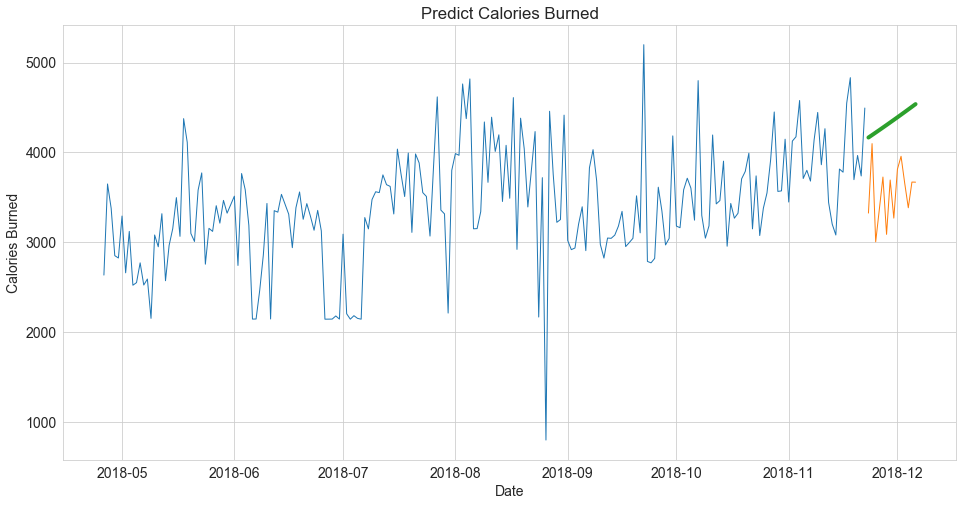

Calories Burned -- MSE: 727929.82 RMSE: 853.19


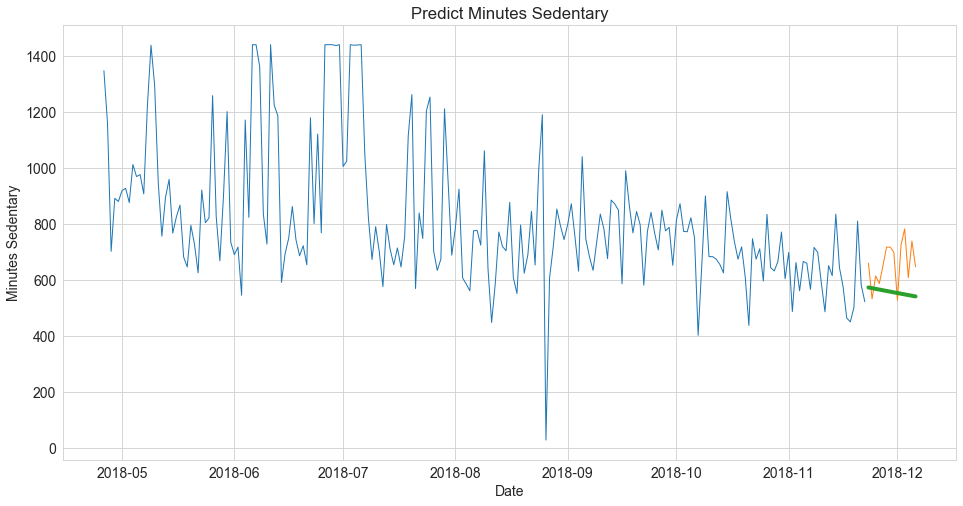

Minutes Sedentary -- MSE: 16348.34 RMSE: 127.86


In [73]:
model.plot_and_eval(exp_yhat, target_vars, train, test)



In [74]:
holts_exp = model.append_eval_df(exp_yhat, 'Holts Exponential Linear Trend', train[target_vars], test)
holts_exp

,model_type,target_var,metric,value
0,Holts Exponential Linear Trend,Calories Burned,mse,727929.822170
1,Holts Exponential Linear Trend,Calories Burned,rmse,853.188034
2,Holts Exponential Linear Trend,Minutes Sedentary,mse,16348.342555
3,Holts Exponential Linear Trend,Minutes Sedentary,rmse,127.860637


# Predicting on Previous Cycle

In [75]:
last_train_day = train.index[-1]
last_train_day

Timestamp('2018-11-22 00:00:00')

In [76]:
first_train_day = train.index[0]
first_train_day

Timestamp('2018-04-26 00:00:00')

In [77]:
two_wks_before_last_train_day = last_train_day - timedelta(14)
two_wks_before_last_train_day

Timestamp('2018-11-08 00:00:00')

In [78]:
four_wks_before_last_train_day = last_train_day - timedelta(28)
four_wks_before_last_train_day

Timestamp('2018-10-25 00:00:00')

In [79]:
yhat = train[two_wks_before_last_train_day:last_train_day-timedelta(1)] + train[four_wks_before_last_train_day:last_train_day-timedelta(1)].diff(14).mean()
yhat.index = pd.date_range('2018-11-23',periods=len(yhat))
yhat

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
2018-11-23,4188.142857,14868.857143,7.074286,39.0,685.5,274.214286,17.428571,75.071429,2559.428571
2018-11-24,4496.142857,16058.857143,7.734286,27.0,667.5,162.214286,33.428571,120.071429,2794.428571
2018-11-25,3914.142857,12962.857143,6.784286,29.0,558.5,255.214286,5.428571,66.071429,2238.428571
2018-11-26,4315.142857,17087.857143,8.104286,142.0,455.5,335.214286,49.428571,65.071429,2840.428571
2018-11-27,3495.142857,9510.857143,4.564286,32.0,620.5,280.214286,16.428571,29.071429,1828.428571
2018-11-28,3253.142857,9656.857143,4.614286,29.0,584.5,235.214286,12.428571,15.071429,1499.428571
2018-11-29,3132.142857,6924.857143,3.324286,28.0,804.5,250.214286,10.428571,1.071429,1373.428571
2018-11-30,3866.142857,11686.857143,5.644286,23.0,613.5,239.214286,9.428571,58.071429,2205.428571
2018-12-01,3831.142857,11612.857143,5.474286,26.0,545.5,317.214286,33.428571,31.071429,2237.428571
2018-12-02,4599.142857,19721.857143,9.804286,44.0,433.5,383.214286,56.428571,79.071429,3200.428571


In [80]:
train1 = train[four_wks_before_last_train_day:last_train_day]
train1

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Date,,,,,,,,,
2018-10-25,3379,11073,5.22,15,596,275,18,15,1669
2018-10-26,3549,11788,5.56,10,834,200,4,62,1756
2018-10-27,3915,14059,6.63,18,644,209,28,83,2181
2018-10-28,4450,19956,9.41,9,632,239,52,112,2834
2018-10-29,3566,12544,5.92,8,665,192,8,66,1774
2018-10-30,3572,14794,6.98,14,771,170,8,93,1817
2018-10-31,4147,16992,8.01,3,604,212,34,85,2418
2018-11-01,3448,15134,7.14,11,698,164,12,80,1689
2018-11-02,4126,15924,7.51,27,487,213,23,93,2361


In [81]:
test1 = test['2018-11-23':'2018-12-08']
test1

,Calories Burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories
Date,,,,,,,,,
2018-11-23,3325,9602,4.53,16,660,269,23,12,1619
2018-11-24,4098,17004,9.20,23,532,217,13,100,2428
2018-11-25,3005,6921,3.26,11,614,281,3,6,1306
2018-11-26,3364,10563,5.64,20,587,210,10,42,1605
2018-11-27,3726,13420,6.29,7,650,196,12,78,2027
2018-11-28,3088,7602,3.59,16,717,272,0,0,1361
2018-11-29,3693,12380,6.56,18,717,258,15,53,2051
2018-11-30,3269,9559,4.51,14,699,288,12,6,1577
2018-12-01,3813,14510,7.27,7,527,233,22,67,2124


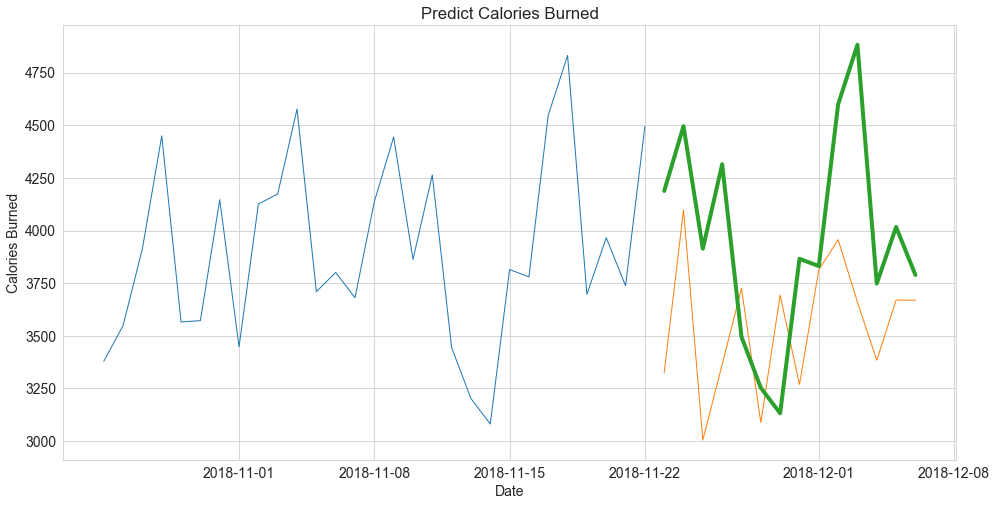

Calories Burned -- MSE: 397339.42 RMSE: 630.35


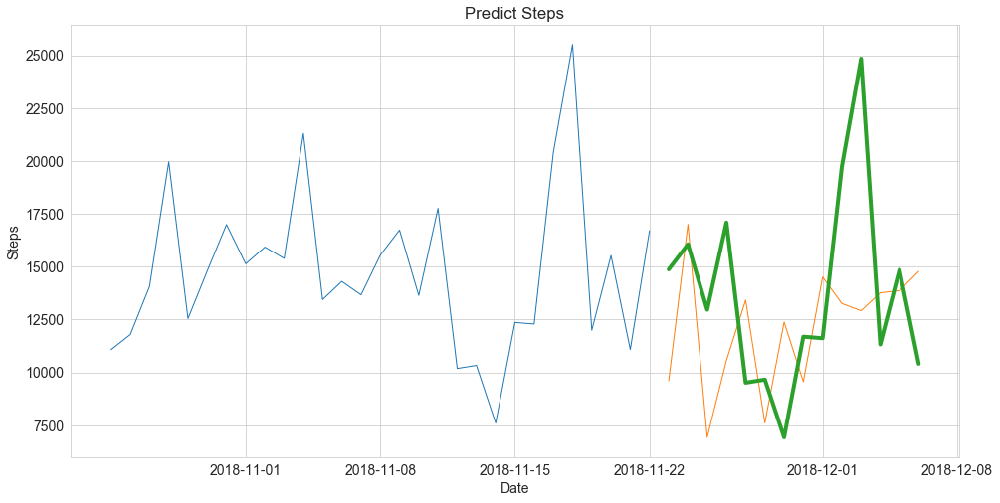

Steps -- MSE: 27135336.73 RMSE: 5209.16


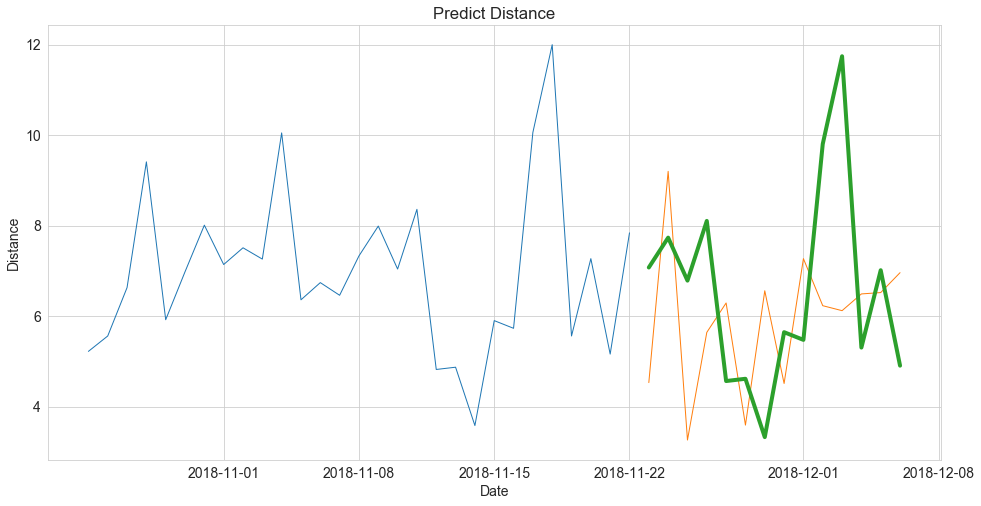

Distance -- MSE: 6.89 RMSE: 2.62


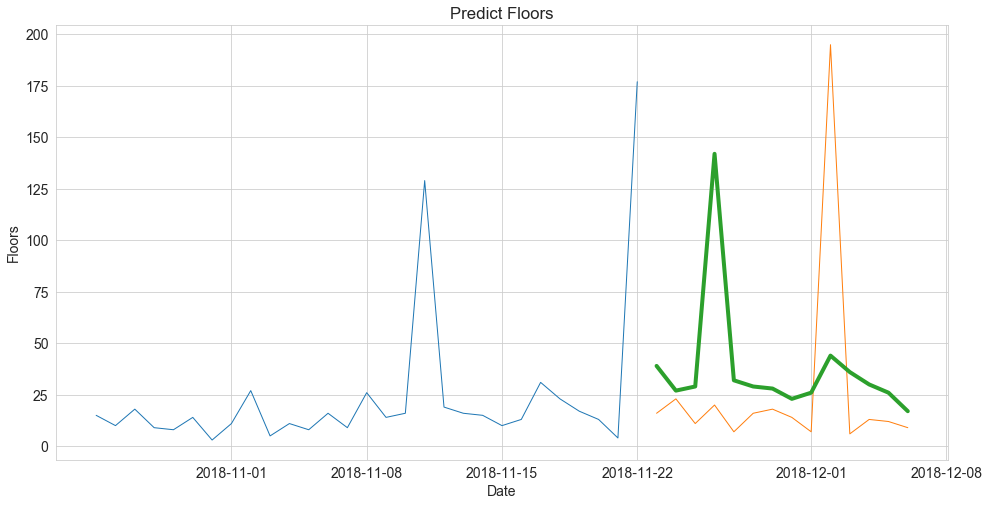

Floors -- MSE: 2952.79 RMSE: 54.34


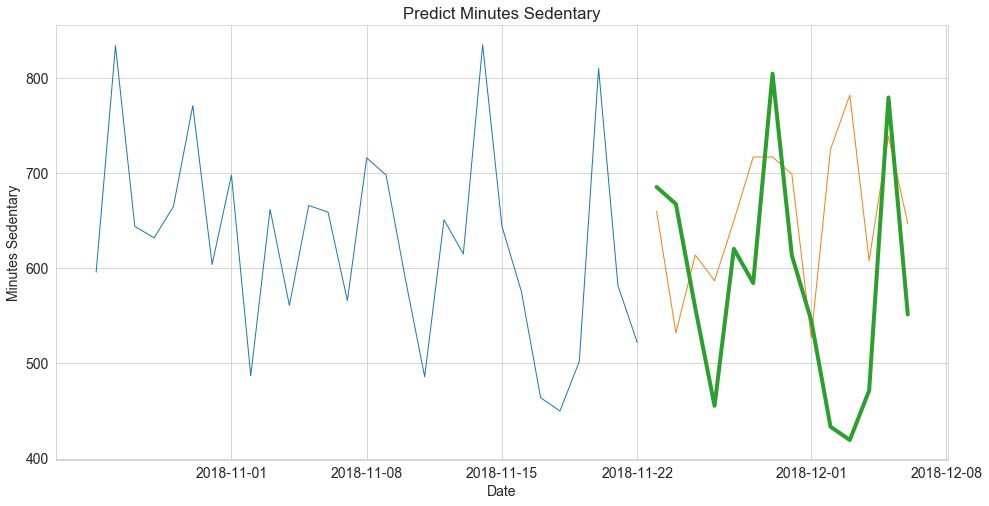

Minutes Sedentary -- MSE: 22777.82 RMSE: 150.92


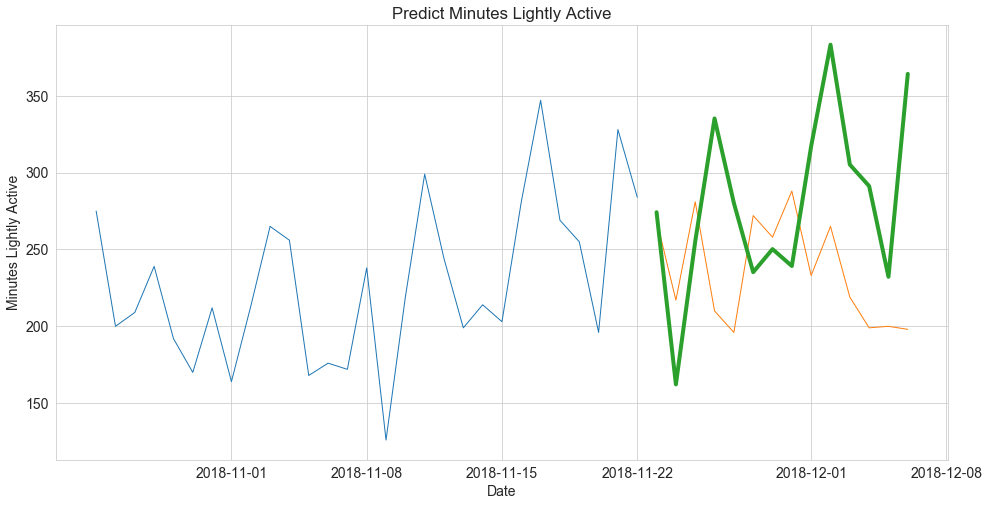

Minutes Lightly Active -- MSE: 6851.86 RMSE: 82.78


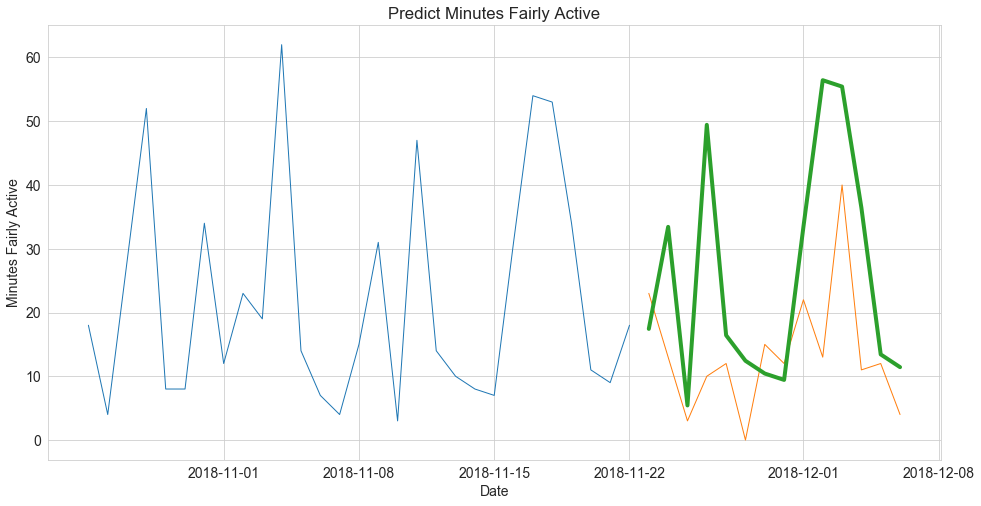

Minutes Fairly Active -- MSE: 369.21 RMSE: 19.21


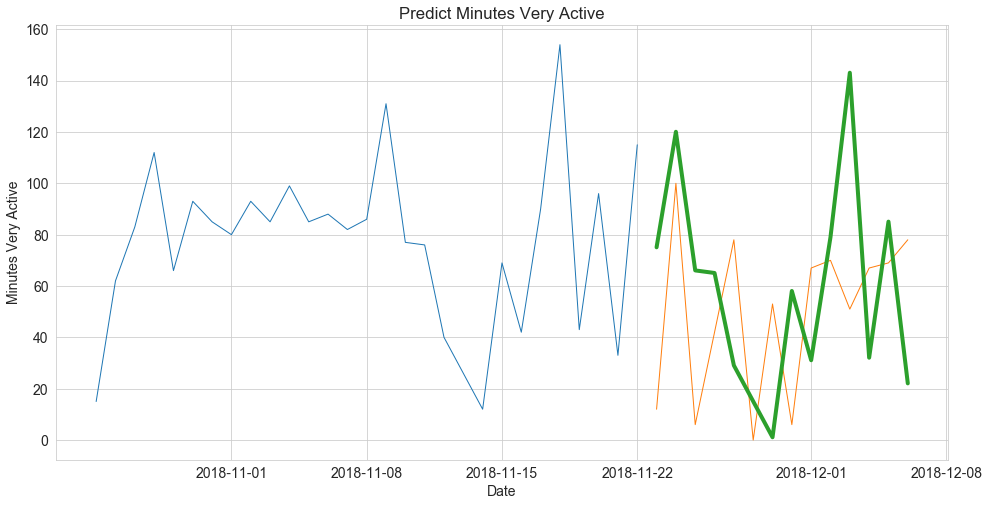

Minutes Very Active -- MSE: 2214.82 RMSE: 47.06


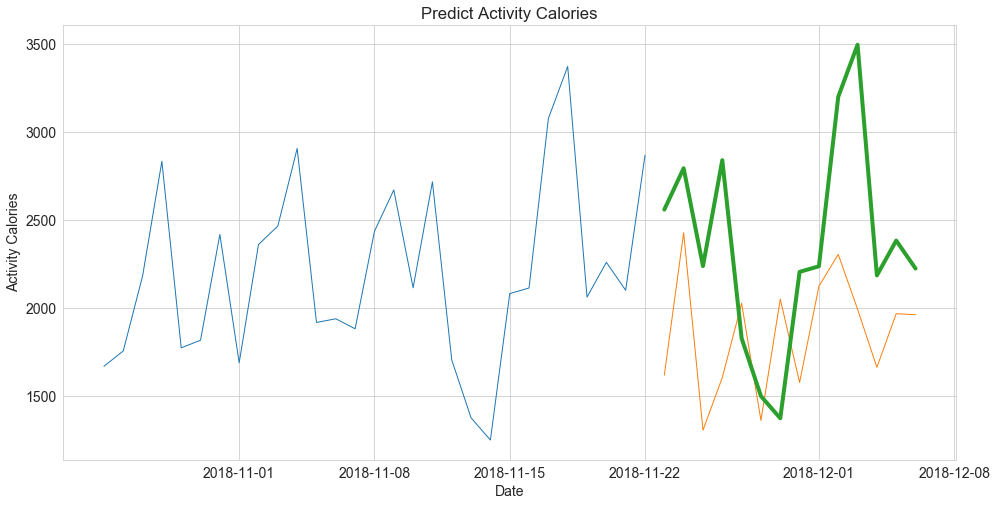

Activity Calories -- MSE: 565452.73 RMSE: 751.97


In [82]:
model.plot_and_eval(yhat, list(df.columns), train1, test1)

In [83]:
previous_cycle= model.append_eval_df(yhat, 'previous_cycle (2 wks)', train1, test1)


In [84]:
previous_cycle

,model_type,target_var,metric,value
0,previous_cycle (2 wks),Calories Burned,mse,3.973394e+05
1,previous_cycle (2 wks),Calories Burned,rmse,6.303486e+02
2,previous_cycle (2 wks),Steps,mse,2.713534e+07
3,previous_cycle (2 wks),Steps,rmse,5.209159e+03
4,previous_cycle (2 wks),Distance,mse,6.886257e+00
5,previous_cycle (2 wks),Distance,rmse,2.624168e+00
6,previous_cycle (2 wks),Floors,mse,2.952786e+03
7,previous_cycle (2 wks),Floors,rmse,5.433954e+01
8,previous_cycle (2 wks),Minutes Sedentary,mse,2.277782e+04
9,previous_cycle (2 wks),Minutes Sedentary,rmse,1.509232e+02


In [85]:
metrics = pd.concat(
                [last_observed_metrics,
                 simple_average, 
                 moving_average_2, 
                 moving_average_7, 
                 moving_average_14, 
                 moving_average_21,
                 moving_average_30,
                 moving_average_60,
                 moving_average_90,
                 holts_linear,
                 holts_exp,
                 previous_cycle]).sort_values(by='target_var')


In [86]:
metrics_rmse = metrics[metrics.metric == 'rmse']
metrics_rmse

,model_type,target_var,metric,value
17,previous_cycle (2 wks),Activity Calories,rmse,751.965913
17,Simple Average,Activity Calories,rmse,513.598004
17,Moving Average (7 days),Activity Calories,rmse,767.279657
17,Moving Average (14 days),Activity Calories,rmse,526.455344
17,Moving Average (21 days),Activity Calories,rmse,527.333685
17,Moving Average (2 days),Activity Calories,rmse,707.919260
17,Last Observed,Activity Calories,rmse,1063.018109
17,Moving Average (30 days),Activity Calories,rmse,448.724252
17,Moving Average (60 days),Activity Calories,rmse,329.643653
17,Moving Average (90 days),Activity Calories,rmse,346.609501


In [87]:
min_rmse = []
for i in train.columns:
    print('\n', metrics_rmse[metrics_rmse.target_var == i].min())
    min_rmse.append(metrics_rmse[metrics_rmse.target_var==i].min()['value'])
    
    


 model_type    Holts Exponential Linear Trend
target_var                   Calories Burned
metric                                  rmse
value                                308.225
dtype: object

 model_type    Holts Linear Trend
target_var                 Steps
metric                      rmse
value                    2837.42
dtype: object

 model_type    Holts Linear Trend
target_var              Distance
metric                      rmse
value                    1.50188
dtype: object

 model_type    Holts Linear Trend
target_var                Floors
metric                      rmse
value                    47.1207
dtype: object

 model_type    Holts Exponential Linear Trend
target_var                 Minutes Sedentary
metric                                  rmse
value                                77.3087
dtype: object

 model_type        Holts Linear Trend
target_var    Minutes Lightly Active
metric                          rmse
value                        33.2565
dtype: object


In [88]:
min_rmse

[308.22501314811996,
 2837.4157079641304,
 1.501875529843554,
 47.12072809149935,
 77.30866499002349,
 33.256458974040875,
 9.54500617376138,
 30.821316691702663,
 329.6436533808678]

***Take Aways:*** Holt's Linear Trend works the best across all variables.

In [89]:
from fbprophet import Prophet
pd.plotting.register_matplotlib_converters()

ERROR:fbprophet:Importing plotly failed. Interactive plots will not work.


In [90]:
from fbprophet.diagnostics import cross_validation, performance_metrics
from fbprophet.plot import plot_cross_validation_metric, plot_forecast_component

In [ ]:
rmse_metric = []
def prophet_rmse(train):
    for i in train.columns:
        df = train[[i]].reset_index().rename(columns = {'Date': 'ds', i: 'y'})
        m=Prophet()
        m.fit(df)
        future = m.make_future_dataframe(periods=14)
        forcast = m.predict(future)
        df_cv =cross_validation(m, horizon='14 days')
        df_p = performance_metrics(df_cv)
        rmse_metric.append(df_p['rmse'][12])
    return rmse_metric
        
        
        

In [ ]:
rmse = prophet_rmse(train)

In [ ]:
prophet_df = pd.DataFrame({'variable':train.columns,'RMSE_prophet': rmse, 'min_rmse':min_rmse})

In [ ]:
prophet_df.to_csv('prophet_df.csv')

In [92]:
pd.read_csv('prophet_df.csv')

,Unnamed: 0,variable,RMSE_prophet,min_rmse
0,0,Calories Burned,660.844186,308.225013
1,1,Steps,4273.166584,2837.415708
2,2,Distance,2.026476,1.501876
3,3,Floors,31.229662,47.120728
4,4,Minutes Sedentary,233.839659,77.308665
5,5,Minutes Lightly Active,88.539112,33.256459
6,6,Minutes Fairly Active,14.051038,9.545006
7,7,Minutes Very Active,32.238672,30.821317
8,8,Activity Calories,725.121762,329.643653


In [115]:
df = pd.read_csv('prophet_df.csv')
df = df[['variable','min_rmse']].set_index('variable')
df['model'] = ['holt exponential',
               'holt linear',
               'holt linear',
               'fbprophet',
               'holt exponential',
               'holt linear',
               'holt linear',
               'holt linear',
               'holt linear']
df['min_rmse']['Floors'] = 31.229662
df.to_csv('min_rmse_table.csv')
df

,min_rmse,model
variable,,
Calories Burned,308.225013,holt exponential
Steps,2837.415708,holt linear
Distance,1.501876,holt linear
Floors,31.229662,fbprophet
Minutes Sedentary,77.308665,holt exponential
Minutes Lightly Active,33.256459,holt linear
Minutes Fairly Active,9.545006,holt linear
Minutes Very Active,30.821317,holt linear
Activity Calories,329.643653,holt linear


***Take Aways:*** Only floors did better with the prophet model.

# Conclusions:

Exploring the activity data of the fitbit given let us see that over time the person was more active. They started out being the most sedentary in the first 90 days. Towards the end of data the person is more active.

Using models we are able to more accurately predict the future two weeks than only using a baseline of last value observed, or mean of observations. Using Holt's models we were able to minimize our rmse values.